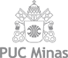
<B>PONTIFÍCIA UNIVERSIDADE CATÓLICA DE MINAS GERAIS

NÚCLEO DE EDUCAÇÃO A DISTÂNCIA

Pós-graduação Lato Sensu em Ciência de Dados e Big Data

Título: Segmentação de Vendedores do marketplace Olist Store em 2017

Aluno: Alexandre Luís Nunes Cardiga</B>


<B>Nome:</B> 02_Analise_e_Exploracao_Dados.ipynb

<B>Data:</B> 15/02/2022
    
<B>Objetivo:</B>
    
<B>Bibliotecas:</B>  sys,pandas, numpy,matplotlib,BeautifulSoup,bs4,urllib,minhas_funcoes
<a class="anchor" id="etapas"></a>
## Indice

1. [Análise e Exploração dos Dados](#aexpd)<br>
&emsp;1.1 [Classificação das Features](#ifeat)<br>
&emsp;1.2 [Estatistica Descritiva](#edesc)<br>
&emsp;&emsp;1.2.1 [Features Continuas](#feacon)<br>
&emsp;&emsp;1.2.2 [Features Discretas](#feadis)<br>
&emsp;&emsp;1.2.3 [Features Categóricas](#feacat)<br>
&emsp;1.3 [Análises Features](#analise)<br>
&emsp;&emsp;1.3.1 [Univariadas](#univar)<br>
&emsp;&emsp;&emsp;1.3.1.1 [Continuas](#unicon)<br>
&emsp;&emsp;&emsp;1.3.1.2 [Discretas](#unidis)<br>
&emsp;&emsp;&emsp;1.3.1.3 [Categóricas](#unicat)<br>
&emsp;&emsp;1.3.2 [Bivariadas](#bivvar)<br>

## <a class="anchor" id="aexpd">1. Análise e Exploração dos Dados</a>

In [25]:
# Apaga todas as variáveis
%reset

Once deleted, variables cannot be recovered. Proceed (y/[n])? y


In [1]:
#recursos alocados
%whos

Interactive namespace is empty.


In [2]:
import sys
import os
import pandas as pd
import numpy as np
import requests
import matplotlib.pyplot as plt


import seaborn as sns
#import datetime

from datetime import datetime as dt


from scipy import stats
from scipy.stats    import normaltest, kstest,norm
from geopy.geocoders import Nominatim
from geopy.extra.rate_limiter import RateLimiter


import warnings 
if not sys.warnoptions:
    #warnings.filterwarnings('ignore')
    warnings.simplefilter('ignore')

# Define a pasta onde está o arquivo minhas_funcoes.py
sys.path.insert(0, '../Lib')

# Importar minhas_funcoes.py
import minhas_funcoes as mf

import locale
locale.setlocale(locale.LC_ALL, 'pt_BR.utf8')

caminho = '../Data/'
caminho_temp = '../Template/'

#exibe todas as colunas
#pd.set_option('display.max_columns', None)
pd.set_option('display.max_columns', 150)
#pd.set_option('display.max_columns', 999999999)
#pd.set_option('display.max_rows', 999999999)
pd.set_option('display.max_rows', 150)

In [ ]:
#stats_airbnb = data_Airbnb.describe().T
#stats_airbnb['Coeficiente_de_variación'] = stats_airbnb['std']/stats_airbnb['mean']
#stats_airbnb

In [112]:
def visual_4(p_data, p_lista):
    '''
     Descrição:
       Imprime:histograma, boxplot, violinplot e distibuição cumulativa 
       p/ cada feature passada como parametro.
    
    argumentos:  
      p_data:    Datafraame, 
      p_lista    lista das features
    Return:
        Nenhum    
    Exceção:
        Nenhum
    
    '''
    for coluna in p_lista:
        plt.style.use('seaborn')
        fig = plt.figure(figsize=(16, 8))
        plt.subplots_adjust(hspace = 0.6)
        #sns.set_palette('Pastel1')
    
        plt.subplot(221, frameon=True)                
        ax1 = sns.distplot(p_data[coluna], bins = 20,kde=True,hist_kws={'edgecolor':'k','linewidth':0.5,'density': True} )
        #ax1 = sns.distplot(p_data[coluna], bins=20, hist_kws={"density": True})
        #moda
        ax1.axvline(p_data[coluna].mode()[0], label='Moda',color="green", linestyle=":")      
        # media
        ax1.axvline(np.mean(p_data[coluna]), label='Media',color="red", linestyle="--")  
        # mediana
        ax1.axvline( np.median(p_data[coluna]),label='Mediana', color="blue", linestyle="-" )  
        plt.title(' Distribuição - '+ coluna.capitalize())
        plt.legend() 
        
        plt.subplot(222, frameon=True, sharex=ax1)
        ax2 = sns.kdeplot(p_data[coluna], cumulative=True)
        plt.title('Distribuição Cumulativa - '+ coluna.capitalize())     
        
        plt.subplot(223, frameon=True)
        stats.probplot(p_data[coluna], dist='norm', plot=plt)
        plt.title('Verificar normalidade - '+coluna.capitalize())                       
 
        plt.subplot(224, frameon=True, sharex=ax2)
        ax4 = sns.boxplot(x=p_data[coluna], palette = 'cool', width=0.7, linewidth=0.6, showmeans=True)
        plt.title('Outliers - '+ coluna.capitalize())
    
    
        plt.show() 

In [3]:
def estatistica_quanti(p_data, p_significancia,p_lista_features):
    """
    Descrição:
        Estatistica Descritiva c/ verificação de testes de normalidade
    argumentos:
        p_data            dataframe a ser analisado
        p_significancia   nivel de significancia, geralmente 0.05
        p_lista_features  features do dataframe a serem analisadas
    Return:
        dataframe com informações    
    Exceção:
        Nenhum
    """  
  
    df = pd.DataFrame(columns=['feature','count','mean', 'median','std','var','Coeficiente_Variacao_%','mod', 'min', '25%', '50%', '75%',\
                'max','range', 'skew','Assimetria',\
                'kurtosis','curtose','NormalTeste','NormalTeste_p','Rejeitar H0','Teste_Shapiro','Teste_Shapiro_p',\
                'Rejeitar H0-Shapiro'])
  
    for var in p_lista_features:
    
        conta = round(p_data[var].describe().loc['count'], 2)
        media = round(p_data[var].describe().loc['mean'], 2)
        mediana = round(p_data[var].median(), 2)
        variancia = round(p_data[var].var(), 2)
        desvio_padrao = round(p_data[var].describe().loc['std'], 2)
        moda = p_data[var].mode()[0]
        minimo = round(p_data[var].describe().loc['min'], 2)
        q1 = round(p_data[var].describe().loc['25%'], 2)
        med = round(p_data[var].describe().loc['50%'], 2)
        q3 = round(p_data[var].describe().loc['75%'], 2)
        maximo = round(p_data[var].describe().loc['max'], 2)
        range = maximo - minimo
        skew = round(p_data[var].skew(), 2)
        kurtosis = round(p_data[var].kurtosis(), 2)  
        
        #H0=é normal
        #Ha=não é normal
        normaltest_teste,normaltest_valor_p = normaltest(p_data[var])
        resposta_H0 = normaltest_valor_p <= p_significancia
        
        #Teste de Kolmogorov-Smirnov
        #normal_shapiro_teste, normal_shapiro_valor_p = stats.shapiro(p_data[var])
        #normal_ks_teste, normal_ks_valor_p = kstest(p_data[var], 'norm')
        
        #Uso o teste Shapiro-Wilk tem precisão para amostras até 5000, que é o caso(1658) 
        
        normal_shapiro_teste, normal_shapiro_valor_p = stats.shapiro(p_data[var])        
        resposta_H0_shapiro = normal_shapiro_valor_p <= p_significancia  
        
        coe_var = round(desvio_padrao / media,2)*100
        
        if media > mediana:
            assimetria='Direita'
        elif mediana > media:
            assimetria='Esquerda'
        elif mediana == media:
            assimetria='Zero'
            
        if kurtosis > 3:
            curtose ='leptocúrtica-cauda fina e lisa'
        elif kurtosis == 3:
            curtose='dist.normal'
        elif kurtosis < 3:
            curtose='platicúrtica-cauda grossa e pontiaguda'       
 
        ser= pd.Series({'feature':var,'count':conta , 'mean':media ,'median':mediana,\
                 'var':variancia, 'std':desvio_padrao ,'Coeficiente_Variacao_%':coe_var,'mod':moda,\
                 'min': minimo, '25%':q1 ,'50%':med ,'75%':q3 ,'max':maximo ,
                 'range':range, 'skew':skew,  'Assimetria':assimetria, 'kurtosis':kurtosis,'curtose':curtose,\
                 'NormalTeste':normaltest_teste,  'NormalTeste_p':normaltest_valor_p, 'Rejeitar H0':resposta_H0,\
                 'Teste_Shapiro':normal_shapiro_teste, 'Teste_Shapiro_p':normal_shapiro_valor_p, \
                 'Rejeitar H0-Shapiro':resposta_H0_shapiro    })
        ser.name=var
        df=df.append(ser)
        #df.reset_index(drop=True, inplace=True)
        df.set_index('feature')
    return df    


In [ ]:
def countplot_com_perc(p_st,p_dados,p_titulo,p_label_x,p_legenda_tit,p_legenda_lista):
    """
    Descrição:
        Plotar Countplot com label de % e legenda opcional
    argumentos:
        p_st             feature a ser plotada
        p_dados          dataframe
        p_titulo         titulo do grafico
        p_label_x        label do eixo X
        p_legenda_tit    se informado, titulo da legenda
        p_legenda_lista  itens da legenda
    Return:
        Nenhum    
    Exceção:
        Nenhum
    """     
    plt.style.use('seaborn')
    countplt, ax = plt.subplots(figsize = (10,7))
    if bool(p_legenda_tit):
        ax =sns.countplot(x = p_st, hue=p_st, data=p_dados, orient='h', dodge=False )     
    else:
        ax =sns.countplot(x = p_st, data=p_dados, orient='h', dodge=False )
        
    ax.set_title(p_titulo, fontsize=20)
    ax.set_xlabel(p_label_x, fontsize=17)
    ax.set_ylabel("Contagem", fontsize=17)
    ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
    total = len(p_dados)
    
    for p in ax.patches:
        percentage = '{:.1f}%'.format(100 * p.get_height()/total)
        x = p.get_x() + p.get_width()
        y = p.get_height()
        ax.annotate(percentage, (x, y),ha='right',size=10)  

    if bool(p_legenda_tit):
        plt.legend(p_legenda_lista, title = p_legenda_tit, bbox_to_anchor = (1.141,1))
    
    countplt

## <a class="anchor" id="ifeat">1.1 Classificação das Features</a>

In [4]:
df_abt = pd.read_excel(caminho_temp+'01_Coleta_Processamento_df_Analytic_Base_Table.xlsx')

In [5]:
df_abt.shape

(1658, 88)

In [20]:
df_abt.dtypes

vendedor_id                                     object
vendedor_cidade                                 object
vendedor_estado                                 object
vendedor_cidade_id                               int64
vendedor_estado_id                               int64
vendedor_grande_regiao_id                        int64
vendedor_grande_regiao_nome                     object
review_score_moda                                int64
plano                                           object
plano_valor                                    float64
plano_comissao                                 float64
valor_taxa                                       int64
valor_comissao                                 float64
custo_frete                                    float64
distancia_cliente_vendedor_mediana             float64
qtd_clientes                                     int64
qtd_clientes_repete                              int64
qtd_itens_pedido_mediana                         int64
preco     

In [6]:
features_original=df_abt.columns
len(features_original)

88

In [27]:
df_abt.head(3)

,vendedor_id,vendedor_cidade,vendedor_estado,vendedor_cidade_id,vendedor_estado_id,vendedor_grande_regiao_id,vendedor_grande_regiao_nome,review_score_moda,plano,plano_valor,plano_comissao,valor_taxa,valor_comissao,custo_frete,distancia_cliente_vendedor_mediana,qtd_clientes,qtd_clientes_repete,qtd_itens_pedido_mediana,preco,frete_valor,preco_frete,qtd_pedidos,qtd_produtos,produto_peso_g_mediana,produto_volume_cm3_mediana,densidade_produto_mediana,produto_categoria_nome_moda,produto_categoria_id_moda,Area(km2)_mediana,populacao_mediana,habit_km2_mediana,tempo_entrega_compra_mediana,tempo_aprovado_compra_mediana,tempo_estimado_compra_mediana,tempo_postagem_compra_mediana,tempo_entrega_aprovado_LeadTime_mediana,tempo_postagem_aprovado_mediana,tempo_entrega_postagem_mediana,postagem_limiteparceiro_variacao_mediana,postagem_limiteparceiro_dias_atraso_mediana,postagem_limiteparceiro_atrasado_moda,entrega_estimado_variacao_mediana,entrega_estimado_dias_atraso_mediana,entrega_estimado_atrasado_moda,qtd_pedidos_Nacional_Estadual_Comemorativa,qtd_clientes_capital,qtd_clientes_fora_estado,"PIB_percapita_(11000,19000]","PIB_percapita_(19000,27000]","PIB_percapita_(27000,35000]","PIB_percapita_(3285,11000]","PIB_percapita_(35000,43000]","PIB_percapita_(43000,51000]","PIB_percapita_(51000,344847]",pagamento_tipo_boleto,pagamento_tipo_cartao_credito,pagamento_tipo_cartao_debito,pagamento_tipo_voucher,pagamento_parcelas_boleto,pagamento_parcelas_cartao_credito,pagamento_parcelas_cartao_debito,pagamento_parcelas_voucher,pagamento_sequencia_boleto,pagamento_sequencia_cartao_credito,pagamento_sequencia_cartao_debito,pagamento_sequencia_voucher,pagamento_valor_boleto,pagamento_valor_cartao_credito,pagamento_valor_cartao_debito,pagamento_valor_voucher,custo_reviews,meses_olist,dias_olist,qtd_pedidos_pontos,preco_pontos,review_score_pontos,tempo_postagem_compra_pontos,vendedor_pontuacao,vendedor_score,receitas,adm_custos,lucro,velocidade_km_dias,frequencia,dias_entre_pedidos,vlr_medio_pedido,razao_frete_preco,razao_frete_pedidos
0,0015a82c2db000af6aaaf3ae2ecb0532,santo andre,SP,3547809,35,3,Sudeste,5,Lite,18.99,0.21,0,563.85,31.53,687.8890,3,3,1.0,2685.00,63.06,2748.06,3,3,11800.0,61920.0,0.19,eletroportateis,15,1234.5370,92386.002,33.480,10.0,0.0,24.0,2.0,9.0,1.0,7.0,-5.0,0.0,0,-13.0,0.0,0,1,0,0,1,0,1,0,1,0,0,0,3,0,0,0,22,0,0,0,3,0,0,0.00,2748.06,0.0,0.00,40,1.0,21,2,4,2,3,2423,11,582.84,230.68,280.63,76.43,0.142857,7,916.02,0.02,21.02
1,001cca7ae9ae17fb1caed9dfb1094831,cariacica,ES,3201308,32,3,Sudeste,5,Pro,173.99,0.19,25,3868.42,3399.56,735.3060,166,166,1.0,20360.23,6963.92,27324.15,166,167,9000.0,19656.0,0.46,ferramentas_jardim,17,520.8070,402027.039,1465.140,10.0,0.0,25.0,2.0,10.0,1.0,8.0,-5.0,0.0,0,-14.0,0.0,0,10,60,5,15,36,15,4,25,21,50,38,127,0,2,38,533,0,3,38,127,0,3,6434.32,20761.86,0.0,213.94,1285,11.0,326,4,4,2,3,4423,13,5807.31,1715.94,-593.19,73.53,0.509202,2,164.60,0.34,41.95
2,002100f778ceb8431b7a1020ff7ab48f,franca,SP,3516200,35,3,Sudeste,5,Basic,68.99,0.20,210,156.36,0.00,353.5575,38,38,1.0,781.80,593.53,1375.33,38,42,300.0,9600.0,0.03,moveis_decoracao,26,539.7165,399307.051,843.435,13.5,0.0,22.0,4.0,13.0,3.0,9.0,-3.5,0.0,0,-9.0,0.0,0,4,12,18,4,7,1,1,4,8,13,16,20,0,5,16,35,0,5,16,20,0,5,611.49,677.63,0.0,139.68,305,3.0,105,4,3,2,2,4322,11,573.33,820.99,-552.66,27.20,0.361905,3,36.19,0.76,15.62


In [6]:
#verificar a cardinalidade
for col in features_original:
    if df_abt[col].nunique()<14:
        print("Feature {} cardinalidade={}".format(col,df_abt[col].nunique()))

Feature vendedor_grande_regiao_id cardinalidade=5
Feature vendedor_grande_regiao_nome cardinalidade=5
Feature review_score_moda cardinalidade=5
Feature plano cardinalidade=3
Feature plano_valor cardinalidade=3
Feature plano_comissao cardinalidade=3
Feature qtd_itens_pedido_mediana cardinalidade=6
Feature tempo_aprovado_compra_mediana cardinalidade=6
Feature postagem_limiteparceiro_atrasado_moda cardinalidade=2
Feature entrega_estimado_atrasado_moda cardinalidade=2
Feature pagamento_tipo_cartao_debito cardinalidade=7
Feature pagamento_parcelas_cartao_debito cardinalidade=7
Feature pagamento_sequencia_cartao_debito cardinalidade=7
Feature meses_olist cardinalidade=12
Feature qtd_pedidos_pontos cardinalidade=4
Feature preco_pontos cardinalidade=4
Feature review_score_pontos cardinalidade=2
Feature tempo_postagem_compra_pontos cardinalidade=4
Feature vendedor_score cardinalidade=11


In [7]:
features_dis=['qtd_clientes', 'qtd_clientes_repete', 'qtd_itens_pedido_mediana', 'qtd_pedidos',
        'qtd_produtos',  'tempo_entrega_compra_mediana', 'tempo_aprovado_compra_mediana',
        'tempo_estimado_compra_mediana', 'tempo_postagem_compra_mediana', 'tempo_entrega_aprovado_LeadTime_mediana',
        'tempo_postagem_aprovado_mediana', 'tempo_entrega_postagem_mediana', 'postagem_limiteparceiro_variacao_mediana',
        'postagem_limiteparceiro_dias_atraso_mediana', 
        'entrega_estimado_variacao_mediana', 'entrega_estimado_dias_atraso_mediana',
        'qtd_pedidos_Nacional_Estadual_Comemorativa', 'qtd_clientes_capital', 'qtd_clientes_fora_estado',
        'PIB_percapita_(11000,19000]', 'PIB_percapita_(19000,27000]', 'PIB_percapita_(27000,35000]',
        'PIB_percapita_(3285,11000]', 'PIB_percapita_(35000,43000]', 'PIB_percapita_(43000,51000]',
        'PIB_percapita_(51000,344847]',
        'pagamento_tipo_boleto', 'pagamento_tipo_cartao_credito', 'pagamento_tipo_cartao_debito', 'pagamento_tipo_voucher',
        'pagamento_parcelas_boleto', 'pagamento_parcelas_cartao_credito', 'pagamento_parcelas_cartao_debito',
        'pagamento_parcelas_voucher', 'pagamento_sequencia_boleto', 'pagamento_sequencia_cartao_credito',
        'pagamento_sequencia_cartao_debito', 'pagamento_sequencia_voucher', 'meses_olist', 'dias_olist',
        'qtd_pedidos_pontos', 'preco_pontos', 'review_score_pontos', 'tempo_postagem_compra_pontos', 'vendedor_pontuacao',
        'vendedor_score','dias_entre_pedidos','review_score_moda'    
        ]

In [8]:
features_cat=['produto_categoria_nome_moda', 'plano','vendedor_cidade','vendedor_estado','vendedor_grande_regiao_nome',
        'postagem_limiteparceiro_atrasado_moda','entrega_estimado_atrasado_moda'      
        ]

In [9]:
features_id=['vendedor_cidade_id', 'vendedor_grande_regiao_id','vendedor_estado_id','vendedor_id',
        'produto_categoria_id_moda']

In [10]:
features_con = list(set(features_original) - set(features_dis) - set(features_cat)- set(features_id))

In [11]:
print("{} - Features originais".format(len(features_original)))
print("{} - Features discretas".format(len(features_dis)))
print("{} - Features categóricas".format(len(features_cat)))
print("{} - Features continuas".format(len(features_con)))
print("{} - Features identificação(id)".format(len(features_id)))

88 - Features originais
48 - Features discretas
7 - Features categóricas
28 - Features continuas
5 - Features identificação(id)


In [12]:
features_numericas_relevantes= features_dis + features_con

In [13]:
len(features_numericas_relevantes)

76

In [13]:
for col in features_numericas_relevantes:
    print("Feature {} cardinalidade={}".format(col,df_abt[col].nunique()))

Feature qtd_clientes cardinalidade=168
Feature qtd_clientes_repete cardinalidade=167
Feature qtd_itens_pedido_mediana cardinalidade=6
Feature qtd_pedidos cardinalidade=167
Feature qtd_produtos cardinalidade=172
Feature tempo_entrega_compra_mediana cardinalidade=46
Feature tempo_aprovado_compra_mediana cardinalidade=6
Feature tempo_estimado_compra_mediana cardinalidade=50
Feature tempo_postagem_compra_mediana cardinalidade=35
Feature tempo_entrega_aprovado_LeadTime_mediana cardinalidade=46
Feature tempo_postagem_aprovado_mediana cardinalidade=35
Feature tempo_entrega_postagem_mediana cardinalidade=38
Feature postagem_limiteparceiro_variacao_mediana cardinalidade=44
Feature postagem_limiteparceiro_dias_atraso_mediana cardinalidade=23
Feature entrega_estimado_variacao_mediana cardinalidade=63
Feature entrega_estimado_dias_atraso_mediana cardinalidade=21
Feature qtd_pedidos_Nacional_Estadual_Comemorativa cardinalidade=32
Feature qtd_clientes_capital cardinalidade=98
Feature qtd_clientes_fo

In [14]:
for col in features_cat:
    print("Feature {} \n{}".format(col,df_abt[col].value_counts()))

Feature produto_categoria_nome_moda 
esporte_lazer                       174
moveis_decoracao                    170
beleza_saude                        147
moda_beleza_perfumaria              135
utilidades_domesticas               111
brinquedos_e_bebes                  110
automotivo                           98
informatica_tablets                  89
Outros                               78
eletronicos_games_livros             68
ferramentas_jardim                   63
cama_mesa_banho                      62
cool_stuff                           62
telefonia                            44
construção_ferramentas               41
pet_shop                             33
papelaria                            29
instrumentos_musicais                23
eletroportateis                      22
alimentos_bebidas                    18
malas_acessorios                     18
eletrodomesticos                     14
climatizacao                         12
industria_comercio                    9
cin

## <a class="anchor" id="edesc">1.2 Estatística Descritiva</a>

## <a class="anchor" id="feacon">1.2.1 Features Continuas</a>

In [14]:
df_estat_continuas=estatistica_quanti(df_abt, 0.05,features_con)
#df_estat_continuas.to_excel(caminho_temp+'02_Analise_e_Exploracao_df_estat_continuas.xlsx', index=False)
df_estat_continuas.head(3)

In [ ]:
"""
C.V.=coeficiente de variação
C.V.<= 15%     = baixa dispersão:homogeneos
15%>C.V.<= 30% = média dispersão
>30%           = alta dispersão:dados heterogeneos

Todas as features não seguem a normalidade.
1-valor_comissao: desvio padrão(1734.80) quase 3X a média(615.81), o CV 282%.Variancia muito alta ->alta dispersão
2-pagamento_valor_cartao_debito:desvio padrão(25.18) quase 4X a média(6.02), o CV 418%.Variancia muito alta ->alta dispersão
3-pedidos_por_dia_media:desvio padrão(0.44) próximo da média(0.36), o CV 122%.Variancia muito baixa ->alta dispersão
4-preco:desvio padrão(9113.64) quase 3X a média(3132.94), o CV 291%.Variancia muito alta ->alta dispersão
5-pagamento_valor_boleto:desvio padrão(1840.57) quase 3X a média(666.95), o CV 276%.Variancia muito alta ->alta dispersão
6-frete_valor:desvio padrão(1450.62) quase 3X a média(536.30), o CV 270%.Variancia muito alta ->alta dispersão
7-velocidade_km_dias:desvio padrão(36.44) pouco mais que a metade da média(51.22), o CV 71%.Variancia grande ->alta dispersão
8-razao_frete_preco:desvio padrão(0.25) próxima da média(0.27), o CV 93%.Variancia muito baixa ->alta dispersão
9-receitas:desvio padrão(2188.85) mais de 2X a média(940.82), o CV 233%.Variancia muito alta ->alta dispersão
10-adm_custos:desvio padrão(473.9) próximo da média(482.51), o CV 98%.Variancia muito alta ->alta dispersão
11-vlr_medio_pedido:desvio padrão(170.43) bem próximo da média(175.59), o CV 97%.Variancia alta ->alta dispersão
12-Area(km2)_mediana:desvio padrão(1071.22) bem próxima da média(939.24), o CV 270%.Variancia muito alta ->alta dispersão
13-densidade_produto_mediana:desvio padrão(0.66) quase 4X a média(0.15), o CV 347%.Variancia muita alta ->alta dispersão
14-pagamento_valor_voucher:desvio padrão(220.17) quase 4X a média(66.45), o CV 331%.Variancia alta ->alta dispersão
15-preco_frete:desvio padrão(10369.78) quase 3X a média(3669.24), o CV 283%.Variancia muito alta ->alta dispersão
16-pagamento_valor_cartao_credito:desvio padrão(8691.09) quase 3X a média(2995.20), o CV 290%.Variancia muito alta ->alta dispersão
17-razao_frete_pedidos:desvio padrão(13.67) pouco mais da metade da média(23.05), o CV 59%.Variancia alta ->alta dispersão
18-lucro:desvio padrão(1031.99) quase 10X a média(115.33), o CV 895%.Variancia muito alta ->alta dispersão
19-populacao_mediana:desvio padrão(2659823.81) quase 2X a média(1523443.63), o CV 175%.Variancia muito alta -alta dispersão
20-distancia_cliente_vendedor_mediana:desvio padrão(431.8) pouca diferença da média(448.15), o CV 78%.Variancia alta ->alta dispersão
21-produto_peso_g_mediana:desvio padrão(4247.73) quase 2X a média(2328.4), o CV 182%.Variancia alta ->alta dispersão
22-habit_km2_mediana:desvio padrão(2250.93) pouca diferença da média(2138.17), o CV 105%.Variancia  alta ->alta dispersão
23-produto_volume_cm3_mediana:desvio padrão(26376.57) quase 1.5X a média(16592.49), o CV 159%.Variancia muito alta ->alta dispersão
24-custo_frete:desvio padrão(526.69) quase 3.5X a média(165.59), o CV 318%.Variancia alta ->alta dispersão
25-valor_taxa:desvio padrão(221.88) quase 4X a média(64.7), o CV 343%.Variancia alta ->alta dispersão
26-custo_reviews:desvio padrão(553.23) quase 4X a média(177.39), o CV 312%.Variancia alta ->alta dispersão
27-plano_comissao:desvio padrão(0.01) quase 20X menor que a média(0.21), o CV 5%.Variancia zero ->baixa dispersão
28-plano_valor:desvio padrão(47.09) quase 20X menor que a média(38.67), o CV 122%.Variancia alta ->alta dispersão
.
Conclusões: 
Baixa dispersão:
-plano_comissao
Praticamente todas as features apresentam alta dispersão.
Com CV abaixo de +- 100%, então:
-velocidade_km_dias
-razao_frete_preco
-adm_custos
-vlr_medio_pedido
-razao_frete_pedidos
-distancia_cliente_vendedor_mediana
-habit_km2_mediana
Ou seja, estão mais próximos da média que os demais acima.

"""

In [15]:
df_estat_continuas[['feature','skew','Assimetria','kurtosis','curtose']].sort_values(by=['kurtosis'],ascending=True)

,feature,skew,Assimetria,kurtosis,curtose
habit_km2_mediana,habit_km2_mediana,1.34,Direita,0.98,platicúrtica-cauda grossa e pontiaguda
plano_comissao,plano_comissao,-2.02,Zero,2.51,platicúrtica-cauda grossa e pontiaguda
plano_valor,plano_valor,2.33,Direita,3.85,leptocúrtica-cauda fina e lisa
pedidos_por_dia_media,pedidos_por_dia_media,1.93,Direita,5.82,leptocúrtica-cauda fina e lisa
distancia_cliente_vendedor_mediana,distancia_cliente_vendedor_mediana,2.23,Direita,6.63,leptocúrtica-cauda fina e lisa
populacao_mediana,populacao_mediana,2.74,Direita,7.09,leptocúrtica-cauda fina e lisa
vlr_medio_pedido,vlr_medio_pedido,2.80,Direita,9.73,leptocúrtica-cauda fina e lisa
velocidade_km_dias,velocidade_km_dias,2.34,Direita,10.75,leptocúrtica-cauda fina e lisa
razao_frete_pedidos,razao_frete_pedidos,2.98,Direita,12.27,leptocúrtica-cauda fina e lisa
adm_custos,adm_custos,3.03,Direita,13.93,leptocúrtica-cauda fina e lisa


In [ ]:
"""
Estão mais próximos da normal(skew=0(sem assimetria) e kurtosis=3):
                                      skew   kurtosis
habit_km2_mediana                      1.34      0.98               
plano_comissao                        -2.02      2.51
plano_valor                            2.33      3.85
pedidos_por_dia_media                  1.93      5.82
distancia_cliente_vendedor_mediana     2.23      6.63

"""

In [16]:
df_estat_continuas.sort_values(by=['var'],ascending=True)

,feature,count,mean,median,std,var,Coeficiente_Variacao_%,mod,min,25%,50%,75%,max,range,skew,Assimetria,kurtosis,curtose,NormalTeste,NormalTeste_p,Rejeitar H0,Teste_Shapiro,Teste_Shapiro_p,Rejeitar H0-Shapiro
plano_comissao,plano_comissao,1658.0,0.21,0.21,0.01,0.000000e+00,5.0,0.210,0.19,0.21,0.21,0.21,0.21,0.02,-2.02,Zero,2.51,platicúrtica-cauda grossa e pontiaguda,602.647386,1.370197e-131,True,0.484117,0.000000e+00,True
razao_frete_preco,razao_frete_preco,1658.0,0.27,0.20,0.25,6.000000e-02,93.0,0.110,0.02,0.12,0.20,0.32,4.27,4.25,4.74,Direita,48.26,leptocúrtica-cauda fina e lisa,1698.645875,0.000000e+00,True,0.671702,0.000000e+00,True
pedidos_por_dia_media,pedidos_por_dia_media,1658.0,0.36,0.14,0.44,2.000000e-01,122.0,1.000,0.01,0.06,0.14,0.57,3.51,3.50,1.93,Direita,5.82,leptocúrtica-cauda fina e lisa,685.876831,1.158080e-149,True,0.716404,0.000000e+00,True
densidade_produto_mediana,densidade_produto_mediana,1658.0,0.19,0.12,0.66,4.300000e-01,347.0,0.060,0.01,0.08,0.12,0.19,18.18,18.17,22.36,Direita,562.41,leptocúrtica-cauda fina e lisa,3877.707315,0.000000e+00,True,0.115160,0.000000e+00,True
razao_frete_pedidos,razao_frete_pedidos,1658.0,23.05,18.95,13.67,1.868600e+02,59.0,15.100,0.75,15.40,18.95,25.20,126.72,125.97,2.98,Direita,12.27,leptocúrtica-cauda fina e lisa,1087.961740,5.650798e-237,True,0.709094,0.000000e+00,True
pagamento_valor_cartao_debito,pagamento_valor_cartao_debito,1658.0,6.02,0.00,25.18,6.341800e+02,418.0,0.000,0.00,0.00,0.00,0.00,323.94,323.94,6.16,Direita,49.35,leptocúrtica-cauda fina e lisa,1955.230414,0.000000e+00,True,0.258396,0.000000e+00,True
velocidade_km_dias,velocidade_km_dias,1658.0,51.22,44.50,36.44,1.328090e+03,71.0,43.900,0.10,28.14,44.50,63.75,405.46,405.36,2.34,Direita,10.75,leptocúrtica-cauda fina e lisa,899.739901,4.206907e-196,True,0.835708,2.667368e-38,True
plano_valor,plano_valor,1658.0,38.67,18.99,47.09,2.217650e+03,122.0,18.990,18.99,18.99,18.99,18.99,173.99,155.00,2.33,Direita,3.85,leptocúrtica-cauda fina e lisa,738.289365,4.813947e-161,True,0.453000,0.000000e+00,True
vlr_medio_pedido,vlr_medio_pedido,1658.0,175.59,122.94,170.43,2.904588e+04,97.0,182.450,11.63,75.27,122.94,205.24,1219.41,1207.78,2.80,Direita,9.73,leptocúrtica-cauda fina e lisa,1002.125954,2.461013e-218,True,0.701644,0.000000e+00,True
pagamento_valor_voucher,pagamento_valor_voucher,1658.0,66.45,0.00,220.17,4.847384e+04,331.0,0.000,0.00,0.00,0.00,52.09,4198.31,4198.31,10.00,Direita,144.04,leptocúrtica-cauda fina e lisa,2643.180519,0.000000e+00,True,0.299475,0.000000e+00,True


## <a class="anchor" id="feadis">1.2.2 Features Discretas</a>

In [105]:
df_estat_discretas=estatistica_quanti(df_abt, 0.05,features_dis)
#df_estat_discretas.to_excel(caminho_temp+'02_Analise_e_Exploracao_df_estat_discretas.xlsx', index=False)
df_estat_discretas.head(3)

In [ ]:
"""
C.V.=coeficiente de variação
C.V.<= 15%     = baixa dispersão:homogeneos
15%>C.V.<= 30% = média dispersão
>30%           = alta dispersão:dados heterogeneos

1-qtd_clientes:desvio padrão(71) quase 3X a média(25.53), o CV 278%.Variancia muito alta ->alta dispersão
2-qtd_clientes_repete:desvio padrão(72) quase 12X a média(6), o CV 279%.Variancia muito alta ->alta dispersão
3-qtd_itens_pedido_mediana:desvio padrão(0.42) quase metade da média(1.05), o CV 40%.Variancia muito alta ->alta dispersão
4-qtd_pedidos:desvio padrão(72) quase 3X a média(25.78), o CV 279%.Variancia muito alta ->alta dispersão
5-qtd_produtos:desvio padrão(74.58) quase 3X a média(26.48), o CV 282%.Variancia muito alta ->alta dispersão
6-tempo_entrega_compra_mediana:desvio padrão(7.71) pouco mais da metade da média(11.89), o CV 65%.Variancia média ->alta dispersão
7-tempo_aprovado_compra_mediana:desvio padrão(0.37) quase 5X a média(0.08), o CV 462%.Variancia baixa ->alta dispersão
8-tempo_estimado_compra_mediana:desvio padrão(6.48) quase 1/4 da média(24.53), o CV 26%.Variancia baixa ->média dispersão
9-tempo_postagem_compra_mediana:desvio padrão(4.35) pouco acima da média(3.1), o CV 142%.Variancia baixa ->alta dispersão
10-tempo_entrega_aprovado_LeadTime_mediana:desvio padrão(7.68) quase metade da média(11.44), o CV 67%.Variancia baixa ->alta dispersão
11-tempo_postagem_aprovado_mediana:desvio padrão(4.32) quase 2X a média(2.65), o CV 163%.Variancia baixa ->alta dispersão
12-tempo_entrega_postagem_mediana:desvio padrão(6.28) quase 3X a média(7.9), o CV 79%.Variancia baixa ->alta dispersão
13-postagem_limiteparceiro_variacao_mediana:desvio padrão(4.29) não é negativo da média(-3.56), o CV -121%.Variancia baixa ->alta dispersão
14-postagem_limiteparceiro_dias_atraso_mediana:desvio padrão(2.73) quase 5X a média(0.42), o CV 650%.Variancia baixa ->alta dispersão
15-entrega_estimado_variacao_mediana:desvio padrão(8.45) não é negativo da média(-12.83), o CV -66%.Variancia média ->baixa dispersão
16-entrega_estimado_dias_atraso_mediana:desvio padrão(4.61) quase 10X a média(0.41), o CV 1124%.Variancia baixa ->alta dispersão
17-qtd_pedidos_Nacional_Estadual_Comemorativa:desvio padrão(4.95) quase 4X a média(1.53), o CV 324%.Variancia baixa ->alta dispersão
18-qtd_clientes_capital:desvio padrão(24.88) quase 3X a média(9.38), o CV 265%.Variancia muito alta ->alta dispersão
19-qtd_clientes_fora_estado:desvio padrão(28.2) quase 3X a média(8.61), o CV 328%.Variancia muito alta ->alta dispersão
20-PIB_percapita_(11000,19000]:desvio padrão(7.14) quase 4X a média(2.29), o CV 312%.Variancia baixa ->alta dispersão
21-PIB_percapita_(19000,27000]:desvio padrão(11.76) quase 3X a média(3.95), o CV 298%.Variancia média ->alta dispersão
22-PIB_percapita_(27000,35000]:desvio padrão(9.14) quase 3X a média(3.12), o CV 293%.Variancia baixa ->alta dispersão
23-PIB_percapita_(3285,11000]:desvio padrão(2.63) quase 3X a média(0.77), o CV 342%.Variancia baixa ->alta dispersão
24-PIB_percapita_(35000,43000]:desvio padrão(9.54) quase 3X a média(3.45), o CV 277%.Variancia baixa ->alta dispersão
25-PIB_percapita_(43000,51000]:desvio padrão(8.67) quase 3X a média(3.15), o CV 275%.Variancia média ->alta dispersão
26-PIB_percapita_(51000,344847]:desvio padrão(24.78) quase 3X a média(9.05), o CV 274%.Variancia alta ->alta dispersão
27-pagamento_tipo_boleto:desvio padrão(15.58) quase 3X a média(5.4), o CV 289%.Variancia baixa ->alta dispersão
28-pagamento_tipo_cartao_credito:desvio padrão(55.45) quase 3X a média(19.86), o CV 279%.Variancia muito alta ->alta dispersão
29-pagamento_tipo_cartao_debito:desvio padrão(0.51) quase 4X a média(0.12), o CV 425%.Variancia baixa ->alta dispersão
30-pagamento_tipo_voucher:desvio padrão(3.19) quase 3X a média(1.02), o CV 313%.Variancia baixa ->alta dispersão
31-pagamento_parcelas_boleto:desvio padrão(15.58) quase 3X a média(5.4), o CV 289%.Variancia média ->alta dispersão
32-pagamento_parcelas_cartao_credito:desvio padrão(219.62) quase 3X a média(74.35), o CV 295%.Variancia muito alta ->alta dispersão
33-pagamento_parcelas_cartao_debito:desvio padrão(0.51) quase 5X a média(0.12), o CV 425%.Variancia baixa ->alta dispersão
34-pagamento_parcelas_voucher:desvio padrão(5.32) quase 4X a média(1.55), o CV 343%.Variancia baixa ->alta dispersão
35-pagamento_sequencia_boleto:desvio padrão(15.58) quase 3X a média(5.4), o CV 289%.Variancia média ->alta dispersão
36-pagamento_sequencia_cartao_credito:desvio padrão(55.67) quase 3X a média(19.95), o CV 279%.Variancia muito alta ->alta dispersão
37-pagamento_sequencia_cartao_debito:desvio padrão(0.51) quase 4X a média(0.12), o CV 425%.Variancia baixa ->alta dispersão
38-pagamento_sequencia_voucher:desvio padrão(5.32) quase 4X a média(1.55), o CV 343%.Variancia baixa ->alta dispersão
39-meses_olist:desvio padrão(3.57) pouca diferença da média(4.44), o CV 81%.Variancia baixa ->alta dispersão
40-dias_olist:desvio padrão(115.99) pouca diferença da média(125.84), o CV 92%.Variancia muito alta ->alta dispersão
41-qtd_pedidos_pontos:desvio padrão(1.15) pouco abaixo da média(2.42), o CV 48%.Variancia baixa ->alta dispersão
42-preco_pontos:desvio padrão(1.12) quase metade da média(2.5), o CV 45%.Variancia baixa ->alta dispersão
43-review_score_pontos:desvio padrão(0.44) quase 3X a média(1.74), o CV 25%.Variancia baixa ->média dispersão
44-tempo_postagem_compra_pontos:desvio padrão(1.12) quase metade da média(2.73), o CV 41%.Variancia baixa ->alta dispersão
45-vendedor_pontuacao:desvio padrão(1248.89) quase metade da média(2689.94), o CV 46%.Variancia muito alta ->alta dispersão
46-vendedor_score:desvio padrão(2.81) quase 4X menor da média(9.4), o CV 30%.Variancia muito alta ->média dispersão
47-dias_entre_pedidos:desvio padrão(15.85) pouco acima da média(12.82), o CV 124%.Variancia média ->alta dispersão
48-review_score_moda:desvio padrão(1.19) quase 4x menor que a média(4.42), o CV 27%.Variancia baixa ->média dispersão
Conclusões:

Conclusões: Muitas features apresentam alta dispersão.
Baixa dispersão:
-entrega_estimado_variacao_mediana
-review_score_moda
Média dispersão:
-review_score_pontos
-vendedor_score
-tempo_estimado_compra_mediana
Alta dispersão(pouco acima):
-qtd_itens_pedido_mediana
-qtd_pedidos_pontos
-preco_pontos
-tempo_postagem_compra_pontos
-vendedor_pontuacao
Alta dispersão(acima até 100%):
-tempo_entrega_compra_mediana
-tempo_entrega_aprovado_LeadTime_mediana
-tempo_entrega_postagem_mediana
-meses_olist
-dias_olist

"""

In [84]:
df_estat_discretas[['feature','skew','Assimetria','kurtosis','curtose']].sort_values(by=['kurtosis'],ascending=True)

,feature,skew,Assimetria,kurtosis,curtose
qtd_pedidos_pontos,qtd_pedidos_pontos,0.08,Direita,-1.44,platicúrtica-cauda grossa e pontiaguda
vendedor_pontuacao,vendedor_pontuacao,0.08,Direita,-1.43,platicúrtica-cauda grossa e pontiaguda
preco_pontos,preco_pontos,0.00,Zero,-1.36,platicúrtica-cauda grossa e pontiaguda
tempo_postagem_compra_pontos,tempo_postagem_compra_pontos,-0.27,Esquerda,-1.31,platicúrtica-cauda grossa e pontiaguda
dias_olist,dias_olist,0.51,Direita,-1.18,platicúrtica-cauda grossa e pontiaguda
meses_olist,meses_olist,0.62,Direita,-1.11,platicúrtica-cauda grossa e pontiaguda
vendedor_score,vendedor_score,-0.09,Direita,-1.01,platicúrtica-cauda grossa e pontiaguda
review_score_pontos,review_score_pontos,-1.11,Esquerda,-0.77,platicúrtica-cauda grossa e pontiaguda
review_score_moda,review_score_moda,-2.10,Esquerda,3.11,leptocúrtica-cauda fina e lisa
dias_entre_pedidos,dias_entre_pedidos,2.54,Direita,8.63,leptocúrtica-cauda fina e lisa


In [ ]:
"""
Estão mais próximos da normal(skew=0(sem assimetria) e kurtosis=3):
                              skew   kurtosis
qtd_pedidos_pontos             0.08    -1.44
vendedor_pontuacao             0.08    -1.43
preco_pontos                   0.00    -1.36
tempo_postagem_compra_pontos   0.27    -1.31
dias_olist                     0.51    -1.18
meses_olist                    0.62    -1.11
vendedor_score                -0.09    -1.01
review_score_pontos           -1.11    -0.77
review_score_moda             -2.10     3.11

"""

In [311]:
df_estat_discretas.sort_values(by=['var'],ascending=True)

,feature,count,mean,median,std,var,Coeficiente_Variacao_%,mod,min,25%,50%,75%,max,range,skew,Assimetria,kurtosis,curtose,NormalTeste,NormalTeste_p,Rejeitar H0,Teste_Shapiro,Teste_Shapiro_p,Rejeitar H0-Shapiro
tempo_aprovado_compra_mediana,tempo_aprovado_compra_mediana,1658.0,0.08,0.0,0.37,0.14,462.0,0,0.0,0.00,0.0,0.00,5.0,5.0,6.60,Direita,54.73,leptocúrtica-cauda fina e lisa,2041.237846,0.000000e+00,True,0.213986,0.000000e+00,True
qtd_itens_pedido_mediana,qtd_itens_pedido_mediana,1658.0,1.05,1.0,0.42,0.18,40.0,1,1.0,1.00,1.0,1.00,15.0,14.0,23.93,Direita,754.74,leptocúrtica-cauda fina e lisa,4006.067538,0.000000e+00,True,0.082981,0.000000e+00,True
review_score_pontos,review_score_pontos,1658.0,1.74,2.0,0.44,0.19,25.0,2,1.0,1.00,2.0,2.00,2.0,1.0,-1.11,Esquerda,-0.77,platicúrtica-cauda grossa e pontiaguda,350.377800,8.249495e-77,True,0.544823,0.000000e+00,True
pagamento_parcelas_cartao_debito,pagamento_parcelas_cartao_debito,1658.0,0.12,0.0,0.51,0.26,425.0,0,0.0,0.00,0.0,0.00,6.0,6.0,6.14,Direita,47.43,leptocúrtica-cauda fina e lisa,1945.271936,0.000000e+00,True,0.255376,0.000000e+00,True
pagamento_sequencia_cartao_debito,pagamento_sequencia_cartao_debito,1658.0,0.12,0.0,0.51,0.26,425.0,0,0.0,0.00,0.0,0.00,6.0,6.0,6.14,Direita,47.43,leptocúrtica-cauda fina e lisa,1945.271936,0.000000e+00,True,0.255376,0.000000e+00,True
pagamento_tipo_cartao_debito,pagamento_tipo_cartao_debito,1658.0,0.12,0.0,0.51,0.26,425.0,0,0.0,0.00,0.0,0.00,6.0,6.0,6.14,Direita,47.43,leptocúrtica-cauda fina e lisa,1945.271936,0.000000e+00,True,0.255376,0.000000e+00,True
tempo_postagem_compra_pontos,tempo_postagem_compra_pontos,1658.0,2.73,3.0,1.12,1.25,41.0,4,1.0,2.00,3.0,4.00,4.0,3.0,-0.27,Esquerda,-1.31,platicúrtica-cauda grossa e pontiaguda,5701.193557,0.000000e+00,True,0.842482,1.053211e-37,True
preco_pontos,preco_pontos,1658.0,2.50,2.5,1.12,1.25,45.0,1,1.0,1.25,2.5,3.75,4.0,3.0,0.00,Zero,-1.36,platicúrtica-cauda grossa e pontiaguda,49075.684091,0.000000e+00,True,0.855932,1.864214e-36,True
qtd_pedidos_pontos,qtd_pedidos_pontos,1658.0,2.42,2.0,1.15,1.33,48.0,1,1.0,1.00,2.0,3.00,4.0,3.0,0.08,Direita,-1.44,platicúrtica-cauda grossa e pontiaguda,14334.763362,0.000000e+00,True,0.842947,1.159329e-37,True
review_score_moda,review_score_moda,1658.0,4.42,5.0,1.19,1.41,27.0,5,1.0,4.00,5.0,5.00,5.0,4.0,-2.10,Esquerda,3.11,leptocúrtica-cauda fina e lisa,649.506654,9.150019e-142,True,0.536083,0.000000e+00,True


## <a class="anchor" id="feacat">1.2.3 Features Categóricas</a>

In [104]:
df_estat_categoricas=pd.DataFrame(df_abt[features_cat].describe(include='object').reset_index())
#df_estat_categoricas.to_excel(caminho_temp+'02_Analise_e_Exploracao_df_estat_categoricas.xlsx', index=False)
df_estat_categoricas

In [ ]:
"""
Conclusões:
10.50% das vendas são da categoria de produtos esporte_lazer.
81.55% dos vendedores utilizam o plano Lite.
22.80% dos vendedores são da cidade de São Paulo.
58.38% dos vendedores são dos estado de São Paulo.
73.46% dos vendedores são da região Sudeste.
"""

0    1581
1      77
Name: postagem_limiteparceiro_atrasado_moda, dtype: int64

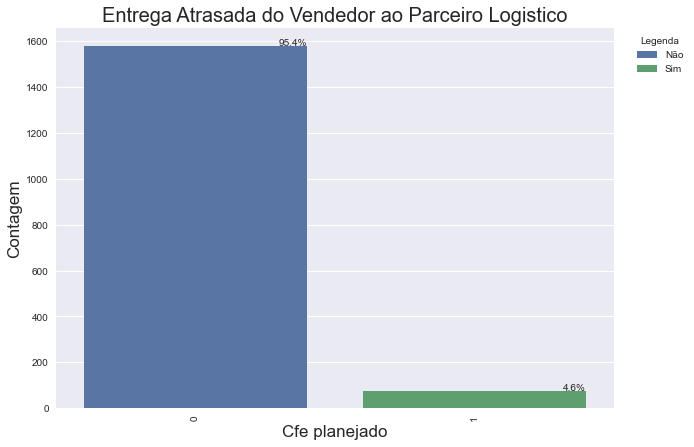

In [24]:
#features categoricas/binarias
display(df_abt['postagem_limiteparceiro_atrasado_moda'].value_counts())
countplot_com_perc('postagem_limiteparceiro_atrasado_moda',df_abt,'Entrega Atrasada do Vendedor ao Parceiro Logistico','Cfe planejado','Legenda',['Não','Sim'])

0    1609
1      49
Name: entrega_estimado_atrasado_moda, dtype: int64

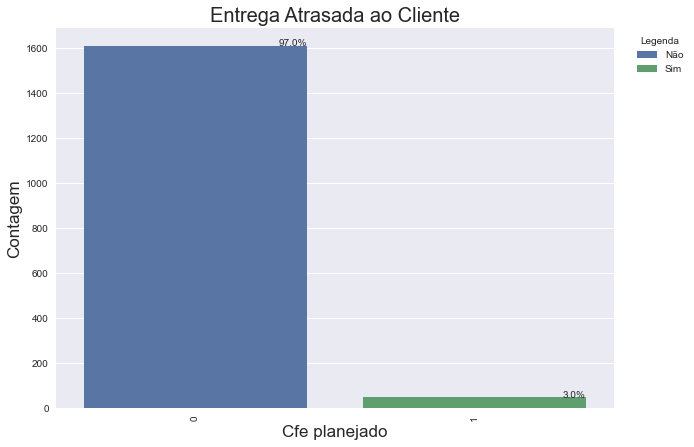

In [25]:
#features categoricas/binarias
display(df_abt['entrega_estimado_atrasado_moda'].value_counts())
countplot_com_perc('entrega_estimado_atrasado_moda',df_abt,'Entrega Atrasada ao Cliente','Cfe planejado','Legenda',['Não','Sim'])


## <a class="anchor" id="analise">1.3 Análises Features</a>

## <a class="anchor" id="univar">1.3.1 Univariadas</a>

## <a class="anchor" id="unicon">1.3.1.1 Continuas</a>

In [115]:
len(features_con)

28

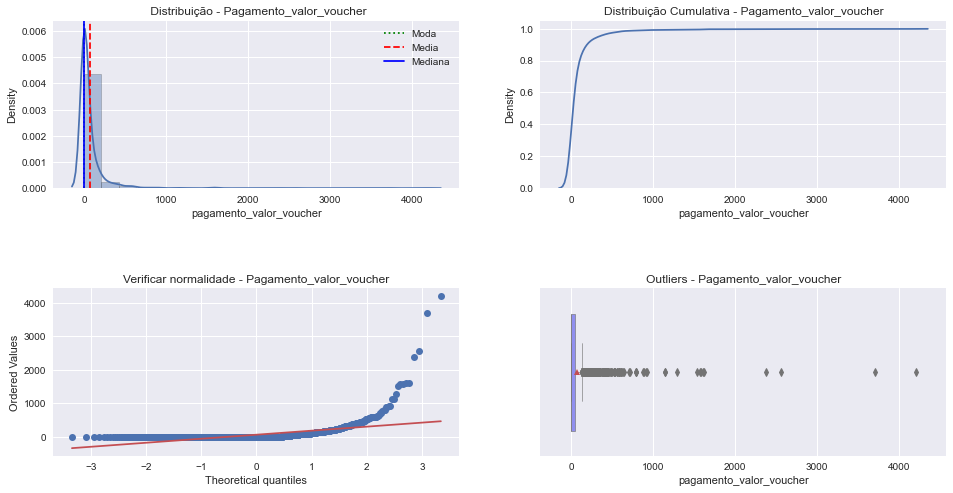

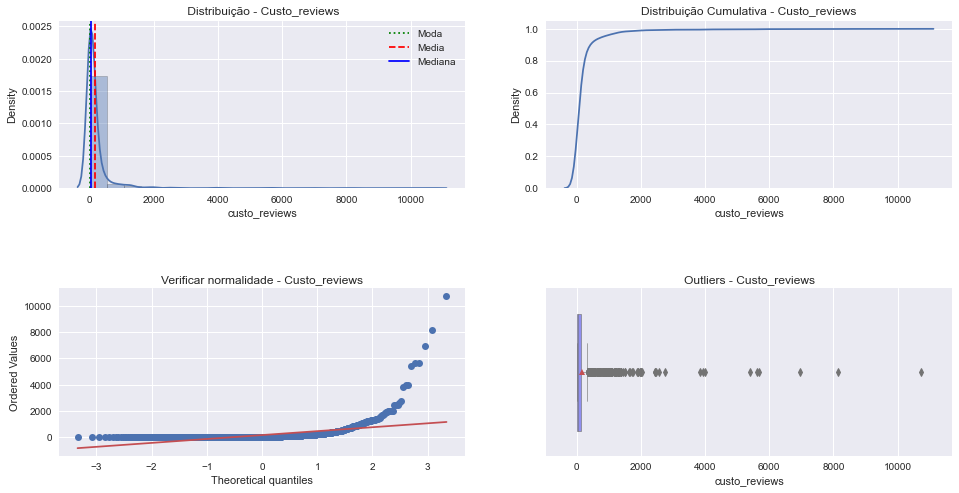

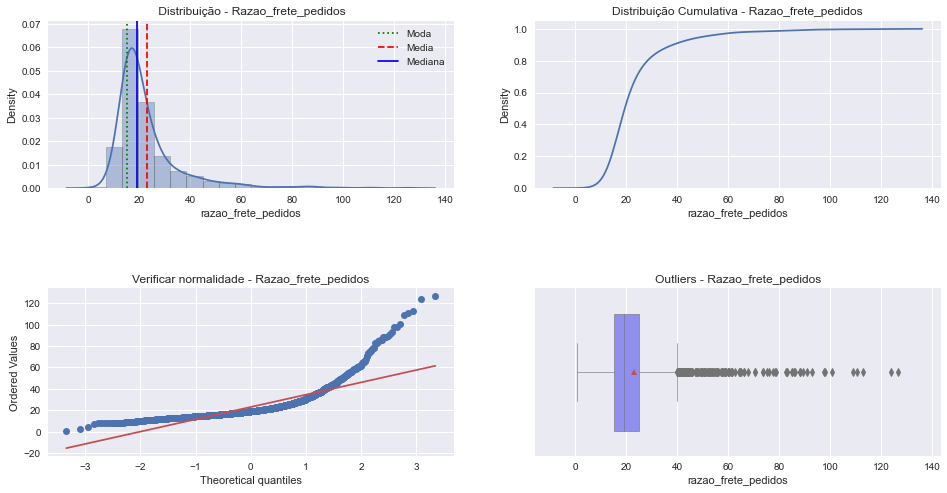

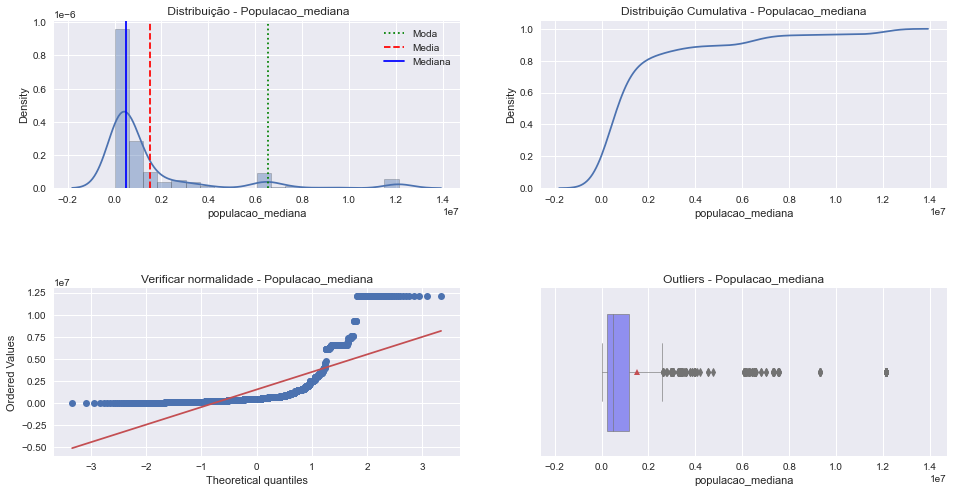

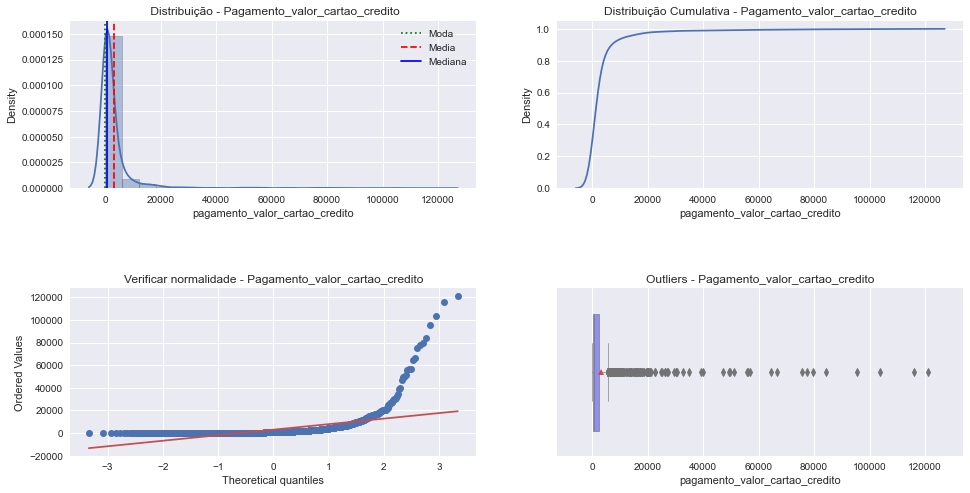

...

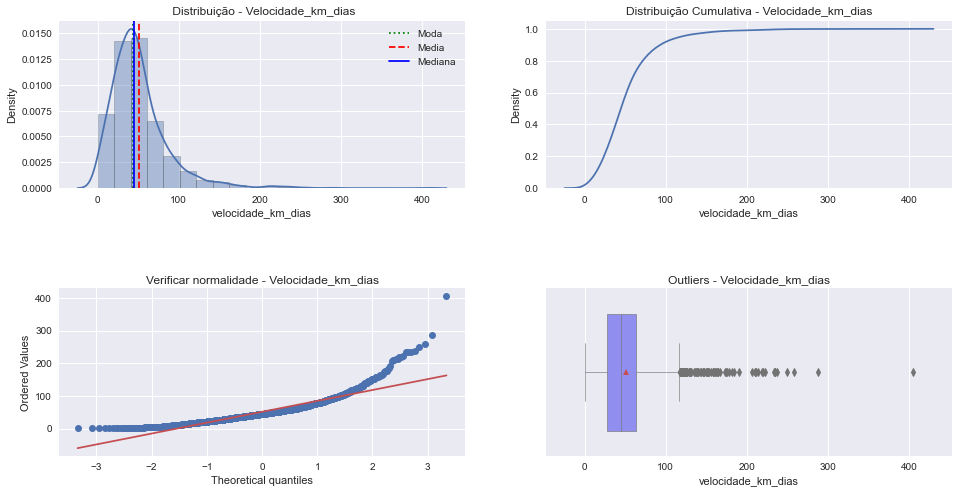

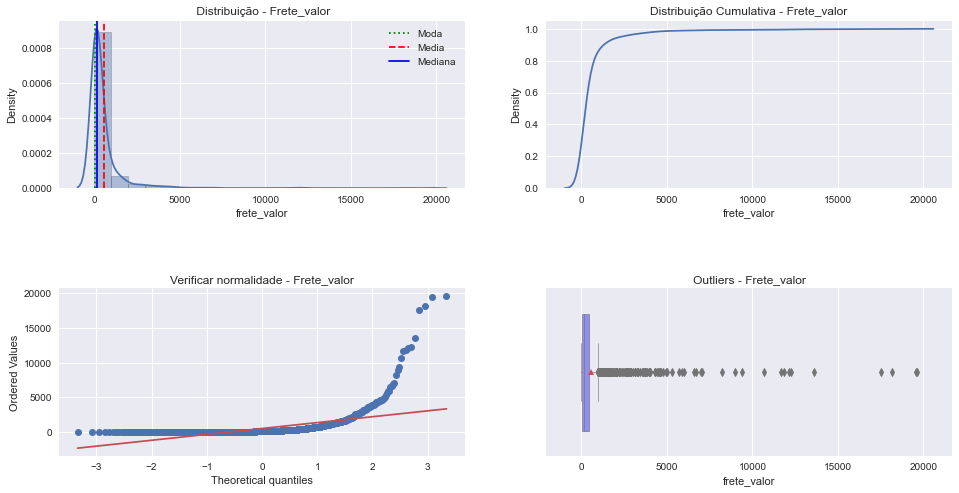

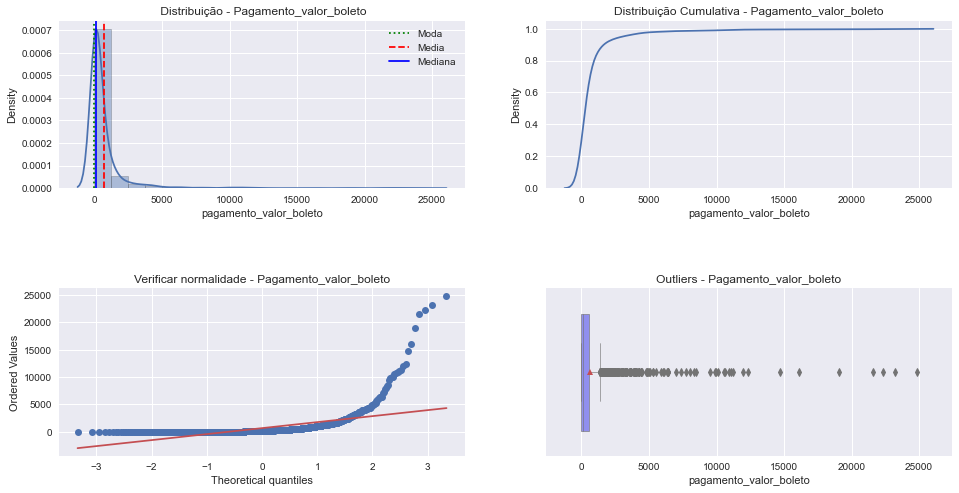

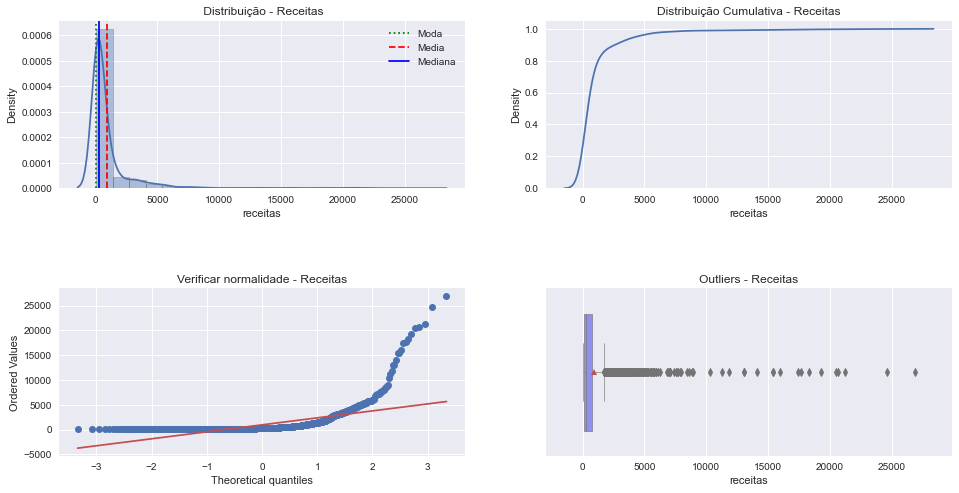

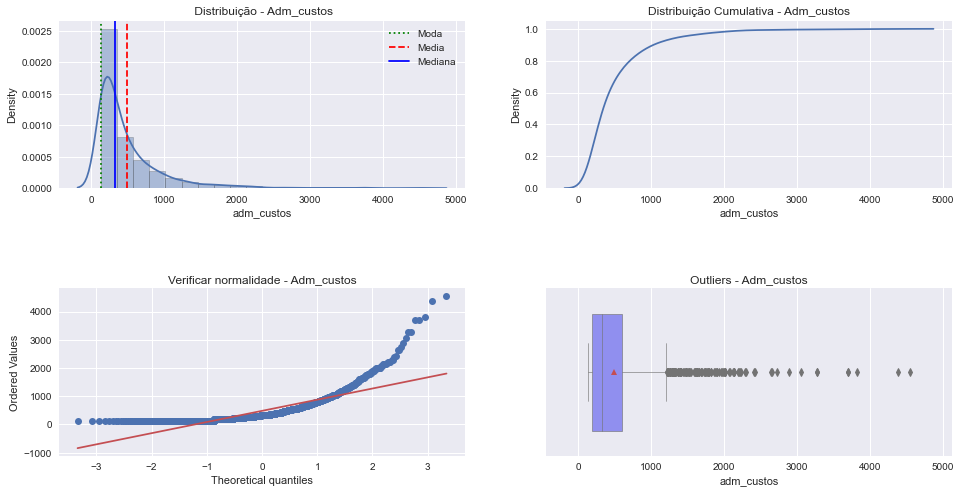

In [114]:
visual_4(df_abt, features_con)

In [ ]:
"""
Conclusões:


"""

## <a class="anchor" id="unidis">1.3.1.2 Discretas</a>

In [116]:
len(features_dis)

48

In [ ]:
visual_4(df_abt, features_dis)

## <a class="anchor" id="unicat">1.3.1.3 Categóricas</a>

In [117]:
len(features_cat)

7

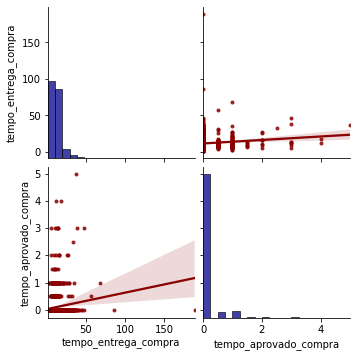

In [13]:
sns.pairplot(data=df_abt[['tempo_entrega_compra', 'tempo_aprovado_compra']], kind='reg', diag_kws={'bins':20, 'color':'darkblue','edgecolor':'black'},
            plot_kws={'marker':'.','color':'darkred'}, size=2.5)




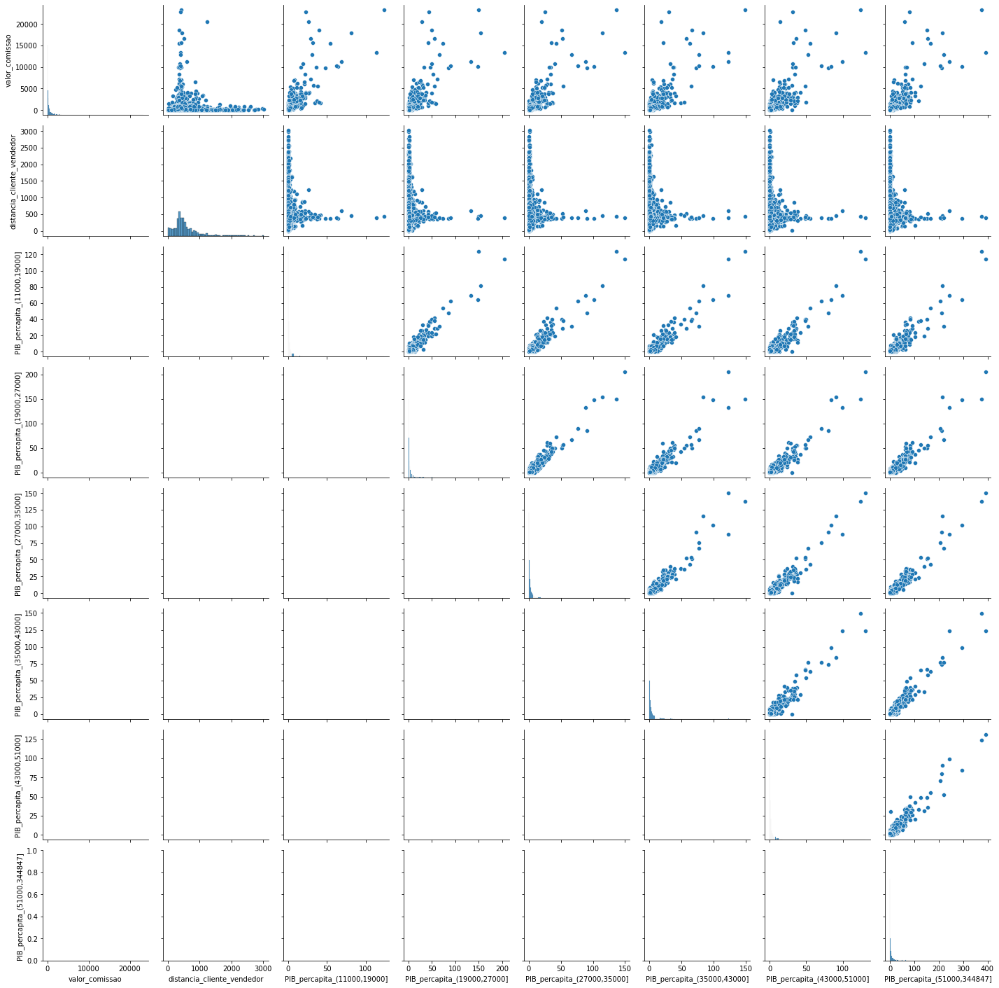

In [10]:
g = sns.PairGrid(df_abt[['valor_comissao', 'distancia_cliente_vendedor','PIB_percapita_(11000,19000]',
        'PIB_percapita_(19000,27000]',
        'PIB_percapita_(27000,35000]',
        'PIB_percapita_(35000,43000]',
        'PIB_percapita_(43000,51000]',
        'PIB_percapita_(51000,344847]']])
g.map_upper(sns.scatterplot)
g.map_diag(sns.histplot)

In [ ]:
x = sns.FacetGrid(tips, col="time",  row="smoker")
x = x.map(plt.scatter, "total_bill", "tip", edgecolor="w")

In [178]:
df_abt[features_con]

,valor_comissao,pagamento_valor_cartao_debito,pedidos_por_dia_media,preco,pagamento_valor_boleto,frete_valor,velocidade_km_dias,razao_frete_preco,receitas,adm_custos,vlr_medio_pedido,Area(km2)_mediana,densidade_produto_mediana,pagamento_valor_voucher,preco_frete,pagamento_valor_cartao_credito,razao_frete_pedidos,lucro,populacao_mediana,distancia_cliente_vendedor_mediana,produto_peso_g_mediana,habit_km2_mediana,produto_volume_cm3_mediana,custo_frete
0,563.85,0.0,0.142857,2685.00,0.00,63.06,76.43,0.02,582.84,230.68,916.02,1234.5370,0.190,0.00,2748.06,2748.06,21.02,280.63,92386.002,687.8890,11800.0,33.480,61920.0,31.53
1,3868.42,0.0,0.509202,20360.23,6434.32,6963.92,73.53,0.34,5807.31,1715.94,164.60,520.8070,0.460,213.94,27324.15,20761.86,41.95,-593.19,402027.039,735.3060,9000.0,1465.140,19656.0,3399.56
2,156.36,0.0,0.361905,781.80,611.49,593.53,27.20,0.76,573.33,820.99,36.19,539.7165,0.030,139.68,1375.33,677.63,15.62,-552.66,399307.051,353.5575,300.0,843.435,9600.0,0.00
3,25.20,0.0,1.000000,120.00,0.00,19.38,234.09,0.16,44.19,133.18,139.38,1200.1770,0.060,0.00,139.38,139.38,19.38,-98.68,6520265.915,936.3580,1200.0,5432.750,21000.0,9.69
4,3092.50,0.0,0.393939,16275.37,3290.24,2825.29,49.40,0.17,5091.39,1518.52,146.93,779.2000,0.130,445.03,19100.66,15468.99,21.73,1386.54,375141.967,543.4300,2146.0,1488.140,16320.0,1271.33
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1653,3.13,0.0,1.000000,14.90,0.00,16.11,43.59,1.08,27.12,133.18,31.01,478.5210,0.310,0.00,31.01,31.01,16.11,-121.06,139682.985,523.0960,500.0,291.910,1632.0,0.00
1654,173.49,0.0,0.026316,826.10,200.79,287.08,54.79,0.35,354.40,352.37,159.03,935.4290,0.170,0.00,1113.18,912.39,41.01,-132.25,1484941.084,547.8610,2350.0,2989.720,23040.0,124.28
1655,258.30,0.0,0.100000,1229.91,328.52,289.77,28.07,0.24,315.27,399.55,168.85,794.5710,0.130,0.00,1519.68,1191.16,32.20,-279.17,290769.012,449.1380,7600.0,738.590,60000.0,144.89
1656,564.08,0.0,0.103896,2686.10,416.54,508.61,35.47,0.19,674.03,532.73,199.67,1472.4920,0.180,0.00,3194.71,3145.39,31.79,-302.79,290306.501,425.6365,7500.0,327.040,37360.0,234.09


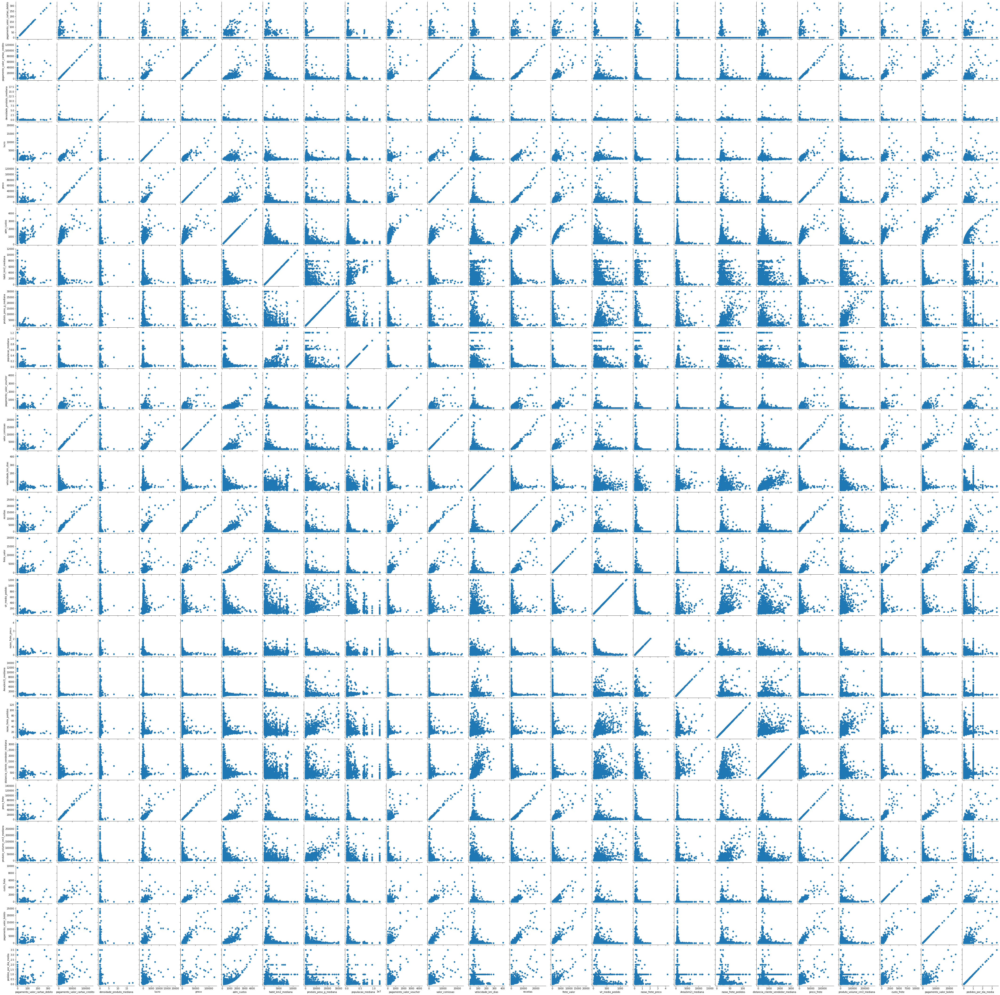

In [16]:
g = sns.PairGrid(df_abt[features_con])
g = g.map(plt.scatter)
plt.show()

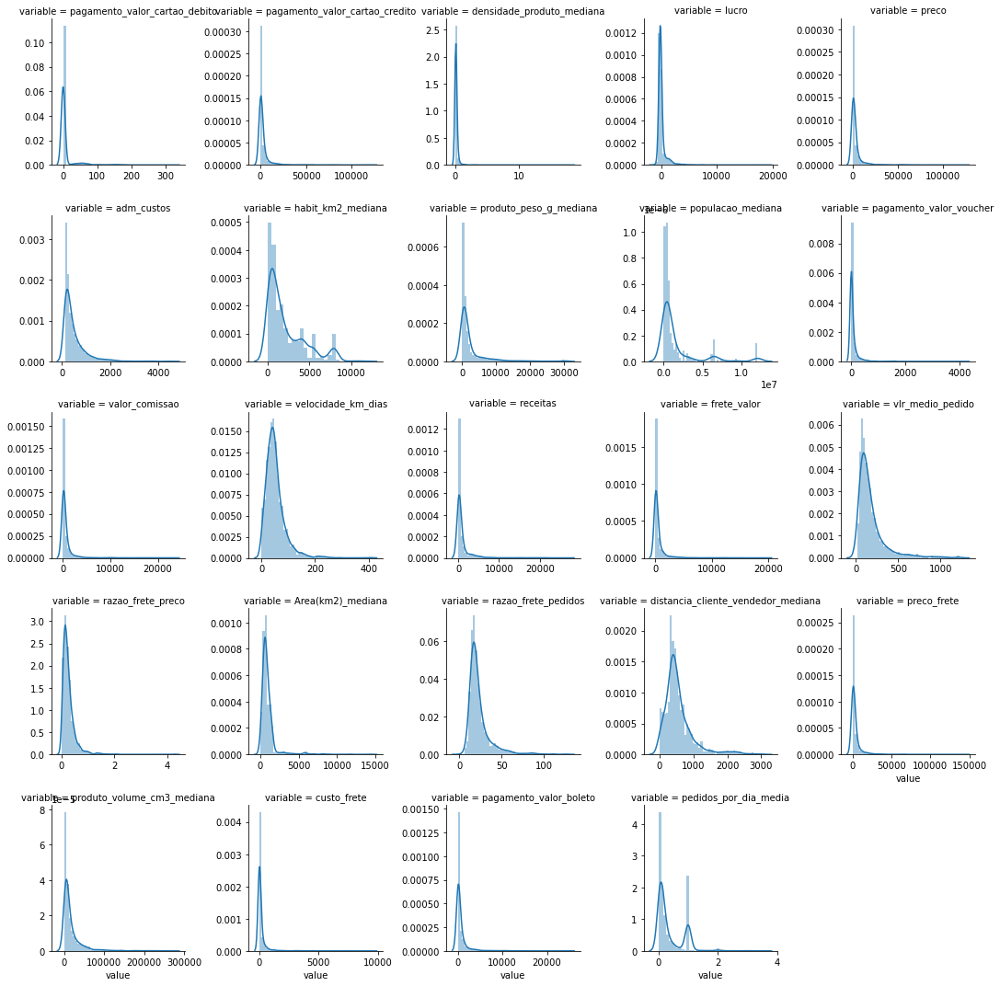

In [17]:
df = pd.DataFrame(data=df_abt, columns= features_con)
nd = pd.melt(df, value_vars =df )
n1 = sns.FacetGrid (nd, col='variable', col_wrap=5, sharex=False, sharey = False)
n1 = n1.map(sns.distplot, 'value')
n1

In [111]:
len(correlation(df_abt[features_numericas_relevantes], 0.90))

37

In [96]:
#Spearman correlation between independent variables, where CORR > 0.70
corr = df_abt[features_numericas_relevantes].corr(method="spearman")
#corr = data.corr(method="spearman").abs() 

In [97]:
corr

,review_score,plano_valor,plano_comissao,valor_taxa,valor_comissao,custo_frete,distancia_cliente_vendedor,qtd_clientes,qtd_clientes_repete,qtd_itens_pedido,preco,frete_valor,preco_frete,qtd_pedidos,qtd_produtos,produto_peso_g,produto_volume_cm3,densidade_produto,Area(km2),populacao,habit_km2,tempo_entrega_compra,tempo_aprovado_compra,tempo_estimado_compra,tempo_postagem_compra,tempo_entrega_aprovado_LeadTime,tempo_postagem_aprovado,tempo_entrega_postagem,postagem_limiteparceiro_variacao,postagem_limiteparceiro_dias_atraso,postagem_limiteparceiro_atrasado,entrega_estimado_variacao,entrega_estimado_dias_atraso,entrega_estimado_atrasado,qtd_pedidos_Nacional_Estadual_Comemorativa,qtd_clientes_capital,qtd_clientes_fora_estado,"PIB_percapita_(11000,19000]","PIB_percapita_(19000,27000]","PIB_percapita_(27000,35000]","PIB_percapita_(3285,11000]","PIB_percapita_(35000,43000]","PIB_percapita_(43000,51000]","PIB_percapita_(51000,344847]",pagamento_tipo_boleto,pagamento_tipo_cartao_credito,pagamento_tipo_cartao_debito,pagamento_tipo_voucher,pagamento_parcelas_boleto,pagamento_parcelas_cartao_credito,pagamento_parcelas_cartao_debito,pagamento_parcelas_voucher,pagamento_sequencia_boleto,pagamento_sequencia_cartao_credito,pagamento_sequencia_cartao_debito,pagamento_sequencia_voucher,pagamento_valor_boleto,pagamento_valor_cartao_credito,pagamento_valor_cartao_debito,pagamento_valor_voucher,custo_reviews,meses_olist,dias_olist,qtd_precos_quartile,preco_quartile,review_score_quartile,tempo_postagem_compra_quartile,vendedor_pontuacao,vendedor_score,receitas,adm_custos,lucro,velocidade_km_dias,frequencia,dias_entre_pedidos,vlr_medio_pedido,razao_frete_preco,razao_frete_pedidos
review_score,1.000000,0.262428,-0.262428,0.306014,0.361036,0.295082,-0.075829,0.436791,0.436889,-0.155159,0.361580,0.397166,0.369915,0.436889,0.435517,-0.035260,-0.032205,-0.038339,-0.026171,-0.044184,-0.014625,-0.223350,-0.198104,-0.094811,-0.174373,-0.217194,-0.173622,-0.126758,-0.119277,-0.241871,-0.217659,-0.116814,-0.348102,-0.285404,0.294645,0.401093,0.355957,0.313653,0.363378,0.348499,0.217030,0.347270,0.342629,0.417117,0.362658,0.433277,0.168817,0.273962,0.362658,0.386444,0.168817,0.268668,0.362658,0.433505,0.168817,0.268668,0.339262,0.356324,0.168887,0.273555,0.106983,0.381260,0.372976,0.456802,0.350665,0.987363,0.178855,0.506691,0.547012,0.393466,0.436889,0.143912,0.073251,-0.066190,0.073230,-0.037363,0.008952,-0.013247
plano_valor,0.262428,1.000000,-1.000000,0.519206,0.619320,0.542309,-0.049910,0.678086,0.678474,-0.108610,0.624966,0.666103,0.637902,0.678474,0.678514,-0.053391,-0.037698,-0.046563,-0.057264,-0.064722,-0.061894,-0.063985,-0.145804,-0.072888,-0.055615,-0.062381,-0.061953,-0.030825,-0.056216,-0.097733,-0.076620,0.005473,-0.097850,-0.082594,0.660713,0.675010,0.616329,0.677743,0.671607,0.677924,0.594292,0.672963,0.671295,0.671424,0.671373,0.675177,0.421550,0.650309,0.671373,0.658857,0.421550,0.637534,0.671373,0.675122,0.421550,0.637534,0.641547,0.628843,0.421770,0.641731,0.653680,0.531290,0.531799,0.642393,0.590369,0.266010,0.090121,0.641274,0.586784,0.663705,0.678474,0.469797,-0.000609,0.261079,-0.243227,-0.039022,0.027199,0.005748
plano_comissao,-0.262428,-1.000000,1.000000,-0.519206,-0.619320,-0.542309,0.049910,-0.678086,-0.678474,0.108610,-0.624966,-0.666103,-0.637902,-0.678474,-0.678514,0.053391,0.037698,0.046563,0.057264,0.064722,0.061894,0.063985,0.145804,0.072888,0.055615,0.062381,0.061953,0.030825,0.056216,0.097733,0.076620,-0.005473,0.097850,0.082594,-0.660713,-0.675010,-0.616329,-0.677743,-0.671607,-0.677924,-0.594292,-0.672963,-0.671295,-0.671424,-0.671373,-0.675177,-0.421550,-0.650309,-0.671373,-0.658857,-0.421550,-0.637534,-0.671373,-0.675122,-0.421550,-0.637534,-0.641547,-0.628843,-0.421770,-0.641731,-0.653680,-0.531290,-0.531799,-0.642393,-0.590369,-0.266010,-0.090121,-0.641274,-0.586784,-0.663705,-0.678474,-0.469797,0.000609,-0.261079,0.243227,0.039022,-0.027199,-0.005748
valor_taxa,0.306014,0.519206,-0.519206,1.000000,0.309432,0.134724

In [99]:
corr[(corr >= 0.7)]

,review_score,plano_valor,plano_comissao,valor_taxa,valor_comissao,custo_frete,distancia_cliente_vendedor,qtd_clientes,qtd_clientes_repete,qtd_itens_pedido,preco,frete_valor,preco_frete,qtd_pedidos,qtd_produtos,produto_peso_g,produto_volume_cm3,densidade_produto,Area(km2),populacao,habit_km2,tempo_entrega_compra,tempo_aprovado_compra,tempo_estimado_compra,tempo_postagem_compra,tempo_entrega_aprovado_LeadTime,tempo_postagem_aprovado,tempo_entrega_postagem,postagem_limiteparceiro_variacao,postagem_limiteparceiro_dias_atraso,postagem_limiteparceiro_atrasado,entrega_estimado_variacao,entrega_estimado_dias_atraso,entrega_estimado_atrasado,qtd_pedidos_Nacional_Estadual_Comemorativa,qtd_clientes_capital,qtd_clientes_fora_estado,"PIB_percapita_(11000,19000]","PIB_percapita_(19000,27000]","PIB_percapita_(27000,35000]","PIB_percapita_(3285,11000]","PIB_percapita_(35000,43000]","PIB_percapita_(43000,51000]","PIB_percapita_(51000,344847]",pagamento_tipo_boleto,pagamento_tipo_cartao_credito,pagamento_tipo_cartao_debito,pagamento_tipo_voucher,pagamento_parcelas_boleto,pagamento_parcelas_cartao_credito,pagamento_parcelas_cartao_debito,pagamento_parcelas_voucher,pagamento_sequencia_boleto,pagamento_sequencia_cartao_credito,pagamento_sequencia_cartao_debito,pagamento_sequencia_voucher,pagamento_valor_boleto,pagamento_valor_cartao_credito,pagamento_valor_cartao_debito,pagamento_valor_voucher,custo_reviews,meses_olist,dias_olist,qtd_precos_quartile,preco_quartile,review_score_quartile,tempo_postagem_compra_quartile,vendedor_pontuacao,vendedor_score,receitas,adm_custos,lucro,velocidade_km_dias,frequencia,dias_entre_pedidos,vlr_medio_pedido,razao_frete_preco,razao_frete_pedidos
review_score,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.987363,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
plano_valor,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
plano_comissao,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
valor_taxa,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
valor_comissao,NaN,NaN,NaN,NaN,1.000000,0.899541,NaN,0.859450,0.859563,NaN,0.999949,0.903467,0.997054,0.859563,0.856936,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.789585,NaN,NaN,0.735767,0.711733,NaN,NaN,NaN,0.773726,0.703508,0.863785,NaN,NaN,0.703508,0.908770,NaN,NaN,0.703508,0.864311,NaN,NaN,0.759201,0.971571,NaN,NaN,0.744040,0.735680,0.746377,0.828921,0.968114,NaN,NaN,0.904316,0.835716,0.969255,0.859563,NaN,NaN,NaN,NaN,NaN,NaN,NaN
custo_frete,NaN,NaN,NaN,NaN,0.899541,1.000000,NaN,0.722093,0.722111,NaN,0.898650,0.818685,0.892517,0.722111,0.718958,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.733158,NaN,NaN,NaN,0.806185,NaN,NaN,NaN,0.733678,NaN,NaN,NaN,0.874502,NaN,NaN,NaN,NaN,NaN,NaN,0.866466,NaN,NaN,0.780009,0.713742,0.836061,0.722111,NaN,NaN,NaN,NaN,NaN,NaN,NaN
distancia_cliente_vendedor,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Na

In [ ]:
plt.figure(figsize=(15, 9))

sns.heatmap(corr[(corr >= 0.7)], 
            cmap='inferno', vmax=1.0, vmin=-1.0, linewidths=0.1,
            annot=True, annot_kws={"size": 12}, square=True)
plt.title("CORR Spearman between independent variables CORR > 0.70", fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.show()


In [104]:
def exibe_individual_outlier(df, p_column):
    """
        Função que exibe um boxplot e as estatisticas descritivas de uma dada coluna de um dataframe

        p_df_dataframe -- O pandas dataframe
        p_column       -- Coluna do dataframe

    Return:
        None
    
    Exception:
        None
    """
    ## Dataframe com as estatisticas descritivas
    #df_summary = pd.DataFrame(p_df_dataframe[p_column].describe())
    df_summary =estatistica_quanti(df, p_column)
    
    ## Tamanho Figura
    plt.figure(figsize = (4, 6))
    
    ## Objeto referente ao boxplot
    ax = sns.boxplot(data = df[p_column])
    
    ## deixando os x_ticks com valor em branco
    ax.set(xticklabels = [])
    ax.set(ylabel = None)
    
    ## Titulo do boxplot com o nome da coluna
    ax.set(title = 'Parâmetro: ' + p_column)
    
    ## Tabela que será gerada junto com o gráfico, onde tera as estatisticas
    statistics_table = plt.table( cellText = df_summary.values,
                                    rowLabels = df_summary.index,
                                    colLabels =  ' ',
                                    cellLoc = 'left', 
                                    rowLoc = 'center',            
                                    loc ='bottom')
    
    ## Tamanho da fonte da tabela
    statistics_table.set_fontsize(12)
    
    ## Escala da tabela
    statistics_table.scale(1, 2)
    
    ## Colocar a tabela debaixo do boxplot
    plt.subplots_adjust(left = 0.2, bottom = .1)
    
    ## Exibir figura
    plt.show()

In [ ]:
#################################################################
# Esta função seleciona as variáveis 
# conforme o nível mínimo de variância estipulado por threshold
#################################################################
def elimina_baixa_variancia(X_data,threshold=0.1):
    """Esta função Seleciona, no dataset de treino,
       as variáveis conforme o nível mínimo de variância estipulado por threshold."""
    print("Num. variáveis inicial:{}".format(len(X_data.columns)))
    selector = VarianceThreshold(threshold)
    selector.fit(X_data)
    print("Num. variáveis final:{}".format(len(X_data.columns)))    
    return X_data[X_data.columns[selector.get_support(indices=True)]]


In [ ]:
enc = preprocessing.OrdinalEncoder()
enc.fit(empresas_df[['uf']])
# Criação da variável numérica:
empresas_df['uf_enc'] = enc.transform(empresas_df[['uf']]).astype(int)
empresas_df

In [ ]:
enc = preprocessing.OrdinalEncoder()
enc.fit(empresas_df[['municipio']])
# Criação da variável numérica para representar os municípios:
empresas_df['municipio_enc'] = enc.transform(empresas_df[['municipio']])
                                        .astype(int)
empresas_df

In [ ]:
# Identifying outliers 
df.plot(subplots = True, layout = (5,5), kind = 'box', figsize = (12,14), patch_artist = True, boxprops = dict(facecolor = 'cornflowerblue'),
            capprops = dict(color = 'black'),
            whiskerprops = dict(color = 'black'),
            flierprops = dict(markeredgecolor = 'black'),
            medianprops = dict(color= 'black'),
            )
plt.tick_params(left = False, bottom = False)
plt.subplots_adjust(wspace = 0.5);

In [ ]:
# Plot
df.hist(figsize = (12, 8), bins = 25, xlabelsize = 8, ylabelsize = 8, alpha = 0.6, color = 'b')

skewness < -1 ou > 1 altamente skewed

skewness entre -1 e -0.5 ou entre 0.5 e 1, moderadamente skewed
 
skewness entre -0.5 e 0.5, aproximadamente simetrica

In [ ]:
# Construindo o modelo do PCA
def pca_model(df, num_componentes):
  """
  Função que retorna a razão da variância, o somatório das componentes, os pesos
  dos componentes e o PCA. 
  :param df: Dataframe em que estão os dados de interesse.
  :param num_componentes: Número de componentes em que queremos construir o PCA.
  """
  pca = PCA(n_components=num_componentes)
  df = pca.fit_transform(df)
  variance_ratio = pca.explained_variance_ratio_
  weights = pca.components_
  sum_components = np.cumsum(variance_ratio)
  return variance_ratio, sum_components, weights, pca

In [ ]:
componentes_principais_p , soma_acumulativa_p, pesos_p, pca_p = pca_model(df_category_precos, 30)
# Verificando a variância
componentes_principais_p

In [ ]:
#use a normalização min-max se quiser normalizar os dados mantendo algumas diferenças nas 
#escalas (porque as unidades permanecem diferentes) e use a padronização se quiser tornar as escalas comparáveis 
#(através de desvios padrão).

In [ ]:
#CORRELAÇÃO NO CLUSTER
#O primeiro passo para reduzir esse número foi eliminar as variáveis que possuíam alta correlação 
#entre si — nosso ponto de corte foi coeficiente de correlação > 0,8 — , já que essas variáveis essencialmente 
#trazem a mesma informação para o modelo.


In [ ]:
#Gráfico Explained Variance Ratio x Principal Components
plt.figure(figsize=(15,6))
plt.plot(range(1, 31), soma_acumulativa_p, 
         label='cumulative explained variance')
plt.bar(range(1, 31), componentes_principais_p, alpha=0.5, align='center', 
        label='individual explained variance')
plt.xlabel('Principal Components')
plt.ylabel('Explained Variance Ratio')
plt.legend(loc='best')
plt.show()

In [15]:
# calculating mean customer spent and standard deviation
seller_mean = df_abt['price_sum'].mean()
seller_std = stats.sem(df_abt['price_sum'])
# estimating population average from sample
stats.t.interval(0.95, loc=seller_mean, scale= seller_std, df= len(df_abt) - 1)

(2693.9378363639316, 3571.9384603791414)

In [21]:
# estimate mean and confidence interval for sellers in each region
seller_regions = df_abt.groupby('seller_state_first').agg({'price_sum':[np.mean, np.std], 'seller_id_':'count'})
seller_regions.reset_index(inplace=True)
#seller_regions.columns = seller_regions.columns.map('_'.join).str.strip('_')
seller_regions

cis = stats.t.interval(.95, loc=seller_regions['price_sum']['mean'], 
                    scale=seller_regions['price_sum']['std']/np.sqrt(seller_regions['seller_id_']['count']), 
                    df= seller_regions['seller_id_']['count'] -1)

seller_regions['ci_low'] = cis[0]
seller_regions['ci_hi'] = cis[1]



In [22]:
seller_regions

seller_state_first     price_sum               seller_id_        ci_low  \
                               mean           std      count                 
0                  AM   1177.000000           NaN          1           NaN   
1                  BA  14821.330000  35088.270549          9 -12149.902325   
2                  CE   1367.644000   1769.225806          5   -829.139988   
3                  DF   2271.129524   3518.099412         21    669.709871   
4                  ES   3823.101667   8107.153253          6  -4684.833898   
5                  GO   1362.206000   2227.641574         15    128.579215   
6                  MG   2862.568766   5003.950606        154   2065.951818   
7                  MS   1264.627500   1388.970241          4   -945.534105   
8                  MT   2598.380000   3243.134834          3  -5458.013546   
9                  PB   1972.830000   2429.052971          3  -4061.272090   
10                 PE   1279.145000   1206.942626          4   -641.370051   
11                 PR   2184.718439   4271.205350        205   1596.544547   
12                 RJ   3326.195056  11996.514819         89    799.101565   
13                 RN   2044.400000   1516.749577          3  -1723.414824   
14                 RO   2293.700000   1819.018052          2 -14049.528780   
15                 RS   2498.366102   4629.699962         59   1291.859721   
16                 SC   2378.905288   4487.902647        104   1506.120199   
17                 SE    532.800000    287.226775          2  -2047.830182   
18                 SP   3453.787348  10254.354268        969   2807.332972   

           ci_hi  
                  
0            NaN  
1   41792.562325  
2    3564.427988  
3    3872.549176  
4   12331.037231  
5    2595.832785  
6    3659.185715  
7    3474.789105  
8   10654.773546  
9    8006.932090  
10   3199.660051  
11   2772.892331  
12   5853.288547  
13   5812.214824  
14  18636.928780  
15   3704.872482  
16   3251.690378  
17   3113.430182  
18   4100.241724

In [ ]:
P value for both clusters is close to 0.

So here we can see that distribusion is not gausian for both cluster groups.

So we will use non-parametric Mann Whitneney U test to define difference in income level between clusters

stat, p = scipy.stats.mannwhitneyu(clusters_1_2_income_clean[clusters_1_2_income_clean['purch_behaviour_claster']=='1']['income'],
                       clusters_1_2_income_clean[clusters_1_2_income_clean['purch_behaviour_claster']=='2']['income'],
                       axis=0,
                       method='auto')
​
print('Statistics=%.3f, p=%.3f' % (stat, p))
Statistics=192600.000, p=0.000
P value is less than 0.05 so we reect H0 and can say that mean income across two cllusters statistically different


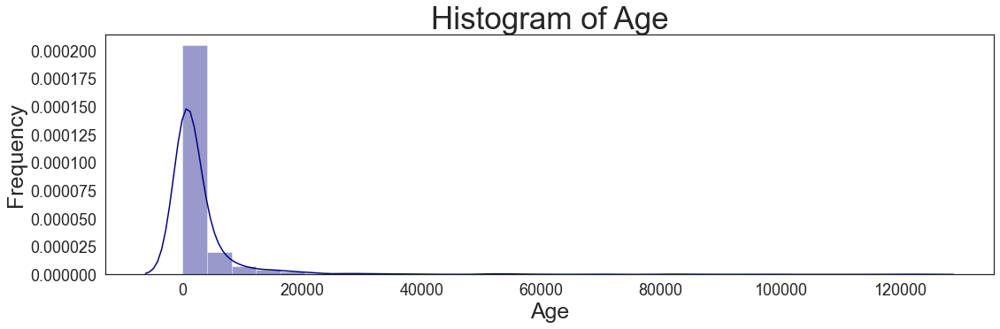

In [68]:
plt.figure(figsize=(18, 5))
sns.distplot(df_abt["price_sum"],
             bins=30, 
             color="navy",
             kde=True)
plt.title("Histogram of Age", fontsize=35)
plt.xlabel("Age", fontsize=25)
plt.ylabel("Frequency", fontsize=25)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)

plt.show()

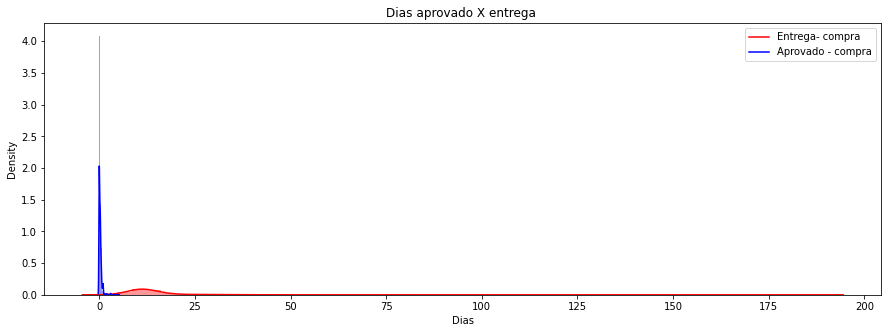

In [51]:
plt.figure(figsize=(15, 5))
sns.distplot(df_abt['tempo_entrega_compra_mean'], color='red', bins=100)
sns.distplot(df_abt['tempo_aprovado_compra_mean'], color='blue', bins=100)

plt.title(f'Dias aprovado X entrega ')
plt.xlabel('Dias')
plt.legend(['Entrega- compra', 'Aprovado - compra'])
plt.show();

In [ ]:
features_numericas = list(df_abt.select_dtypes(include=['int64','float64', 'uint8']).columns)
len(features_numericas)

In [ ]:
for i in features_numericas:
    boot_mean = df_abt.loc[df_abt['Feature'] == i, 'Bootstrap_Mean'].iloc[0]
    print(i)
    print('Bootstrap mean:', boot_mean)
    sns.histplot(df_abt[i])
    plt.axvline(boot_mean, color = 'red')
    plt.show()

In [43]:
sns.pairplot(df_abt[features_numericas_relevantes], kind='reg', markers='+')
plt.show()

KeyboardInterrupt: 

Error in callback <function flush_figures at 0x0000008EE55C7AF0> (for post_execute):


KeyboardInterrupt: 

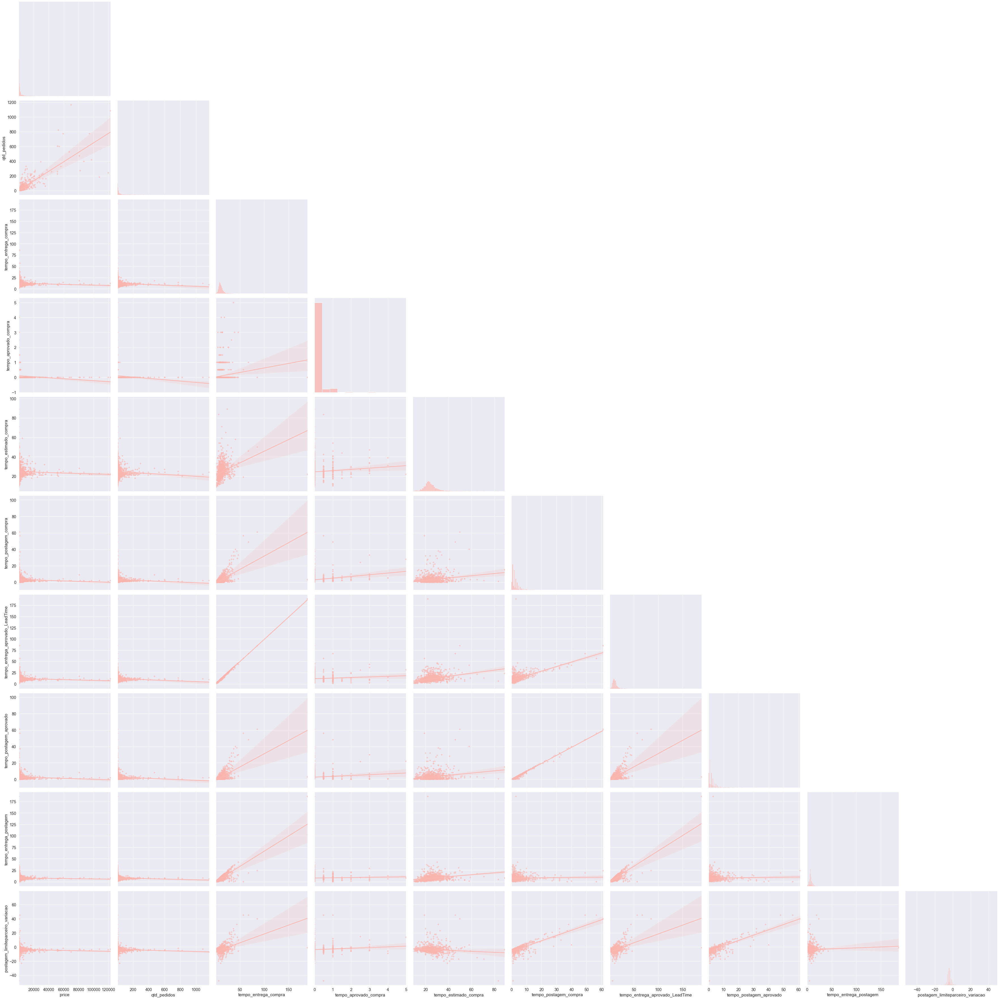

In [59]:
sns.pairplot(df_abt[['price', 'qtd_pedidos','tempo_entrega_compra',
            'tempo_aprovado_compra','tempo_estimado_compra',
            'tempo_postagem_compra','tempo_entrega_aprovado_LeadTime','tempo_postagem_aprovado',
            'tempo_entrega_postagem', 'postagem_limiteparceiro_variacao'        ]], kind='reg', markers='+',corner=True,height=5,diag_kind='hist')
plt.show()

In [ ]:
sns.pairplot(data[num_cols], diag_kind='kde', markers='+')
plt.show()

In [ ]:
# Plotando Scatter plots com regressão 
sns.pairplot(iris, kind="reg")

In [ ]:
#Use a correlação de spearman, pois os recursos não são normalmente distribuídos. A correlação de spearman usa ranks para 
#medir a associação entre variáveis e não requer que os dados sejam normalmente distribuídos.

In [ ]:
#Quantidade de municípios por categoria de pib per capta
#sns.set_theme(style="darkgrid")
#sns.displot(data = dftest, x="catpibpercapta", hue="regiao", common_norm=False,multiple='dodge',shrink=0.8)
#plt.title('Quantidade de municípios por categoria de PIB per Capta\n(Há repetição de municípios para cada ano)')

In [ ]:
#Para examinar quais combinações de recursos podem gerar mais agrupamentos de qualidade, um método é realizar 
#agrupamentos com diferentes subconjuntos de recursos. O objetivo disso é maximizar o Silhoette Score e gerar 
#clusters de alta qualidade e interpretáveis. Estarei usando o mesmo Elbow Method e Silhoette Score para avaliar a 
#qualidade dos clusters formados.

In [ ]:
#https://biblioteca.ibge.gov.br/visualizacao/livros/liv101688_informativo.pdf
#PIB POR FAIXA EM 2017

In [ ]:
#Spearman correlation between independent variables, where CORR > 0.70
corr = data.corr(method="spearman").abs() 
plt.figure(figsize=(15, 9))

sns.heatmap(corr[(corr >= 0.7)], 
            cmap='inferno', vmax=1.0, vmin=-1.0, linewidths=0.1,
            annot=True, annot_kws={"size": 12}, square=True)
plt.title("CORR Spearman between independent variables CORR > 0.70", fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.show()

#Highest corr with target - Spearman corr does not need normal distribution (in contrast to Pearson), so in this dataset
#Spearman is preferable CORR to use
corr_treshold = 0.70
high_corr = corr_merge[corr_merge["wine_type_corr_spearman"] > corr_treshold][["wine_type_corr_spearman"]].index.tolist()
corr_to_drop = [column for column in high_corr if column != "wine_type"]
corr_to_drop

#Drop column with too high correlation with target
data.drop(columns=corr_to_drop, inplace=True)

#Column selected by IV
CORR_selected_features = [column for column in data if column != "wine_type"]
all_columns = data_before_drop
do_not_selected_CORR = [x for x in all_columns if x not in CORR_selected_features]

print("Features selected by CORR:", CORR_selected_features)
print("Number of selected features:", len(CORR_selected_features))
print()
print("Features do not selected:", do_not_selected_CORR)
print("Number of do not selected feature:", len(do_not_selected_CORR))


In [ ]:
VIF - factor that assesses the degree of collinearity between explanatory variables in statistical models

If the VIF is between 5–10, multicollinearity is likely present and it should be consider to drop the variable.
If VIF>10 there is a strong collinearity of explanatory variables, it should be removed from the dataset.

#Data Frame with column to VIF calculation
cols_to_VIF = data.loc[:, data.columns != "wine_type"]

#Option 1 - VIF calculation by created function
#Function to calculate VIF indicator for selected seatures
def calculation_VIF(X):
    """
    Building DataFrame with fetures selected to model (parameter X)
    and calculating of VIF indicator for them.
    """
    vif = pd.DataFrame()
    vif["DF_features"] = cols_to_VIF.columns
    vif["VIF"] = [variance_inflation_factor(cols_to_VIF.values, i) for i in range(cols_to_VIF.shape[1])]
    vif["VIF"] = round(vif['VIF'], 2)
    vif = vif.sort_values(by = "VIF", ascending = False).set_index("DF_features")
    return(vif)

#Activation of function to calculate VIF for selected features
calculation_VIF(cols_to_VIF)

#Option 2 - VIF calculation by function from statsmodels library
# VIF dataframe 
vif_data = pd.DataFrame() 
vif_data["DF_features"] = cols_to_VIF.columns 
#Adding column with VIF
vif_data["VIF"] = [variance_inflation_factor(cols_to_VIF.values, i) 
                          for i in range(len(cols_to_VIF.columns))] 

vif_data = vif_data.sort_values(by="VIF", ascending=False).set_index("DF_features")
vif_data

#Drop variables with too high VIF factor
data.drop(columns=vif_data[vif_data["VIF"]>10].index.tolist(), inplace=True)

#Column selected by IV
VIF_selected_features = vif_data[vif_data["VIF"] < 10].index.tolist()
do_not_selected_IV = vif_data[vif_data["VIF"] > 10].index.tolist()

print("Features selected by IV:", VIF_selected_features)
print("Number of selected features:", len(VIF_selected_features))
print()
print("Features do not selected:", do_not_selected_IV)
print("Number of do not selected feature:", len(do_not_selected_IV))

In [ ]:
A transformação de assimetria(skewness) é um meio conveniente de transformar uma variável altamente assimétrica em um 
conjunto de dados mais normalizado. A normalidade é uma suposição importante para muitas técnicas estatísticas;
se seus dados não forem normais, o tratamento de assimetria é recomendado. Ao modelar variáveis com relações 
não lineares, as chances de produzir erros também podem ser distorcidas negativamente. Em teoria, queremos produzir
o menor erro possível ao fazer uma previsão, levando também em conta que não devemos estar superajustando o modelo. 
O overfitting ocorre quando há muitas variáveis dependentes em jogo e não há generalização suficiente do conjunto
de dados para fazer uma previsão válida. O uso do logaritmo de uma ou mais variáveis melhora o ajuste do modelo,
transformando a distribuição dos recursos em uma curva de sino com formato mais normal.

In [ ]:
df['Monthly Premium Auto_boxcox'] = stats.boxcox(df['Monthly Premium Auto'])[0]
print('Before Box-Cox transformation ', data['Monthly Premium Auto'].skew())
print('After Box-Cox transformation ', pd.Series(df['Monthly Premium Auto_boxcox'].skew()))

In [ ]:
figure, axes = plt.subplots(1,3)
sns.distplot(data['Customer Lifetime Value'], ax = axes[0])
sns.distplot(df['Customer Lifetime Value_boxcox'], ax = axes[1])
sns.distplot(df['Customer Lifetime Value_log'], ax = axes[2])
plt.show()



In [ ]:
# Estatísticamente
colunas = ['Número Hóspedes', 'Número Quartos', 'Número Camas', 'Número Banheiros', 'Avaliação', 'Número Comentários']
correlation_features = []
for col in colunas:
    cor, p = stats.spearmanr(df_train[col],df_train[Target])
    if p <= 0.5:
        correlation_features.append(col)
        print(f'p-value: {p},  correlation: {cor}')
        print(f'Existe correlação entre {col} e {Target}.')
        print('--'*30)
    else:
        print(f'p-value: {p},  correlation: {cor}')
        print(f'Não há correlação entre {col} e {Target}.')
        print('--'*30)
#No entanto, como o valor de p da correlação não é inferior a 0,05, a correlação não é estatisticamente significativa.        

In [18]:
from scipy.stats import norm
a = norm.rvs(size=50)


<AxesSubplot:ylabel='Density'>

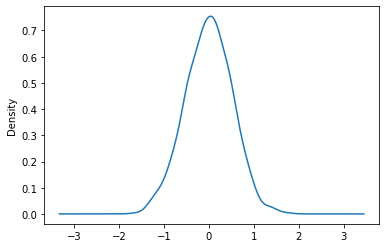

In [19]:
s = pd.Series(tuple(norm.rvs(0, 0.5, size=1000)))
s.plot(kind='kde')

In [23]:
s.skew()

-0.032915394703980534

In [25]:
normaltest_teste,normaltest_valor_p = normaltest(s)
normaltest_valor_p

0.9124950028943449

In [32]:
normal_ks_teste, normal_ks_valor_p = kstest(s,'norm')
normal_ks_valor_p

4.769384550073318e-24

ShapiroResult(statistic=0.9989156126976013, pvalue=0.8265998363494873)


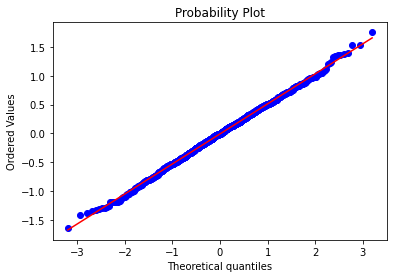

In [33]:
stats.probplot(s, plot=plt)
print(stats.shapiro(s))

In [48]:
len(features_numericas_relevantes)

78

In [64]:
features_numericas_relevantes_parte1=['PIB_percapita_(11000,19000]', 'PIB_percapita_(19000,27000]', 'PIB_percapita_(27000,35000]', 'PIB_percapita_(3285,11000]',
            'PIB_percapita_(35000,43000]', 'PIB_percapita_(43000,51000]', 'PIB_percapita_(51000,344847]']
features_numericas_relevantes_parte2=['pagamento_tipo_boleto', 'pagamento_tipo_cartao_credito', 'pagamento_tipo_cartao_debito', 'pagamento_tipo_voucher',
            'pagamento_parcelas_boleto', 'pagamento_parcelas_cartao_credito', 'pagamento_parcelas_cartao_debito', 'pagamento_parcelas_voucher',
            'pagamento_sequencia_boleto', 'pagamento_sequencia_cartao_credito', 'pagamento_sequencia_cartao_debito', 'pagamento_sequencia_voucher',
            'pagamento_valor_boleto', 'pagamento_valor_cartao_credito', 'pagamento_valor_cartao_debito', 'pagamento_valor_voucher']
features_numericas_relevantes_parte3=[ 'tempo_entrega_compra', 'tempo_aprovado_compra',
            'tempo_estimado_compra', 'tempo_postagem_compra', 'tempo_entrega_aprovado_LeadTime', 'tempo_postagem_aprovado',
            'tempo_entrega_postagem', 'postagem_limiteparceiro_variacao', 'postagem_limiteparceiro_dias_atraso',
            'postagem_limiteparceiro_atrasado', 'entrega_estimado_variacao', 'entrega_estimado_dias_atraso',
            'entrega_estimado_atrasado']
features_numericas_relevantes_parte4=['review_score', 'plano_valor', 'plano_comissao', 'valor_taxa', 'valor_comissao', 'custo_frete',
            'distancia_cliente_vendedor', 'qtd_clientes', 'qtd_clientes_repete', 'qtd_itens_pedido', 'preco',
            'frete_valor', 'preco_frete', 'qtd_pedidos', 'qtd_produtos', 'produto_peso_g', 'produto_volume_cm3',
            'densidade_produto',  'Area(km2)', 'populacao',  'habit_km2']  


In [59]:
features_numericas_relevantes_parte5=['qtd_pedidos_Nacional_Estadual_Comemorativa', 'qtd_clientes_capital', 'qtd_clientes_fora_estado',
            'custo_reviews', 'meses_olist', 'dias_olist', 'qtd_precos_quartile', 'preco_quartile', 'review_score_quartile',
            'tempo_postagem_compra_quartile', 'vendedor_pontuacao', 'vendedor_score', 'receitas', 'adm_custos', 'lucro',
            'velocidade_km_dias', 'frequencia', 'dias_entre_pedidos', 'vlr_medio_pedido', 'razao_frete_preco', 'razao_frete_pedidos']   


In [66]:
len(features_numericas_relevantes_parte5)

21

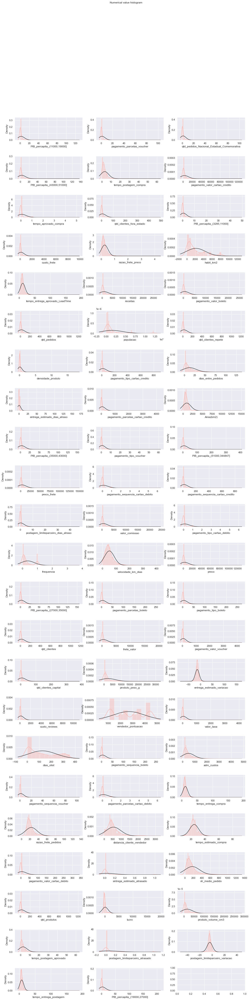

In [149]:
sns.set_style("darkgrid")
#num_value_col = df_normal.select_dtypes(include=['int64','float64']).columns.tolist()
fig, axes = plt.subplots(23, 3, figsize=(18, 70))
fig.subplots_adjust(hspace=0.7)
fig.suptitle('Numerical value histogram')

i=0
n=0

for x in features_:
    sns.distplot(df_abt[x],fit=stats.norm,ax=axes[i,n])

    if n < 2:
        n+=1
    else:
        n=0
        i+=1
plt.show()

In [ ]:
#Nos conjuntos de dados, encontramos alguns dos recursos que são altamente correlacionados, o que significa que são alguns 
#linearmente dependentes de outros recursos. Esses recursos contribuem muito menos na previsão da saída, mas aumentam o 
#custo computacional.

In [84]:
len(features_numericas_relevantes)

78

In [85]:
upper_tri

,review_score,plano_valor,plano_comissao,valor_taxa,valor_comissao,custo_frete,distancia_cliente_vendedor,qtd_clientes,qtd_clientes_repete,qtd_itens_pedido,preco,frete_valor,preco_frete,qtd_pedidos,qtd_produtos,produto_peso_g,produto_volume_cm3,densidade_produto,Area(km2),populacao,habit_km2,tempo_entrega_compra,tempo_aprovado_compra,tempo_estimado_compra,tempo_postagem_compra,tempo_entrega_aprovado_LeadTime,tempo_postagem_aprovado,tempo_entrega_postagem,postagem_limiteparceiro_variacao,postagem_limiteparceiro_dias_atraso,postagem_limiteparceiro_atrasado,entrega_estimado_variacao,entrega_estimado_dias_atraso,entrega_estimado_atrasado,qtd_pedidos_Nacional_Estadual_Comemorativa,qtd_clientes_capital,qtd_clientes_fora_estado,"PIB_percapita_(11000,19000]","PIB_percapita_(19000,27000]","PIB_percapita_(27000,35000]","PIB_percapita_(3285,11000]","PIB_percapita_(35000,43000]","PIB_percapita_(43000,51000]","PIB_percapita_(51000,344847]",pagamento_tipo_boleto,pagamento_tipo_cartao_credito,pagamento_tipo_cartao_debito,pagamento_tipo_voucher,pagamento_parcelas_boleto,pagamento_parcelas_cartao_credito,pagamento_parcelas_cartao_debito,pagamento_parcelas_voucher,pagamento_sequencia_boleto,pagamento_sequencia_cartao_credito,pagamento_sequencia_cartao_debito,pagamento_sequencia_voucher,pagamento_valor_boleto,pagamento_valor_cartao_credito,pagamento_valor_cartao_debito,pagamento_valor_voucher,custo_reviews,meses_olist,dias_olist,qtd_precos_quartile,preco_quartile,review_score_quartile,tempo_postagem_compra_quartile,vendedor_pontuacao,vendedor_score,receitas,adm_custos,lucro,velocidade_km_dias,frequencia,dias_entre_pedidos,vlr_medio_pedido,razao_frete_preco,razao_frete_pedidos
review_score,NaN,0.197794,0.209691,0.125195,0.140257,0.124243,0.102484,0.151113,0.150633,0.060165,0.137694,0.149972,0.141993,0.150633,0.149463,0.068137,0.047944,0.005655,0.065779,0.108939,0.059651,0.355859,0.160691,0.107166,0.301323,0.353148,0.299710,0.234554,0.244618,0.281687,0.244765,0.234648,0.223248,0.358615,0.131558,0.156787,0.132041,0.136146,0.141218,0.144732,0.120206,0.149786,0.150066,0.155090,0.146045,0.150329,0.115792,0.134871,0.146045,0.139851,0.115792,0.122638,0.146045,0.150382,0.115792,0.122638,0.148841,0.136529,0.115571,0.129687,0.104366,0.312782,0.315525,0.384386,0.303028,0.825376,0.201902,0.385495,0.487342,0.172363,0.268613,0.122970,0.056464,0.128307,0.020179,0.082371,0.034847,0.107440
plano_valor,NaN,NaN,0.988227,0.562524,0.583693,0.539022,0.095597,0.667546,0.665706,0.056110,0.586832,0.658666,0.607887,0.665706,0.662274,0.074854,0.067031,0.025289,0.098105,0.162105,0.164769,0.084169,0.104009,0.063509,0.083456,0.084207,0.089434,0.060970,0.052021,0.060817,0.073674,0.009803,0.037745,0.072941,0.585238,0.683339,0.596585,0.626909,0.631532,0.633264,0.558601,0.665315,0.668274,0.670977,0.646313,0.665249,0.435779,0.584983,0.646313,0.621309,0.435779,0.532307,0.646313,0.665292,0.435779,0.532307,0.632603,0.588925,0.426855,0.554616,0.603318,0.533290,0.530242,0.572369,0.536850,0.240310,0.089285,0.578040,0.521799,0.734449,0.846921,0.570715,0.056781,0.161576,0.239266,0.093732,0.033346,0.078017
plano_comissao,NaN,NaN,NaN,0.546707,0.572570,0.527766,0.099345,0.650156,0.648304,0.060116,0.574638,0.643492,0.595047,0.648304,0.644791,0.078040,0.069533,0.023731,0.103974,0.172304,0.172101,0.089665,0.110750,0.067256,0.087678,0.089695,0.093738,0.065803,0.053044,0.064264,0.076238,0.010582,0.040440,0.078149,0.567264,0.667064,0.577762,0.609941,0.614651,0.616794,0.544545,0.647521,0.650955,0.653796,0.629792,0.647680,0.428924,0.571355,0.629792,0.605194,0.428924,0.519178,0.629792,0.647735,0.428924,0.519178,0.618993,0.576607,0.422269,0.541558,0.586364,0.557404,0.555060,0.613235,0.568220,0.255049,0.093224,0.618676,0.554938,0.721155,0.848975,0.556404,0.057739,0.138996,0.248591,0.096314,0.037221,0.078757
valor_taxa,NaN,NaN,NaN,NaN,0.447127,0.366267,0.078438,0.838731,0.841001,0.035894,0.449944,0.726608,0.497085,0.841001,0.843636,0.091755,0.082087,0.019174,0.064504,0.099709,0.096962,0.063651,0.067607,

In [57]:
df_abt.drop(columns=to_drop, inplace=True)

In [58]:
df_abt.columns

Index(['vendedor_id', 'vendedor_cidade', 'vendedor_estado',
       'vendedor_cidade_id', 'vendedor_estado_id', 'vendedor_grande_regiao_id',
       'vendedor_grande_regiao_nome', 'review_score', 'plano', 'plano_valor',
       'valor_taxa', 'valor_comissao', 'distancia_cliente_vendedor',
       'qtd_itens_pedido', 'produto_peso_g', 'produto_volume_cm3',
       'densidade_produto', 'produto_categoria_nome', 'produto_categoria_id',
       'Area(km2)', 'populacao', 'tempo_entrega_compra',
       'tempo_aprovado_compra', 'tempo_estimado_compra',
       'tempo_postagem_compra', 'tempo_entrega_postagem',
       'postagem_limiteparceiro_variacao',
       'postagem_limiteparceiro_dias_atraso', 'entrega_estimado_variacao',
       'entrega_estimado_dias_atraso',
       'qtd_pedidos_Nacional_Estadual_Comemorativa',
       'qtd_clientes_fora_estado', 'PIB_percapita_(11000,19000]',
       'PIB_percapita_(27000,35000]', 'PIB_percapita_(3285,11000]',
       'pagamento_tipo_cartao_debito', 'pagamento_ti

In [59]:
features_enxutas=[ 'review_score', 'plano', 'plano_valor',
       'valor_taxa', 'valor_comissao', 'distancia_cliente_vendedor',
       'qtd_itens_pedido', 'produto_peso_g', 'produto_volume_cm3',
       'densidade_produto', 
       'Area(km2)', 'populacao', 'tempo_entrega_compra',
       'tempo_aprovado_compra', 'tempo_estimado_compra',
       'tempo_postagem_compra', 'tempo_entrega_postagem',
       'postagem_limiteparceiro_variacao',
       'postagem_limiteparceiro_dias_atraso', 'entrega_estimado_variacao',
       'entrega_estimado_dias_atraso',
       'qtd_pedidos_Nacional_Estadual_Comemorativa',
       'qtd_clientes_fora_estado', 'PIB_percapita_(11000,19000]',
       'PIB_percapita_(27000,35000]', 'PIB_percapita_(3285,11000]',
       'pagamento_tipo_cartao_debito', 'pagamento_tipo_voucher', 'lucro',
       'velocidade_km_dias', 'frequencia', 'vlr_medio_pedido',
       'razao_frete_pedidos']

In [60]:
len(features_enxutas)

33

In [66]:
cor_matrix = df_abt[features_numericas_relevantes].corr(method="spearman").abs()
upper_tri = cor_matrix.where(np.triu(np.ones(cor_matrix.shape),k=1).astype(np.bool))
to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.79)]
print(to_drop)

['plano_comissao', 'custo_frete', 'qtd_clientes', 'qtd_clientes_repete', 'preco', 'frete_valor', 'preco_frete', 'qtd_pedidos', 'qtd_produtos', 'habit_km2', 'tempo_entrega_aprovado_LeadTime', 'tempo_postagem_aprovado', 'postagem_limiteparceiro_atrasado', 'entrega_estimado_atrasado', 'qtd_clientes_capital', 'qtd_clientes_fora_estado', 'PIB_percapita_(19000,27000]', 'PIB_percapita_(27000,35000]', 'PIB_percapita_(35000,43000]', 'PIB_percapita_(43000,51000]', 'PIB_percapita_(51000,344847]', 'pagamento_tipo_boleto', 'pagamento_tipo_cartao_credito', 'pagamento_parcelas_boleto', 'pagamento_parcelas_cartao_credito', 'pagamento_parcelas_cartao_debito', 'pagamento_parcelas_voucher', 'pagamento_sequencia_boleto', 'pagamento_sequencia_cartao_credito', 'pagamento_sequencia_cartao_debito', 'pagamento_sequencia_voucher', 'pagamento_valor_boleto', 'pagamento_valor_cartao_credito', 'pagamento_valor_cartao_debito', 'pagamento_valor_voucher', 'custo_reviews', 'meses_olist', 'dias_olist', 'qtd_precos_quart

In [69]:
len(to_drop)

48

In [70]:
df_abt.drop(columns=to_drop, inplace=True)

In [71]:
df_abt.shape

(1658, 40)

In [72]:
cor_matrix = df_abt.corr(method="spearman").abs()
upper_tri = cor_matrix.where(np.triu(np.ones(cor_matrix.shape),k=1).astype(np.bool))
to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.8)]
print(to_drop)

['vendedor_estado_id', 'vendedor_grande_regiao_id']


In [73]:
df_abt.drop(columns=to_drop, inplace=True)

In [76]:
df_abt.drop(columns=['vendedor_id', 'vendedor_cidade', 'vendedor_estado',
       'vendedor_cidade_id', 'vendedor_grande_regiao_nome','produto_categoria_nome',
       'produto_categoria_id'], inplace=True)

In [77]:
df_abt.shape

(1658, 31)

In [78]:
df_abt.columns

Index(['review_score', 'plano', 'plano_valor', 'valor_taxa', 'valor_comissao',
       'distancia_cliente_vendedor', 'qtd_itens_pedido', 'produto_peso_g',
       'produto_volume_cm3', 'densidade_produto', 'Area(km2)', 'populacao',
       'tempo_entrega_compra', 'tempo_aprovado_compra',
       'tempo_estimado_compra', 'tempo_postagem_compra',
       'tempo_entrega_postagem', 'postagem_limiteparceiro_variacao',
       'postagem_limiteparceiro_dias_atraso', 'entrega_estimado_variacao',
       'entrega_estimado_dias_atraso',
       'qtd_pedidos_Nacional_Estadual_Comemorativa',
       'PIB_percapita_(11000,19000]', 'PIB_percapita_(3285,11000]',
       'pagamento_tipo_cartao_debito', 'pagamento_tipo_voucher', 'lucro',
       'velocidade_km_dias', 'frequencia', 'vlr_medio_pedido',
       'razao_frete_pedidos'],
      dtype='object')

In [84]:
features_enxutas=['review_score', 'plano', 'plano_valor', 'valor_taxa', 'valor_comissao',
       'distancia_cliente_vendedor', 'qtd_itens_pedido', 'produto_peso_g',
       'produto_volume_cm3', 'densidade_produto', 'Area(km2)', 'populacao',
       'tempo_entrega_compra', 'tempo_aprovado_compra',
       'tempo_estimado_compra', 'tempo_postagem_compra',
       'tempo_entrega_postagem', 'postagem_limiteparceiro_variacao',
       'postagem_limiteparceiro_dias_atraso', 'entrega_estimado_variacao',
       'entrega_estimado_dias_atraso',
       'qtd_pedidos_Nacional_Estadual_Comemorativa',
       'PIB_percapita_(11000,19000]', 'PIB_percapita_(3285,11000]',
       'pagamento_tipo_cartao_debito', 'pagamento_tipo_voucher', 'lucro',
       'velocidade_km_dias', 'frequencia', 'vlr_medio_pedido',
       'razao_frete_pedidos']

In [79]:
cor_matrix = df_abt.corr(method="spearman").abs()
upper_tri = cor_matrix.where(np.triu(np.ones(cor_matrix.shape),k=1).astype(np.bool))
to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.8)]
print(to_drop)

[]


In [107]:
features_numericas_after = list(df_abt_after.select_dtypes(include=['int64','float64', 'uint8']).columns)

In [108]:
len(features_numericas_after)

28

In [87]:
df_abt

,review_score,plano,plano_valor,valor_taxa,valor_comissao,distancia_cliente_vendedor,qtd_itens_pedido,produto_peso_g,produto_volume_cm3,densidade_produto,Area(km2),populacao,tempo_entrega_compra,tempo_aprovado_compra,tempo_estimado_compra,tempo_postagem_compra,tempo_entrega_postagem,postagem_limiteparceiro_variacao,postagem_limiteparceiro_dias_atraso,entrega_estimado_variacao,entrega_estimado_dias_atraso,qtd_pedidos_Nacional_Estadual_Comemorativa,"PIB_percapita_(11000,19000]","PIB_percapita_(3285,11000]",pagamento_tipo_cartao_debito,pagamento_tipo_voucher,lucro,velocidade_km_dias,frequencia,vlr_medio_pedido,razao_frete_pedidos
0,5,Lite,18.99,0,563.85,687.8890,1.0,11800.0,61920.0,0.190,1234.5370,92386.002,10.0,0.0,24.0,2.0,7.0,-5.0,0.0,-13.0,0.0,1,1,0,0,0,280.63,76.43,0.142857,916.02,21.02
1,5,Pro,173.99,25,3868.42,735.3060,1.0,9000.0,19656.0,0.460,520.8070,402027.039,10.0,0.0,25.0,2.0,8.0,-5.0,0.0,-14.0,0.0,10,15,4,0,2,-593.19,73.53,0.509202,164.60,41.95
2,5,Basic,68.99,210,156.36,353.5575,1.0,300.0,9600.0,0.030,539.7165,399307.051,13.5,0.0,22.0,4.0,9.0,-3.5,0.0,-9.0,0.0,4,4,1,0,5,-552.66,27.20,0.361905,36.19,15.62
3,5,Lite,18.99,0,25.20,936.3580,1.0,1200.0,21000.0,0.060,1200.1770,6520265.915,4.0,0.0,30.0,0.0,4.0,-6.0,0.0,-27.0,0.0,0,0,0,0,0,-108.17,234.09,1.000000,139.38,19.38
4,5,Pro,173.99,85,3092.50,543.4300,1.0,2146.0,16320.0,0.130,779.2000,375141.967,11.0,0.0,24.0,1.0,9.0,-6.0,0.0,-14.0,0.0,6,16,3,0,4,1386.54,49.40,0.393939,146.93,21.73
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1653,3,Lite,18.99,5,3.13,523.0960,1.0,500.0,1632.0,0.310,478.5210,139682.985,12.0,0.0,26.0,1.0,11.0,-5.0,0.0,-15.0,0.0,0,0,0,0,0,-130.56,43.59,1.000000,31.01,16.11
1654,5,Lite,18.99,10,173.49,547.8610,1.0,2350.0,23040.0,0.170,935.4290,1484941.084,11.0,0.0,21.0,3.0,6.0,-1.0,0.0,-11.0,0.0,0,0,0,0,0,-132.25,54.79,0.026316,159.03,41.01
1655,5,Lite,18.99,0,258.30,449.1380,1.0,7600.0,60000.0,0.130,794.5710,290769.012,16.0,0.0,23.0,4.0,11.0,-3.0,0.0,-10.0,0.0,0,0,0,0,0,-279.17,28.07,0.100000,168.85,32.20
1656,5,Lite,18.99,15,564.08,425.6365,1.0,7500.0,37360.0,0.180,1472.4920,290306.501,12.0,0.0,22.5,1.0,8.5,-5.0,0.0,-12.0,0.0,1,3,0,0,0,-302.79,35.47,0.103896,199.67,31.79


In [ ]:
fg = plt.figure(figsize=(22,22))
for index in range(len(df_abt[features_])):
    plt.subplot(17 ,4 ,index)
    sns.scatterplot(x = df_abt.iloc[:,index], y = "vlr_medio_pedido", data = df_abt)
fg.tight_layout(pad = 1.0)

In [19]:
fig = sns.pairplot(df_abt[features_],  height=1.5, palette= 'brg_r')

KeyboardInterrupt: 

Error in callback <function flush_figures at 0x000000F208AE6AF0> (for post_execute):


KeyboardInterrupt: 

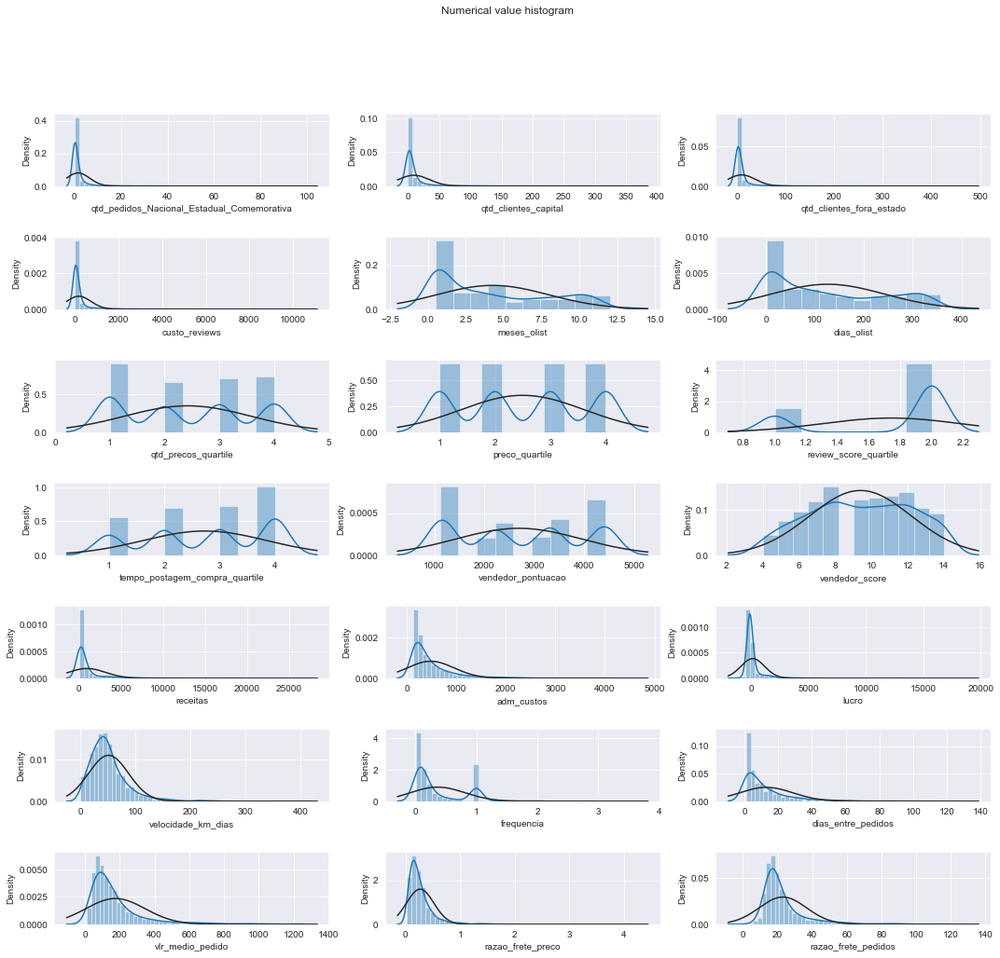

In [115]:
fig = sns.pairplot(df_abt, hue="vlr_medio_pedido", height=1.5, palette= 'brg_r')

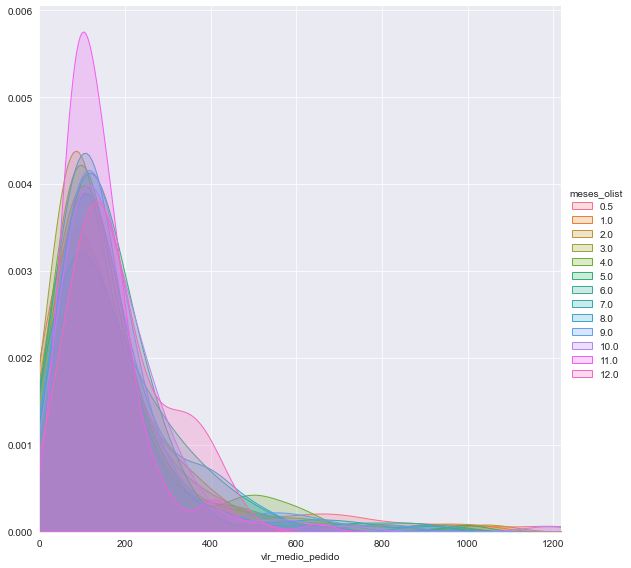

In [113]:
(sns.FacetGrid(df_abt_after,
              hue = "meses_olist",
              height = 8,
              xlim = (0, df_abt_after["vlr_medio_pedido"].max()))
.map(sns.kdeplot, "vlr_medio_pedido", shade = True)
.add_legend());

In [83]:
df_abt.shape

(1658, 31)

ValueError: could not convert string to float: 'Lite'

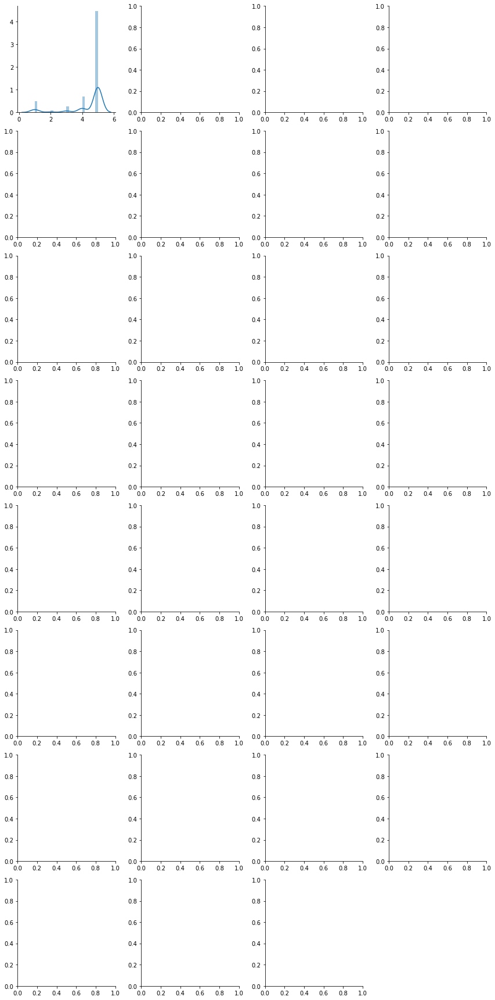

In [86]:
df = pd.DataFrame(data=df_abt, columns=features_enxutas)
nd = pd.melt(df, value_vars =df )
n1 = sns.FacetGrid (nd, col='variable', col_wrap=4, sharex=False, sharey = False)
#n1 = n1.map(sns.histplot, 'value')
n1 = n1.map(sns.distplot, 'value')
n1

In [11]:
correlacoes=df_abt[features_numericas].corr().abs()
#correlacoes=correlacoes['01_arrecadacao_2018'].sort_values(ascending=False)
print("Correlações")
df_correlacoes = pd.DataFrame(correlacoes)
print(df_correlacoes)

Correlações
                                            vendedor_cidade_id  \
vendedor_cidade_id                                    1.000000   
vendedor_estado_id                                    0.999066   
vendedor_grande_regiao_id                             0.944272   
review_score                                          0.004802   
plano_valor                                           0.031162   
plano_comissao                                        0.029377   
valor_taxa                                            0.045481   
valor_comissao                                        0.045812   
custo_frete                                           0.035027   
distancia_cliente_vendedor                            0.093737   
qtd_clientes                                          0.048462   
qtd_clientes_repete                                   0.048279   
qtd_itens_pedido                                      0.033483   
preco                                                 0.045781  

In [14]:
df_correlacoes

,vendedor_cidade_id,vendedor_estado_id,vendedor_grande_regiao_id,review_score,plano_valor,plano_comissao,valor_taxa,valor_comissao,custo_frete,distancia_cliente_vendedor,qtd_clientes,qtd_clientes_repete,qtd_itens_pedido,preco,frete_valor,preco_frete,qtd_pedidos,qtd_produtos,produto_peso_g,produto_volume_cm3,densidade_produto,produto_categoria_id,Area(km2),populacao,habit_km2,tempo_entrega_compra,tempo_aprovado_compra,tempo_estimado_compra,tempo_postagem_compra,tempo_entrega_aprovado_LeadTime,tempo_postagem_aprovado,tempo_entrega_postagem,postagem_limiteparceiro_variacao,postagem_limiteparceiro_dias_atraso,postagem_limiteparceiro_atrasado,entrega_estimado_variacao,entrega_estimado_dias_atraso,entrega_estimado_atrasado,qtd_pedidos_Nacional_Estadual_Comemorativa,qtd_clientes_capital,qtd_clientes_fora_estado,"PIB_percapita_(11000,19000]","PIB_percapita_(19000,27000]","PIB_percapita_(27000,35000]","PIB_percapita_(3285,11000]","PIB_percapita_(35000,43000]","PIB_percapita_(43000,51000]","PIB_percapita_(51000,344847]",pagamento_tipo_boleto,pagamento_tipo_cartao_credito,pagamento_tipo_cartao_debito,pagamento_tipo_voucher,pagamento_parcelas_boleto,pagamento_parcelas_cartao_credito,pagamento_parcelas_cartao_debito,pagamento_parcelas_voucher,pagamento_sequencia_boleto,pagamento_sequencia_cartao_credito,pagamento_sequencia_cartao_debito,pagamento_sequencia_voucher,pagamento_valor_boleto,pagamento_valor_cartao_credito,pagamento_valor_cartao_debito,pagamento_valor_voucher,custo_reviews,meses_olist,dias_olist,qtd_precos_quartile,preco_quartile,review_score_quartile,tempo_postagem_compra_quartile,vendedor_pontuacao,vendedor_score,receitas,adm_custos,lucro,velocidade_km_dias,frequencia,dias_entre_pedidos,vlr_medio_pedido,razao_frete_preco,razao_frete_pedidos
vendedor_cidade_id,1.000000,0.999066,0.944272,0.004802,0.031162,0.029377,0.045481,0.045812,0.035027,0.093737,0.048462,0.048279,0.033483,0.045781,0.044436,0.046452,0.048279,0.048721,0.007509,0.013004,0.049479,0.012110,0.007080,0.026103,0.018439,0.013929,0.018406,0.097758,0.004038,0.012563,0.001469,0.014939,0.004920,0.009894,0.006560,0.066684,0.035963,0.000299,0.040400,0.045952,0.081948,0.052913,0.051734,0.046022,0.067031,0.045814,0.027690,0.049054,0.041418,0.048908,0.050086,0.058024,0.041418,0.047022,0.050086,0.056731,0.041418,0.048911,0.050086,0.056731,0.037341,0.047610,0.050424,0.052768,0.049783,0.038713,0.038427,0.035681,0.033590,0.012916,0.004468,0.036029,0.028265,0.047438,0.054172,0.031203,0.176903,0.007187,0.003771,0.024251,0.008182,0.049172
vendedor_estado_id,0.999066,1.000000,0.950733,0.004476,0.033917,0.032279,0.048387,0.045583,0.034685,0.101604,0.050143,0.049974,0.033301,0.045583,0.045352,0.046406,0.049974,0.050432,0.006783,0.012590,0.047838,0.012352,0.007321,0.024909,0.020806,0.015596,0.016940,0.102316,0.003293,0.014475,0.000875,0.017610,0.005420,0.009915,0.006564,0.068890,0.035581,0.000749,0.041633,0.047694,0.085518,0.054459,0.053442,0.047486,0.068258,0.047357,0.029084,0.050972,0.043823,0.050343,0.053400,0.060484,0.043823,0.047664,0.053400,0.058744,0.043823,0.050350,0.053400,0.058744,0.038518,0.047263,0.053392,0.054685,0.051483,0.040711,0.040328,0.036548,0.033773,0.012945,0.005397,0.036846,0.028329,0.048155,0.056273,0.031023,0.183863,0.008012,0.003068,0.026179,0.008403,0.052300
vendedor_grande_regiao_id,0.944272,0.950733,1.000000,0.010318,0.045903,0.042618,0.064770,0.060265,0.040258,0.140004,0.066130,0.065899,0.034004,0.060570,0.054923,0.060916,0.065899,0.066549,0.007983,0.015580,0.033106,0.026524,0.015671,0.012587,0.034671,0.028143,0.009570,0.148323,0.006160,0.028035,0.005100,0.031780,0.007204,0.013591,0.002161,0.095227,0.031606,0.003153,0.057255,0.064277,0.124683,0.069815,0.068409,0.060407,0.084897,0.057484,0.045293,0.069612,0.058383,0.066374,0.070564,0.076992,0.058383,0.062597,0.070564,0.074001,0.058383,0.066488,0.070564,0.074001,0.051777,0.061741,0.070223,0.070425,0.070831,0.035641,0.034446,0.039388,0.026314,0.011180,0.002532,0.038799,0.027391,0.063113,0.069355,0.043533,0.215

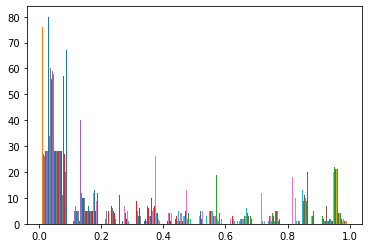

In [12]:
plt.hist(correlacoes)
plt.show()

In [52]:
df_abt[features_enxutas].columns

Index(['review_score', 'plano', 'plano_valor', 'valor_taxa', 'valor_comissao',
       'distancia_cliente_vendedor', 'qtd_itens_pedido', 'produto_peso_g',
       'densidade_produto', 'Area(km2)', 'populacao', 'habit_km2',
       'tempo_entrega_compra', 'tempo_aprovado_compra',
       'tempo_estimado_compra', 'tempo_postagem_compra',
       'postagem_limiteparceiro_variacao', 'postagem_limiteparceiro_atrasado',
       'entrega_estimado_variacao', 'entrega_estimado_dias_atraso',
       'entrega_estimado_atrasado', 'pagamento_tipo_cartao_debito',
       'meses_olist', 'qtd_precos_quartile', 'tempo_postagem_compra_quartile',
       'velocidade_km_dias', 'frequencia', 'dias_entre_pedidos',
       'vlr_medio_pedido', 'razao_frete_preco', 'razao_frete_pedidos'],
      dtype='object')

In [ ]:
corr = df_abt[features_enxutas].corr()
mask = np.zeros_like(df_abt[]corr)
mask[np.triu_indices_from(mask)] = True
fig, ax = plt.subplots(figsize=(15,15))
ax = sns.heatmap(corr, annot=True,
                 vmin=-1, vmax=1,
                 fmt=".2f", annot_kws={'size':8}, 
                 mask=mask, 
                 center=0, 
                 cmap="coolwarm")
plt.title(f"Heatmap des corrélations linéaires\n", 
          fontdict=font_title)
plt.show()


In [119]:
df_abt['frete_valor'].describe()

count     1658.000000
mean       536.298372
std       1450.621134
min          0.750000
25%         42.772500
50%        126.465000
75%        418.277500
max      19598.240000
Name: frete_valor, dtype: float64

In [118]:
df_aux=mf.Resumo_DataFrame(df_abt)
df_aux

,Colunas,Nulos,Total de nulos,Total de unicos,Numero Registros,Tipo
0,vendedor_id,0,0.0,1658,1658,object
1,vendedor_cidade,0,0.0,386,1658,object
2,vendedor_estado,0,0.0,19,1658,object
3,vendedor_cidade_id,0,0.0,386,1658,int64
4,vendedor_estado_id,0,0.0,19,1658,int64
5,vendedor_grande_regiao_id,0,0.0,5,1658,int64
6,vendedor_grande_regiao_nome,0,0.0,5,1658,object
7,review_score,0,0.0,5,1658,int64
8,plano,0,0.0,3,1658,object
9,plano_valor,0,0.0,3,1658,float64


In [ ]:
#We compare the correlation between features and remove one of two features that have a correlation higher than 0.80
cor_matrix = data.corr().abs()
upper_tri = cor_matrix.where(np.triu(np.ones(cor_matrix.shape),k=1).astype(np.bool))
to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.8)]
print(); print(to_drop)

<AxesSubplot:>

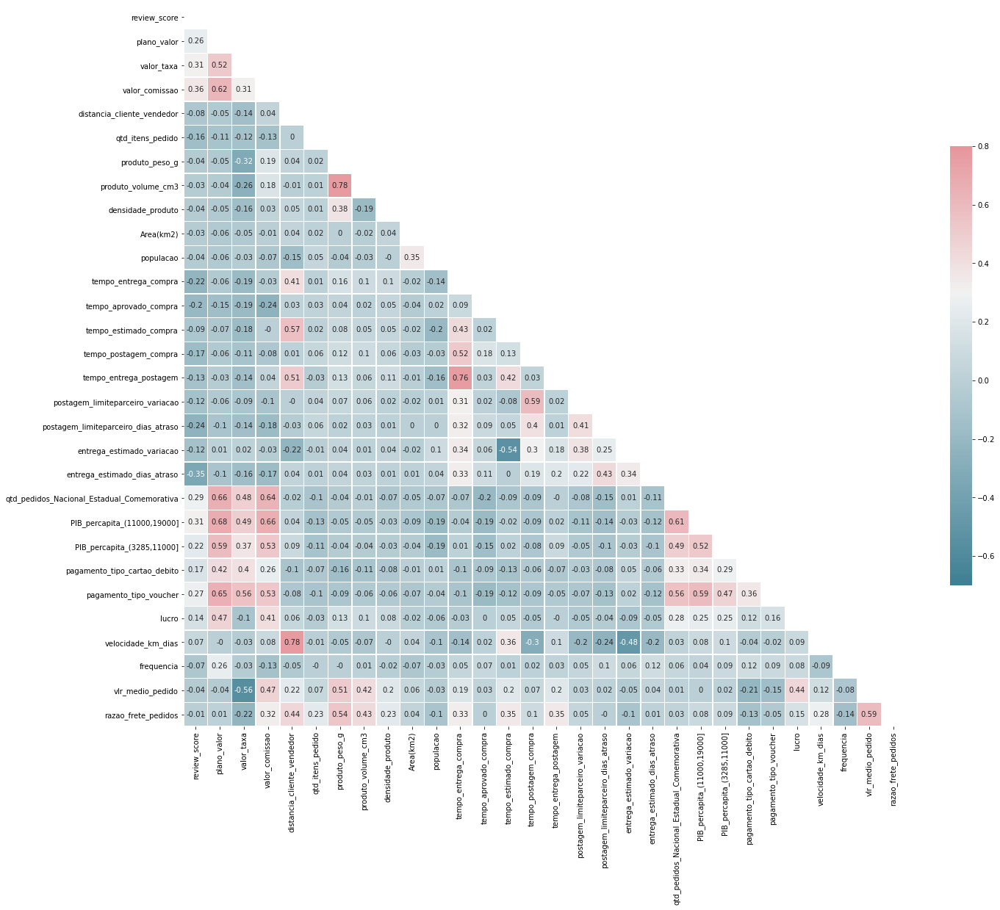

In [93]:
v_max=0.8
v_min=-0.7
v_centre=0.3
final_data_pears=round(df_abt[features_enxutas].corr(method='spearman'),2)
#coupe en deux le heatmap
mask = np.triu(np.ones_like(final_data_pears, dtype=np.bool))
f, ax = plt.subplots(figsize=(22, 22))

# couleur
cmap = sns.diverging_palette(220, 10, as_cmap=True)
sns.heatmap(final_data_pears, mask=mask, cmap=cmap, vmax=v_max,vmin=v_min, center=v_centre,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot=True)

In [ ]:
"""
Spearmans correlation coefficient: 0.900
Samples are correlated (reject H0) p=0.000

O teste estatístico relata uma forte correlação positiva com um valor de 0,9. 

O valor de p é próximo de zero,o que significa que a probabilidade de observar os dados dado que 
as amostras não são correlacionadas é 
muito improvável (por exemplo, 95% de confiança) e que podemos rejeitar a hipótese nula de que as 
amostras não são correlacionadas.

"""

In [95]:
#Correlation Tests are used to check the correlation between two independent features or variables.
#Spearman’s Rank Correlation : Tests whether a data sample is montonically separable.

#Assumption : 1-Observations in each sample are independent and distributed identically. 
#             2- Observations in each sample are ranked
#Hypothesis :

#H0: Não há correlação
#H1: Há correlação
#https://geographyfieldwork.com/SpearmansRankCalculator.html
for i in df_abt:
    test_statistics, pvalue = stats.spearmanr(df_abt[i], df_abt["produto_volume_cm3"])
    print(f"Spearman-Correlation Coefficient for {i}: = {test_statistics:.4f}, p-value = { pvalue:.5f}")

Spearman-Correlation Coefficient for review_score: = -0.0322, p-value = 0.18996
Spearman-Correlation Coefficient for plano: = 0.0073, p-value = 0.76651
Spearman-Correlation Coefficient for plano_valor: = -0.0377, p-value = 0.12494
Spearman-Correlation Coefficient for valor_taxa: = -0.2581, p-value = 0.00000
Spearman-Correlation Coefficient for valor_comissao: = 0.1806, p-value = 0.00000
Spearman-Correlation Coefficient for distancia_cliente_vendedor: = -0.0111, p-value = 0.65169
Spearman-Correlation Coefficient for qtd_itens_pedido: = 0.0143, p-value = 0.56081
Spearman-Correlation Coefficient for produto_peso_g: = 0.7831, p-value = 0.00000
Spearman-Correlation Coefficient for produto_volume_cm3: = 1.0000, p-value = 0.00000
Spearman-Correlation Coefficient for densidade_produto: = -0.1938, p-value = 0.00000
Spearman-Correlation Coefficient for Area(km2): = -0.0217, p-value = 0.37823
Spearman-Correlation Coefficient for populacao: = -0.0339, p-value = 0.16804
Spearman-Correlation Coeffic

In [ ]:
"""
Como interpreto uma correlação de Spearman estatisticamente significativa?
É importante perceber que a significância estatística não indica a força da correlação de Spearman. Na verdade, o teste de 
significância estatística da correlação de Spearman não fornece nenhuma informação sobre a força do relacionamento. 
Assim, atingir um valor de p = 0,001, por exemplo, não significa que a relação seja mais forte do que se você atingisse um 
valor de p= 0,04. Isso ocorre porque o teste de significância está investigando se você pode rejeitar ou deixar de rejeitar
a hipótese nula. Se você definir α = 0,05, alcançar uma correlação de ordem de classificação de Spearman estatisticamente 
significativa significa que você pode ter certeza de que há menos de 5% de chance de que a força do relacionamento que você
encontrou (seu coeficiente ρ) tenha acontecido por acaso se o valor nulo hipótese eram verdadeiras
"""

In [ ]:
for col in data_merge_3_cat_cus.columns:
    print(f"{col} a {len(data_merge_3_cat_cus[col].value_counts())}"
          " catégories")

'vendedor_estado'

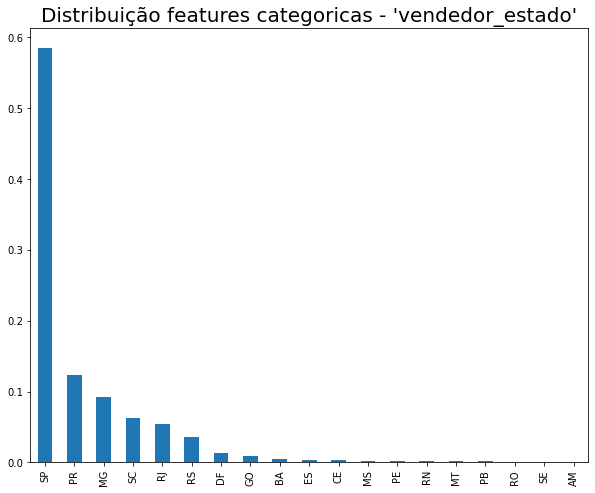

'vendedor_grande_regiao_nome'

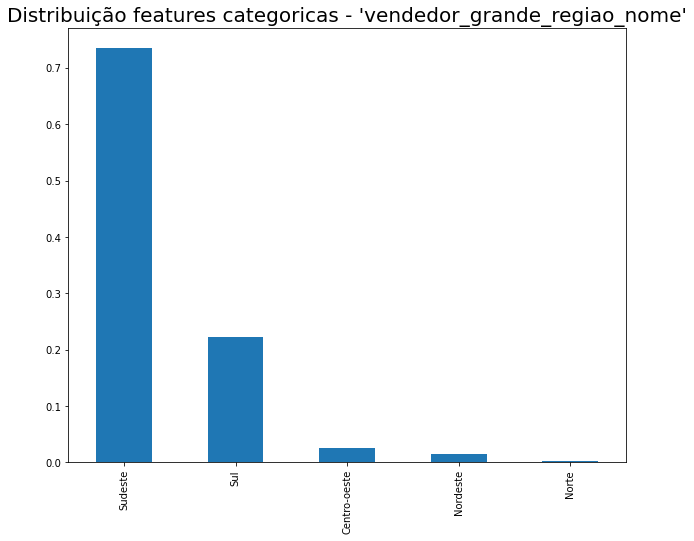

'review_score'

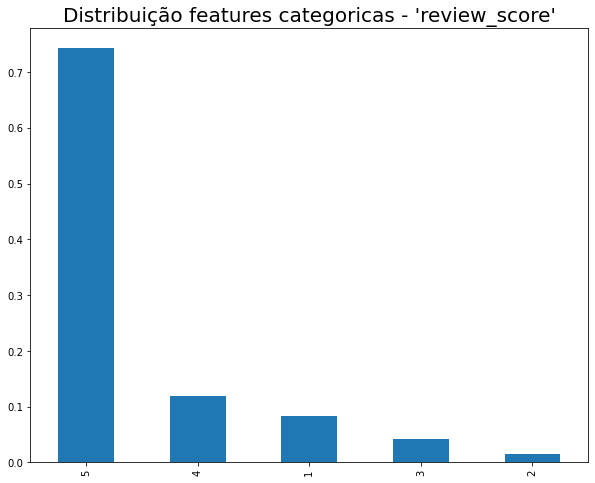

'plano'

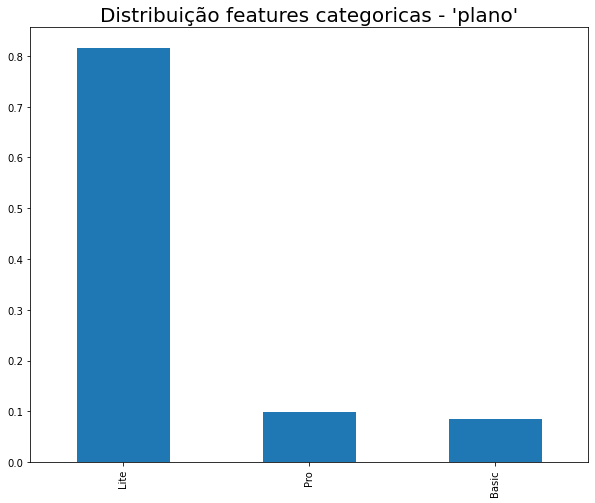

'produto_categoria_nome'

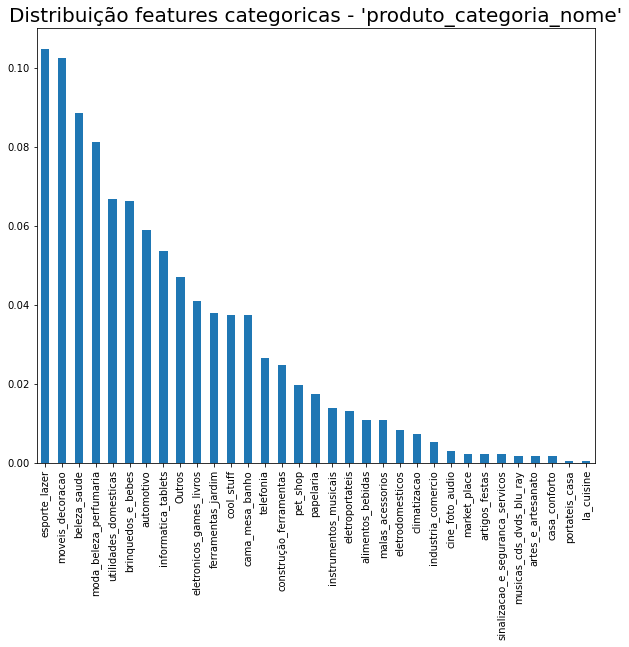

'PIB_percapita_(11000,19000]'

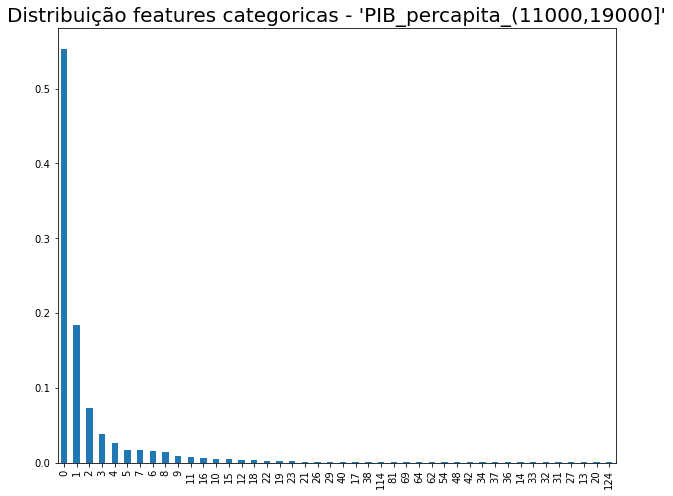

'PIB_percapita_(19000,27000]'

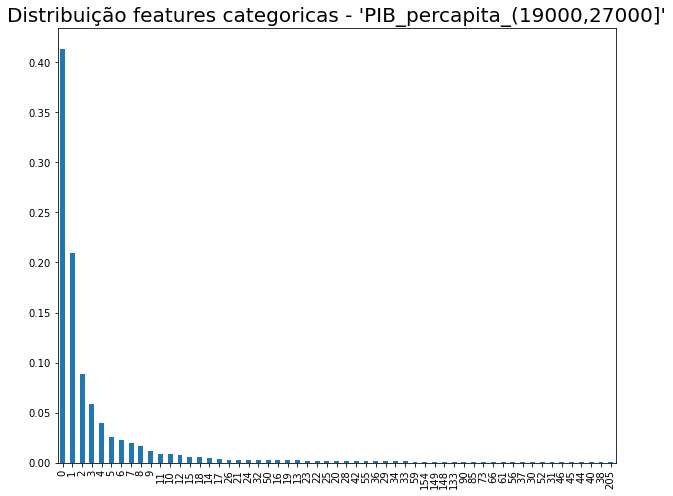

'PIB_percapita_(27000,35000]'

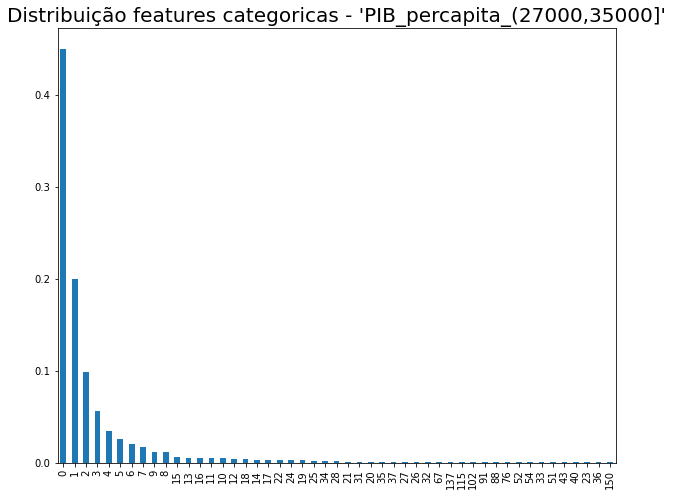

'PIB_percapita_(3285,11000]'

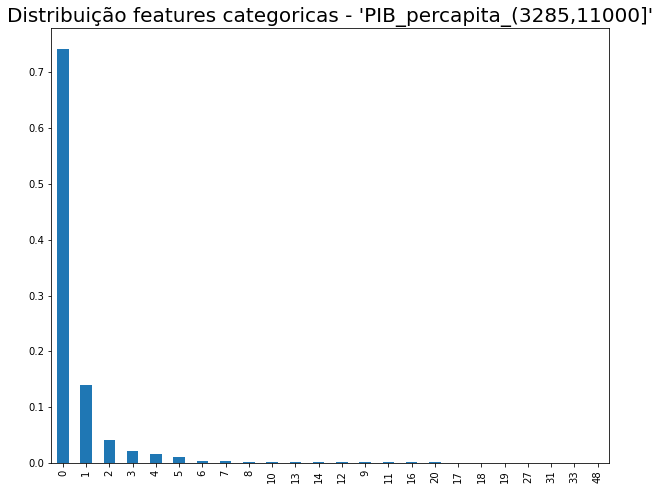

'PIB_percapita_(35000,43000]'

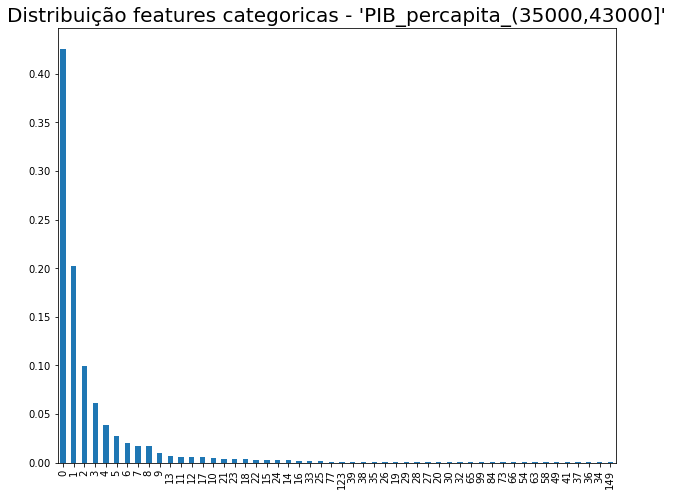

'PIB_percapita_(43000,51000]'

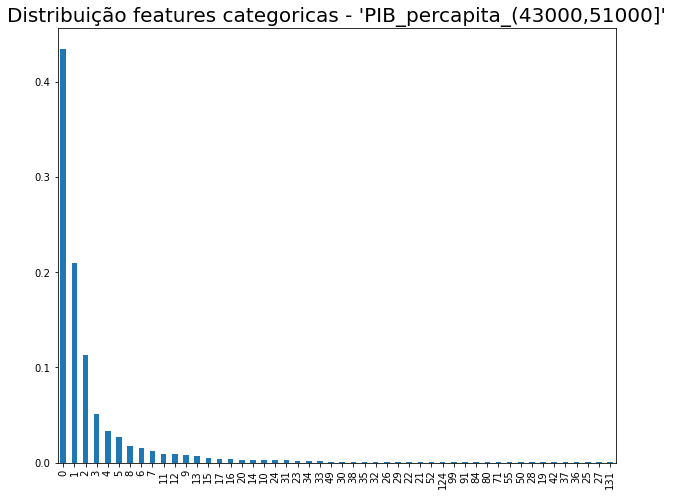

'PIB_percapita_(51000,344847]'

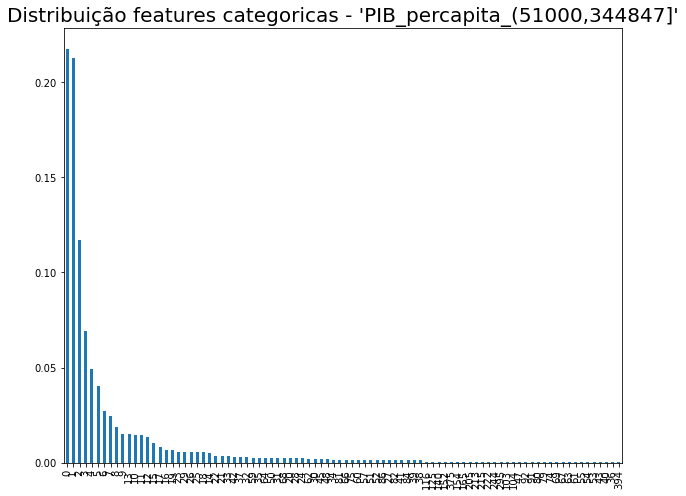

In [100]:
categorias = ['vendedor_estado', 'vendedor_grande_regiao_nome', 'review_score', 'plano', 'produto_categoria_nome',
            'PIB_percapita_(11000,19000]', 'PIB_percapita_(19000,27000]', 'PIB_percapita_(27000,35000]', 'PIB_percapita_(3285,11000]',
            'PIB_percapita_(35000,43000]', 'PIB_percapita_(43000,51000]', 'PIB_percapita_(51000,344847]']
for cat in categorias:
    display(cat)
    df_abt[cat].value_counts(normalize=True).plot(kind='bar', figsize=(10,8))
    plt.title(f"Distribuição features categoricas - '{cat}'", fontsize = 20)
    plt.show()

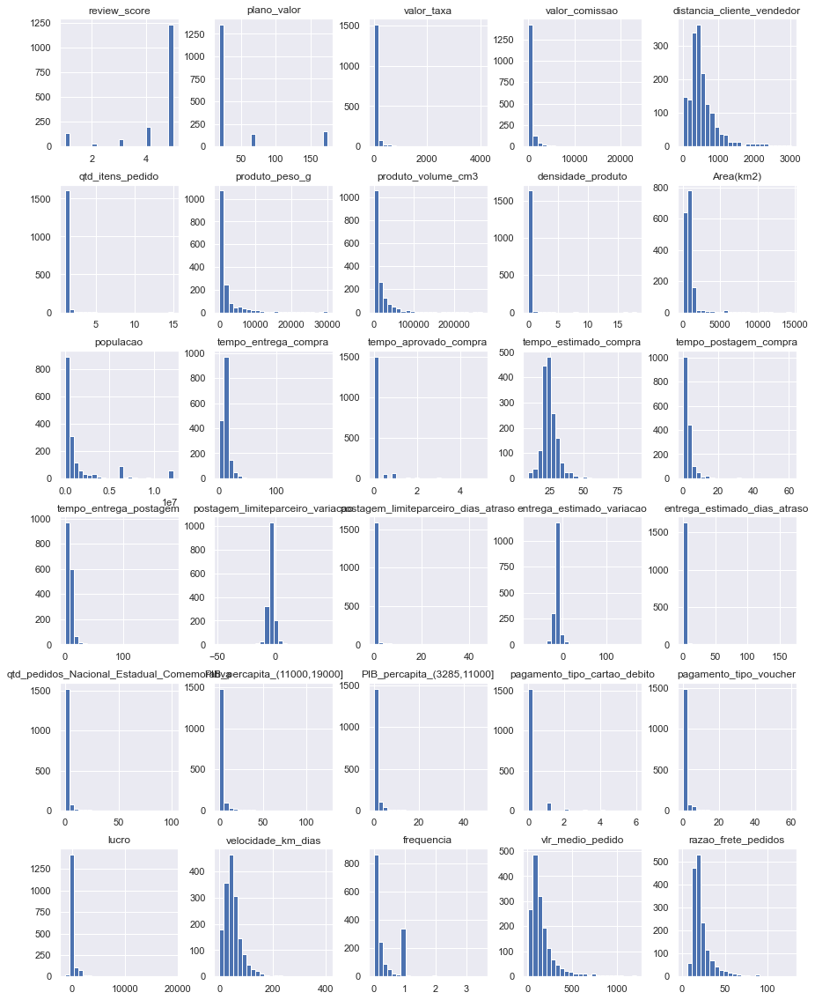

In [101]:
sns.set(rc={'figure.figsize':(12, 6)})
fig = plt.figure(figsize = (15,20))
ax = fig.gca()
df_abt[features_enxutas].hist(ax=ax, bins=24);

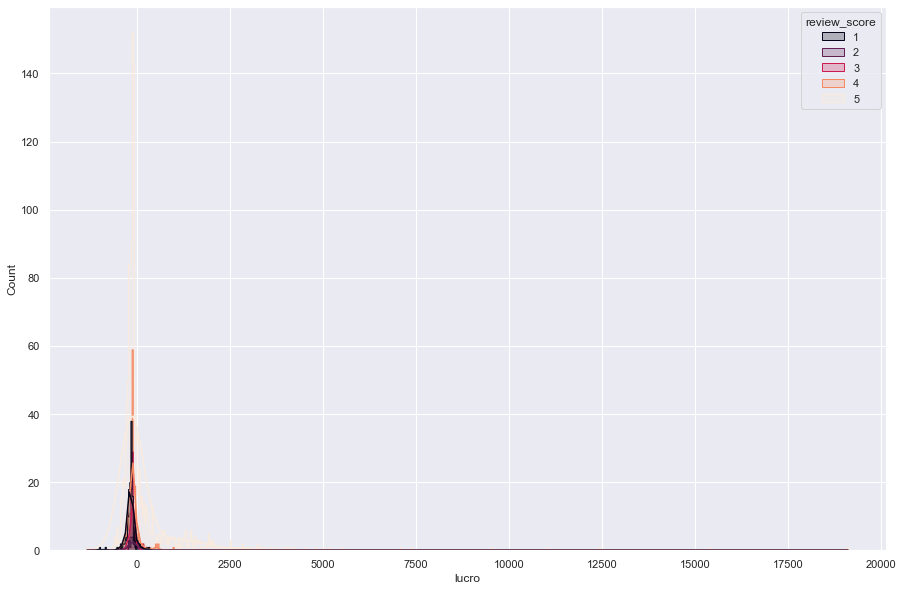

In [107]:
#olist 72
sns.set(rc={'figure.figsize':(15,10)})

#sns.histplot(data=dfaux1.loc[(dfaux1['TARGET_STATUS_DA_ORDEM'] == 'delivered') | (dfaux1['TARGET_STATUS_DA_ORDEM'] == 'canceled')],
sns.histplot(data=df_abt[features_enxutas],
            x='lucro',
            hue='review_score',
            palette='rocket',
            element="step",
            kde=True);

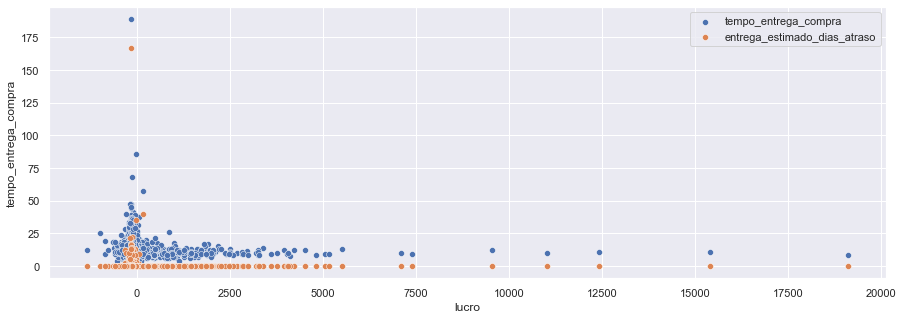

In [112]:
plt.figure(figsize=(15, 5))
sns.scatterplot(data = df_abt[features_enxutas],
                y = 'tempo_entrega_compra',
                x = 'lucro')
sns.scatterplot(data = df_abt[features_enxutas],
                y = 'entrega_estimado_dias_atraso',
                x = 'lucro')
plt.legend([
            'tempo_entrega_compra',
            'entrega_estimado_dias_atraso'
            ]);

In [114]:
df_abt

,vendedor_id,vendedor_cidade,vendedor_estado,vendedor_cidade_id,vendedor_estado_id,vendedor_grande_regiao_id,vendedor_grande_regiao_nome,review_score,plano,plano_valor,plano_comissao,valor_taxa,valor_comissao,custo_frete,distancia_cliente_vendedor,qtd_clientes,qtd_clientes_repete,qtd_itens_pedido,preco,frete_valor,preco_frete,qtd_pedidos,qtd_produtos,produto_peso_g,produto_volume_cm3,densidade_produto,produto_categoria_nome,produto_categoria_id,Area(km2),populacao,habit_km2,tempo_entrega_compra,tempo_aprovado_compra,tempo_estimado_compra,tempo_postagem_compra,tempo_entrega_aprovado_LeadTime,tempo_postagem_aprovado,tempo_entrega_postagem,postagem_limiteparceiro_variacao,postagem_limiteparceiro_dias_atraso,postagem_limiteparceiro_atrasado,entrega_estimado_variacao,entrega_estimado_dias_atraso,entrega_estimado_atrasado,qtd_pedidos_Nacional_Estadual_Comemorativa,qtd_clientes_capital,qtd_clientes_fora_estado,"PIB_percapita_(11000,19000]","PIB_percapita_(19000,27000]","PIB_percapita_(27000,35000]","PIB_percapita_(3285,11000]","PIB_percapita_(35000,43000]","PIB_percapita_(43000,51000]","PIB_percapita_(51000,344847]",pagamento_tipo_boleto,pagamento_tipo_cartao_credito,pagamento_tipo_cartao_debito,pagamento_tipo_voucher,pagamento_parcelas_boleto,pagamento_parcelas_cartao_credito,pagamento_parcelas_cartao_debito,pagamento_parcelas_voucher,pagamento_sequencia_boleto,pagamento_sequencia_cartao_credito,pagamento_sequencia_cartao_debito,pagamento_sequencia_voucher,pagamento_valor_boleto,pagamento_valor_cartao_credito,pagamento_valor_cartao_debito,pagamento_valor_voucher,custo_reviews,meses_olist,dias_olist,qtd_precos_quartile,preco_quartile,review_score_quartile,tempo_postagem_compra_quartile,vendedor_pontuacao,vendedor_score,receitas,adm_custos,lucro,velocidade_km_dias,frequencia,dias_entre_pedidos,vlr_medio_pedido,razao_frete_preco,razao_frete_pedidos
0,0015a82c2db000af6aaaf3ae2ecb0532,santo andre,SP,3547809,35,3,Sudeste,5,Lite,18.99,0.21,0,563.85,31.53,687.8890,3,3,1.0,2685.00,63.06,2748.06,3,3,11800.0,61920.0,0.190,eletroportateis,15,1234.5370,92386.002,33.480,10.0,0.0,24.0,2.0,9.0,1.0,7.0,-5.0,0.0,0,-13.0,0.0,0,1,0,0,1,0,1,0,1,0,0,0,3,0,0,0,22,0,0,0,3,0,0,0.00,2748.06,0.0,0.00,40,1.0,21,2,4,2,3,2423,11,582.84,230.68,280.63,76.43,0.142857,7,916.02,0.02,21.02
1,001cca7ae9ae17fb1caed9dfb1094831,cariacica,ES,3201308,32,3,Sudeste,5,Pro,173.99,0.19,25,3868.42,3399.56,735.3060,166,166,1.0,20360.23,6963.92,27324.15,166,167,9000.0,19656.0,0.460,ferramentas_jardim,17,520.8070,402027.039,1465.140,10.0,0.0,25.0,2.0,10.0,1.0,8.0,-5.0,0.0,0,-14.0,0.0,0,10,60,5,15,36,15,4,25,21,50,38,127,0,2,38,533,0,3,38,127,0,3,6434.32,20761.86,0.0,213.94,1285,11.0,326,4,4,2,3,4423,13,5807.31,1715.94,-593.19,73.53,0.509202,2,164.60,0.34,41.95
2,002100f778ceb8431b7a1020ff7ab48f,franca,SP,3516200,35,3,Sudeste,5,Basic,68.99,0.20,210,156.36,0.00,353.5575,38,38,1.0,781.80,593.53,1375.33,38,42,300.0,9600.0,0.030,moveis_decoracao,26,539.7165,399307.051,843.435,13.5,0.0,22.0,4.0,13.0,3.0,9.0,-3.5,0.0,0,-9.0,0.0,0,4,12,18,4,7,1,1,4,8,13,16,20,0,5,16,35,0,5,16,20,0,5,611.49,677.63,0.0,139.68,305,3.0,105,4,3,2,2,4322,11,573.33,820.99,-552.66,27.20,0.361905,3,36.19,0.76,15.62
3,003554e2dce176b5555353e4f3555ac8,goiania,GO,5208707,52,5,Centro-oeste,5,Lite,18.99,0.21,0,25.20,9.69,936.3580,1,1,1.0,120.00,19.38,139.38,1,1,1200.0,21000.0,0.060,Outros,0,1200.1770,6520265.915,5432.750,4.0,0.0,30.0,0.0,4.0,0.0,4.0,-6.0,0.0,0,-27.0,0.0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,3,0,0,0,1,0,0,0.00,139.38,0.0,0.00,0,0.5,1,1,1,2,4,1124,8,34.70,133.18,-108.17,234.09,1.000000,1,139.38,0.16,19.38
4,004c9cd9d87a3c30c522c48c4fc07416,ibitinga,SP,3519600,35,3,Sudeste,5,Pro,173.99,0.19,85,3092.50,1271.33,543.4300,129,130,1.0,16275.37,2825.29,19100.66,130,133,2146.0,16320.0,0.130,cama_mesa_banho,7,779.2000,375141.967,1488.140,11.0,0.0,24.0,1.0,11.0,1.0,9.0,-6.0,0.0,0,-14.0,0.0,0,6,45,50,16,24,18,3,15,12,42,25,102,0,4,25,543,0,16,25,104,0,16,3290.24,15468.99,0.0,445.03,915,11.0,330,4,4,2,4,4424,14,5091.39,1518

In [132]:
df_abt_aux[df_abt_aux['vlr_medio_pedido'] <= 1]

,vendedor_id,vendedor_cidade,vendedor_estado,vendedor_cidade_id,vendedor_estado_id,vendedor_grande_regiao_id,vendedor_grande_regiao_nome,review_score,plano,plano_valor,plano_comissao,valor_taxa,valor_comissao,custo_frete,distancia_cliente_vendedor,qtd_clientes,qtd_clientes_repete,qtd_itens_pedido,preco,frete_valor,preco_frete,qtd_pedidos,qtd_produtos,produto_peso_g,produto_volume_cm3,densidade_produto,produto_categoria_nome,produto_categoria_id,Area(km2),populacao,habit_km2,tempo_entrega_compra,tempo_aprovado_compra,tempo_estimado_compra,tempo_postagem_compra,tempo_entrega_aprovado_LeadTime,tempo_postagem_aprovado,tempo_entrega_postagem,postagem_limiteparceiro_variacao,postagem_limiteparceiro_dias_atraso,postagem_limiteparceiro_atrasado,entrega_estimado_variacao,entrega_estimado_dias_atraso,entrega_estimado_atrasado,qtd_pedidos_Nacional_Estadual_Comemorativa,qtd_clientes_capital,qtd_clientes_fora_estado,"PIB_percapita_(11000,19000]","PIB_percapita_(19000,27000]","PIB_percapita_(27000,35000]","PIB_percapita_(3285,11000]","PIB_percapita_(35000,43000]","PIB_percapita_(43000,51000]","PIB_percapita_(51000,344847]",pagamento_tipo_boleto,pagamento_tipo_cartao_credito,pagamento_tipo_cartao_debito,pagamento_tipo_voucher,pagamento_parcelas_boleto,pagamento_parcelas_cartao_credito,pagamento_parcelas_cartao_debito,pagamento_parcelas_voucher,pagamento_sequencia_boleto,pagamento_sequencia_cartao_credito,pagamento_sequencia_cartao_debito,pagamento_sequencia_voucher,pagamento_valor_boleto,pagamento_valor_cartao_credito,pagamento_valor_cartao_debito,pagamento_valor_voucher,custo_reviews,meses_olist,dias_olist,qtd_precos_quartile,preco_quartile,review_score_quartile,tempo_postagem_compra_quartile,vendedor_pontuacao,vendedor_score,receitas,adm_custos,lucro,velocidade_km_dias,frequencia,dias_entre_pedidos,vlr_medio_pedido,razao_frete_preco,razao_frete_pedidos


In [129]:
df_abt_aux=df_abt[df_abt['frete_valor'] != 0.75]

In [138]:
df_abt.describe()

,vendedor_cidade_id,vendedor_estado_id,vendedor_grande_regiao_id,review_score,plano_valor,plano_comissao,valor_taxa,valor_comissao,custo_frete,distancia_cliente_vendedor,qtd_clientes,qtd_clientes_repete,qtd_itens_pedido,preco,frete_valor,preco_frete,qtd_pedidos,qtd_produtos,produto_peso_g,produto_volume_cm3,densidade_produto,produto_categoria_id,Area(km2),populacao,habit_km2,tempo_entrega_compra,tempo_aprovado_compra,tempo_estimado_compra,tempo_postagem_compra,tempo_entrega_aprovado_LeadTime,tempo_postagem_aprovado,tempo_entrega_postagem,postagem_limiteparceiro_variacao,postagem_limiteparceiro_dias_atraso,postagem_limiteparceiro_atrasado,entrega_estimado_variacao,entrega_estimado_dias_atraso,entrega_estimado_atrasado,qtd_pedidos_Nacional_Estadual_Comemorativa,qtd_clientes_capital,qtd_clientes_fora_estado,"PIB_percapita_(11000,19000]","PIB_percapita_(19000,27000]","PIB_percapita_(27000,35000]","PIB_percapita_(3285,11000]","PIB_percapita_(35000,43000]","PIB_percapita_(43000,51000]","PIB_percapita_(51000,344847]",pagamento_tipo_boleto,pagamento_tipo_cartao_credito,pagamento_tipo_cartao_debito,pagamento_tipo_voucher,pagamento_parcelas_boleto,pagamento_parcelas_cartao_credito,pagamento_parcelas_cartao_debito,pagamento_parcelas_voucher,pagamento_sequencia_boleto,pagamento_sequencia_cartao_credito,pagamento_sequencia_cartao_debito,pagamento_sequencia_voucher,pagamento_valor_boleto,pagamento_valor_cartao_credito,pagamento_valor_cartao_debito,pagamento_valor_voucher,custo_reviews,meses_olist,dias_olist,qtd_precos_quartile,preco_quartile,review_score_quartile,tempo_postagem_compra_quartile,vendedor_pontuacao,vendedor_score,receitas,adm_custos,lucro,velocidade_km_dias,frequencia,dias_entre_pedidos,vlr_medio_pedido,razao_frete_preco,razao_frete_pedidos
count,1.658000e+03,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1.658000e+03,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000,1658.000000
mean,3.651882e+06,36.243667,3.254524,4.422195,38.667322,0.207159,64.704463,615.811007,165.585139,550.969478,25.525935,25.779252,1.057298,3132.938148,536.298372,3669.236520,25.779252,26.483112,2328.396261,16592.490651,0.192790,16.161641,939.239646,1.523444e+06,2138.170528,11.968034,0.097708,24.628468,3.163148,11.535585,2.724065,7.985525,-3.615802,0.425513,0.046441,-12.911641,0.416466,0.029554,1.528951,9.384198,8.614596,2.287093,3.950543,3.117612,0.771411,3.448733,3.153800,9.050060,5.398673,19.863088,0.123040,1.016285,5.398673,74.354644,0.123040,1.553679,5.398673,19.946924,0.123040,1.553679,666.950519,2995.202847,6.022033,66.445748,177.388420,4.268697,125.843788,2.419783,2.500000,1.742461,2.733414,2689.940893,9.395657,938.393661,482.509704,112.910398,51.221731,0.364563,12.820265,175.592153,0.266912,23.051369
std,4.408621e+05,4.471701,0.532918,1.188982,47.091972,0.006346,221.879290,1734.799529,526.690396,431.798770,70.997282,72.000609,0.426956,9113.635527,1450.621134,10369.777942,72.000609,74.582572,4247.726256,26376.565300,0.658209,9.896040,1071.218947,2.659824e+06,2250.930774,7.705280,0.386613,6.476648,4.348025,7.674303,4.317479,6.275348,4.302339,2.744067,0.210503,8.458668,4.613203,0.169404,4.949053,24.879386,28.195634

In [135]:
df_abt['frete_valor'].min()

0.75

In [140]:
df_abt[features_enxutas]

,review_score,plano,plano_valor,valor_taxa,valor_comissao,distancia_cliente_vendedor,qtd_itens_pedido,produto_peso_g,produto_volume_cm3,densidade_produto,Area(km2),populacao,tempo_entrega_compra,tempo_aprovado_compra,tempo_estimado_compra,tempo_postagem_compra,tempo_entrega_postagem,postagem_limiteparceiro_variacao,postagem_limiteparceiro_dias_atraso,entrega_estimado_variacao,entrega_estimado_dias_atraso,qtd_pedidos_Nacional_Estadual_Comemorativa,"PIB_percapita_(11000,19000]","PIB_percapita_(3285,11000]",pagamento_tipo_cartao_debito,pagamento_tipo_voucher,lucro,velocidade_km_dias,frequencia,vlr_medio_pedido,razao_frete_pedidos
0,5,Lite,18.99,0,563.85,687.8890,1.0,11800.0,61920.0,0.190,1234.5370,92386.002,10.0,0.0,24.0,2.0,7.0,-5.0,0.0,-13.0,0.0,1,1,0,0,0,280.63,76.43,0.142857,916.02,21.02
1,5,Pro,173.99,25,3868.42,735.3060,1.0,9000.0,19656.0,0.460,520.8070,402027.039,10.0,0.0,25.0,2.0,8.0,-5.0,0.0,-14.0,0.0,10,15,4,0,2,-593.19,73.53,0.509202,164.60,41.95
2,5,Basic,68.99,210,156.36,353.5575,1.0,300.0,9600.0,0.030,539.7165,399307.051,13.5,0.0,22.0,4.0,9.0,-3.5,0.0,-9.0,0.0,4,4,1,0,5,-552.66,27.20,0.361905,36.19,15.62
3,5,Lite,18.99,0,25.20,936.3580,1.0,1200.0,21000.0,0.060,1200.1770,6520265.915,4.0,0.0,30.0,0.0,4.0,-6.0,0.0,-27.0,0.0,0,0,0,0,0,-108.17,234.09,1.000000,139.38,19.38
4,5,Pro,173.99,85,3092.50,543.4300,1.0,2146.0,16320.0,0.130,779.2000,375141.967,11.0,0.0,24.0,1.0,9.0,-6.0,0.0,-14.0,0.0,6,16,3,0,4,1386.54,49.40,0.393939,146.93,21.73
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1653,3,Lite,18.99,5,3.13,523.0960,1.0,500.0,1632.0,0.310,478.5210,139682.985,12.0,0.0,26.0,1.0,11.0,-5.0,0.0,-15.0,0.0,0,0,0,0,0,-130.56,43.59,1.000000,31.01,16.11
1654,5,Lite,18.99,10,173.49,547.8610,1.0,2350.0,23040.0,0.170,935.4290,1484941.084,11.0,0.0,21.0,3.0,6.0,-1.0,0.0,-11.0,0.0,0,0,0,0,0,-132.25,54.79,0.026316,159.03,41.01
1655,5,Lite,18.99,0,258.30,449.1380,1.0,7600.0,60000.0,0.130,794.5710,290769.012,16.0,0.0,23.0,4.0,11.0,-3.0,0.0,-10.0,0.0,0,0,0,0,0,-279.17,28.07,0.100000,168.85,32.20
1656,5,Lite,18.99,15,564.08,425.6365,1.0,7500.0,37360.0,0.180,1472.4920,290306.501,12.0,0.0,22.5,1.0,8.5,-5.0,0.0,-12.0,0.0,1,3,0,0,0,-302.79,35.47,0.103896,199.67,31.79


In [ ]:
sns.pairplot(df_abt[features_enxutas])

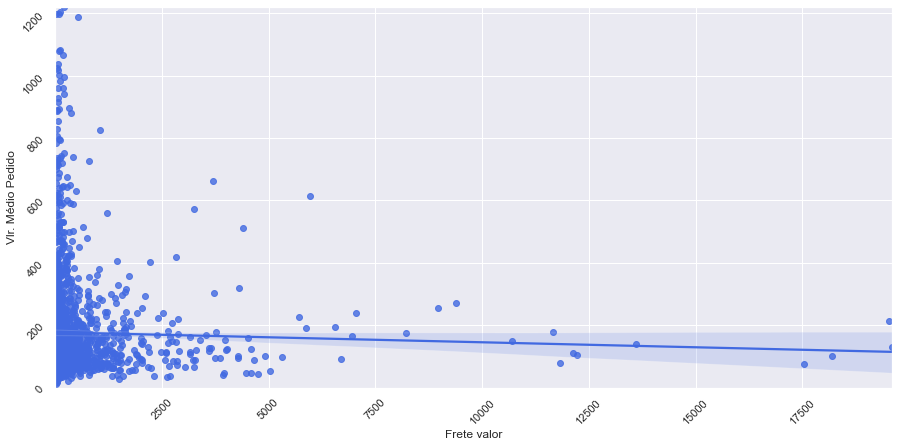

In [137]:
plt.figure(figsize=(15, 7))
ax = sns.regplot(
                data = df_abt,
                x = 'frete_valor',
                y = 'vlr_medio_pedido',
                color = 'royalblue')

ax.set_xlim(df_abt['frete_valor'].min() + 1, df_abt['frete_valor'].max() + 1)
ax.set_ylim(0, df_abt['vlr_medio_pedido'].max() + 1)

ax.set_xlabel('Frete valor')
ax.set_ylabel('Vlr. Médio Pedido')
#new_labels = [dt.fromordinal(int(item)) for item in ax.get_xticks()]
#ax.set_xticklabels(new_labels)
ax.tick_params(labelrotation=45)

In [ ]:
#Log function will help reduce the outliers
for c in numerical_variables_df:
    numerical_variables_df[c] = np.log(numerical_variables_df[c])
fig_dims = (15, 6)
fig, ax = plt.subplots(figsize=fig_dims)
df = pd.DataFrame(data = numerical_variables_df, columns = numerical_variables_df.columns)

sns.boxplot(x="variable", y="value",ax=ax, data=pd.melt(df))
plt.xticks(rotation=60)

plt.show()

In [ ]:
#variavel categorica
olist.product_category_name.value_counts(normalize = True)[:10].plot.bar(figsize=(10, 5), grid = True)
plt.title('Most selling items')
plt.ylabel('Proportion')


In [ ]:
olist.product_category_name.value_counts(normalize = True).plot.bar(figsize=(20, 7), grid = True)
plt.title('Proportion product_category_name')
plt.ylabel('Proportion')

In [ ]:
seller_city1.head(50).plot.bar(figsize=(20, 7), grid = True)
plt.title('top 50 seller city')
plt.ylabel('Proportion')

In [ ]:
olist.seller_state.value_counts(normalize = True).plot.bar(figsize=(20, 7), grid = True)
plt.title('Proportion of seller state')
plt.ylabel('Proportion')

In [ ]:
#63_Varios/EDA_and_prediction_on_Brazillian
#Distribuição
olist.hist(figsize=(20,20))
plt.show

figure(figsize=(6, 6), dpi=80)
sns.distplot(df['Close_ETF'], hist=True, kde=True)

In [ ]:
#63_Varios/EDA_and_prediction_on_Brazillian
#densidades
olist.plot(kind='density', layout =(10,4), subplots=True, sharex=False, figsize = (20,20))
plt.show

In [ ]:
"""Os gráficos de distribuição e densidade acima mostram a distribuição de cada característica numérica para ambas 
as classes positivas e negativas.
Podemos observar que há uma sobreposição quase completa tanto da distribuição para as classes positivas quanto 
para as negativas, o que sugere que não é possível classificá-las com base apenas nessas características.
Vejamos a assimetria e a curtose.
"""

In [ ]:
"""
Skewness é a medida de simetria do conjunto de dados. a inclinação negativa mostra que a coluna está inclinada para 
a esquerda ou inclinada negativamente e a inclinação positiva mostra que a coluna está inclinada para a direita. 
Se assimetria = 0, então o conjunto de dados segue uma distribuição normal.

A curtose mostra se os dados são de cauda pesada ou de cauda leve. A curtose 0 é mesocúrtica (distribuição normal), 
a curtose negativa é platicúrtica (caudas planas e finas), a curtose positiva (leptocúrtica) com distribuição pontiaguda
e caudas grossas.

"""

In [33]:
df_abt

,vendedor_id,vendedor_cidade,vendedor_estado,vendedor_cidade_id,vendedor_estado_id,vendedor_grande_regiao_id,vendedor_grande_regiao_nome,review_score,plano,plano_valor,plano_comissao,valor_taxa,valor_comissao,custo_frete,distancia_cliente_vendedor,qtd_clientes,qtd_clientes_repete,qtd_itens_pedido,preco,frete_valor,preco_frete,qtd_pedidos,qtd_produtos,produto_peso_g,produto_volume_cm3,densidade_produto,produto_categoria_nome,produto_categoria_id,Area(km2),populacao,habit_km2,tempo_entrega_compra,tempo_aprovado_compra,tempo_estimado_compra,tempo_postagem_compra,tempo_entrega_aprovado_LeadTime,tempo_postagem_aprovado,tempo_entrega_postagem,postagem_limiteparceiro_variacao,postagem_limiteparceiro_dias_atraso,postagem_limiteparceiro_atrasado,entrega_estimado_variacao,entrega_estimado_dias_atraso,entrega_estimado_atrasado,qtd_pedidos_Nacional_Estadual_Comemorativa,qtd_clientes_capital,qtd_clientes_fora_estado,"PIB_percapita_(11000,19000]","PIB_percapita_(19000,27000]","PIB_percapita_(27000,35000]","PIB_percapita_(3285,11000]","PIB_percapita_(35000,43000]","PIB_percapita_(43000,51000]","PIB_percapita_(51000,344847]",pagamento_tipo_boleto,pagamento_tipo_cartao_credito,pagamento_tipo_cartao_debito,pagamento_tipo_voucher,pagamento_parcelas_boleto,pagamento_parcelas_cartao_credito,pagamento_parcelas_cartao_debito,pagamento_parcelas_voucher,pagamento_sequencia_boleto,pagamento_sequencia_cartao_credito,pagamento_sequencia_cartao_debito,pagamento_sequencia_voucher,pagamento_valor_boleto,pagamento_valor_cartao_credito,pagamento_valor_cartao_debito,pagamento_valor_voucher,custo_reviews,meses_olist,dias_olist,qtd_precos_quartile,preco_quartile,review_score_quartile,tempo_postagem_compra_quartile,vendedor_pontuacao,vendedor_score,receitas,adm_custos,lucro,velocidade_km_dias,frequencia,dias_entre_pedidos,vlr_medio_pedido,razao_frete_preco,razao_frete_pedidos
0,0015a82c2db000af6aaaf3ae2ecb0532,santo andre,SP,3547809,35,3,Sudeste,5,Lite,18.99,0.21,0,563.85,31.53,687.8890,3,3,1.0,2685.00,63.06,2748.06,3,3,11800.0,61920.0,0.190,eletroportateis,15,1234.5370,92386.002,33.480,10.0,0.0,24.0,2.0,9.0,1.0,7.0,-5.0,0.0,0,-13.0,0.0,0,1,0,0,1,0,1,0,1,0,0,0,3,0,0,0,22,0,0,0,3,0,0,0.00,2748.06,0.0,0.00,40,1.0,21,2,4,2,3,2423,11,582.84,230.68,280.63,76.43,0.142857,7,916.02,0.02,21.02
1,001cca7ae9ae17fb1caed9dfb1094831,cariacica,ES,3201308,32,3,Sudeste,5,Pro,173.99,0.19,25,3868.42,3399.56,735.3060,166,166,1.0,20360.23,6963.92,27324.15,166,167,9000.0,19656.0,0.460,ferramentas_jardim,17,520.8070,402027.039,1465.140,10.0,0.0,25.0,2.0,10.0,1.0,8.0,-5.0,0.0,0,-14.0,0.0,0,10,60,5,15,36,15,4,25,21,50,38,127,0,2,38,533,0,3,38,127,0,3,6434.32,20761.86,0.0,213.94,1285,11.0,326,4,4,2,3,4423,13,5807.31,1715.94,-593.19,73.53,0.509202,2,164.60,0.34,41.95
2,002100f778ceb8431b7a1020ff7ab48f,franca,SP,3516200,35,3,Sudeste,5,Basic,68.99,0.20,210,156.36,0.00,353.5575,38,38,1.0,781.80,593.53,1375.33,38,42,300.0,9600.0,0.030,moveis_decoracao,26,539.7165,399307.051,843.435,13.5,0.0,22.0,4.0,13.0,3.0,9.0,-3.5,0.0,0,-9.0,0.0,0,4,12,18,4,7,1,1,4,8,13,16,20,0,5,16,35,0,5,16,20,0,5,611.49,677.63,0.0,139.68,305,3.0,105,4,3,2,2,4322,11,573.33,820.99,-552.66,27.20,0.361905,3,36.19,0.76,15.62
3,003554e2dce176b5555353e4f3555ac8,goiania,GO,5208707,52,5,Centro-oeste,5,Lite,18.99,0.21,0,25.20,9.69,936.3580,1,1,1.0,120.00,19.38,139.38,1,1,1200.0,21000.0,0.060,Outros,0,1200.1770,6520265.915,5432.750,4.0,0.0,30.0,0.0,4.0,0.0,4.0,-6.0,0.0,0,-27.0,0.0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,3,0,0,0,1,0,0,0.00,139.38,0.0,0.00,0,0.5,1,1,1,2,4,1124,8,34.70,133.18,-108.17,234.09,1.000000,1,139.38,0.16,19.38
4,004c9cd9d87a3c30c522c48c4fc07416,ibitinga,SP,3519600,35,3,Sudeste,5,Pro,173.99,0.19,85,3092.50,1271.33,543.4300,129,130,1.0,16275.37,2825.29,19100.66,130,133,2146.0,16320.0,0.130,cama_mesa_banho,7,779.2000,375141.967,1488.140,11.0,0.0,24.0,1.0,11.0,1.0,9.0,-6.0,0.0,0,-14.0,0.0,0,6,45,50,16,24,18,3,15,12,42,25,102,0,4,25,543,0,16,25,104,0,16,3290.24,15468.99,0.0,445.03,915,11.0,330,4,4,2,4,4424,14,5091.39,1518

In [41]:
df_vlr_medio_pedido=pd.DataFrame(df_abt['vlr_medio_pedido'])

In [42]:
df_vlr_medio_pedido.columns=['vlr_medio_pedido']

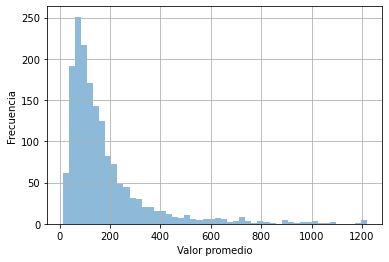

In [36]:
fig, ax = plt.subplots()
ax.hist(df_vlr_medio_pedido, bins=50, alpha=0.5)
ax.set_xlabel('Valor promedio')
ax.set_ylabel('Frecuencia')
ax.grid()

In [43]:
df_vlr_medio_pedido

,vlr_medio_pedido
0,916.02
1,164.60
2,36.19
3,139.38
4,146.93
...,...
1653,31.01
1654,159.03
1655,168.85
1656,199.67


In [85]:
df_abt['vlr_medio_pedido'].mean()

175.59215319662238

In [44]:
df_vlr_medio_pedido['vlr_medio_pedido'].skew()

2.7951122143715867

In [45]:
df_vlr_medio_pedido['vlr_medio_pedido'].kurt()

9.730961812583766

In [47]:
muestra_promedio = []

tamano = 5000

for i in range(0, tamano):
    #muestra_promedio.append(df_vlr_medio_pedido['vlr_medio_pedido'].sample(n=100).mean().values[0])
    muestra_promedio.append(df_vlr_medio_pedido['vlr_medio_pedido'].sample(n=100).mean())

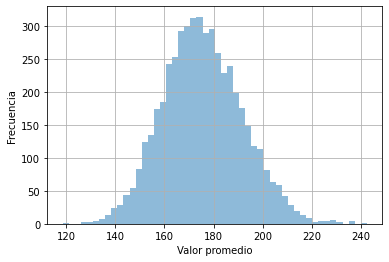

In [48]:
fig, ax = plt.subplots()
ax.hist(muestra_promedio, bins=50, alpha=0.5)
ax.set_xlabel('Valor promedio')
ax.set_ylabel('Frecuencia')
ax.grid()

In [51]:
df_normal=pd.DataFrame(muestra_promedio)

In [53]:
df_normal.columns = ['vlr_medio_pedido']

In [56]:
df_normal['vlr_medio_pedido'].kurt()

0.10181980383963696

In [55]:
df_normal['vlr_medio_pedido'].skew()

0.2379655788117648

In [58]:
print(normaltest_teste)
print(normaltest_valor_p)

48.09169040441639
3.605970055702658e-11


In [57]:
 normaltest_teste,normaltest_valor_p = normaltest(df_normal['vlr_medio_pedido'])

In [59]:
def sampling(data):

    sample_size = 500
    index = np.random.choice(range(0, data.shape[0]), size=sample_size)
    sample_df = data.iloc[index]

    return sample_df


In [120]:
def sample_means( data):
    n_sample = 15000
    sample_size = 500
    samp_means = []

    for sample in range(n_sample):
        sample = sampling(data)
        samp_means.append(sample.mean())

    return samp_means


In [121]:
dist_brasil = sample_means(df_normal['vlr_medio_pedido'])

In [88]:
df_normal['vlr_medio_pedido'].kurt()

0.10181980383963696

In [122]:
df_normal2=pd.DataFrame(dist_brasil)

In [123]:
df_normal2.columns = ['vlr_medio_pedido']

In [119]:
df_abt['vlr_medio_pedido'].kurt()

9.730961812583766

In [133]:
stats.kurtosis(df_abt['vlr_medio_pedido'], fisher=False)

12.698024462501708

In [132]:
stats.kurtosis(df_normal2['vlr_medio_pedido'], fisher=False)

2.9866611333922535

In [136]:
stats.kurtosis(df_normal3['vlr_medio_pedido'], fisher=False)

3.0449681179245776

In [124]:
df_normal2['vlr_medio_pedido'].kurt()

-0.012943207272400503

In [125]:
df_normal2['vlr_medio_pedido'].skew()

-0.007742963246190402

In [126]:
 normaltest_teste,normaltest_valor_p = normaltest(df_normal2['vlr_medio_pedido'])

In [127]:
print(normaltest_teste)
print(normaltest_valor_p)

0.2436237431672248
0.8853149057281626


In [130]:
df_normal2

,vlr_medio_pedido
0,175.500341
1,174.817718
2,176.258751
3,176.837785
4,175.185821
...,...
14995,175.882839
14996,176.048240
14997,174.535082
14998,175.716504


In [128]:
df_normal2['vlr_medio_pedido'].describe()

count    15000.000000
mean       175.570727
std          0.724541
min        172.730517
25%        175.079970
50%        175.569890
75%        176.057520
max        178.534657
Name: vlr_medio_pedido, dtype: float64

In [97]:
df_abt['vlr_medio_pedido'].describe()

count    1658.000000
mean      175.592153
std       170.428507
min        11.630000
25%        75.272500
50%       122.935000
75%       205.237500
max      1219.410000
Name: vlr_medio_pedido, dtype: float64

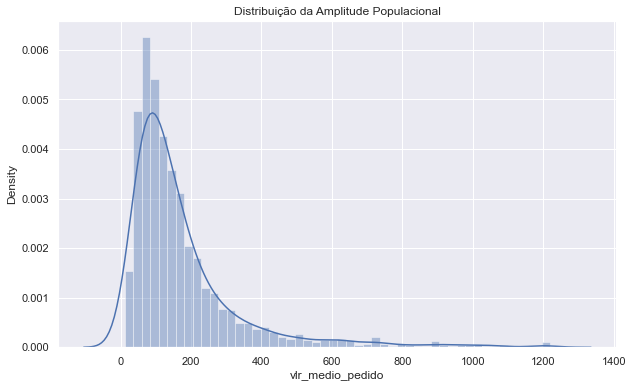

In [158]:
sns.set()
plt.figure(figsize = (10, 6))
plt.xlabel("Amplitude")
#plt.ylabel("Densidade")
plt.title("Distribuição da Amplitude Populacional")
sns.distplot(df_abt['vlr_medio_pedido'])
plt.show()

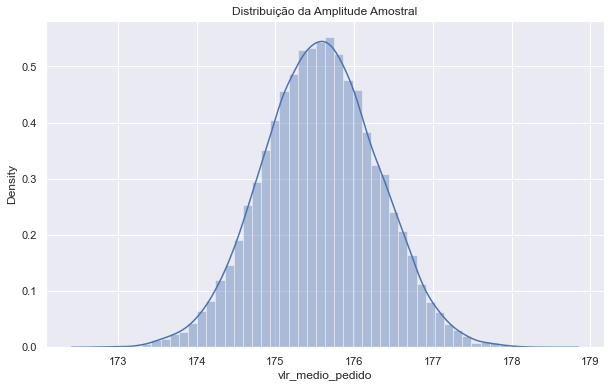

In [157]:
sns.set()
plt.figure(figsize = (10, 6))
plt.xlabel("Amplitude")
#plt.ylabel("Densidade")
plt.title("Distribuição da Amplitude Amostral")
sns.distplot(df_normal2['vlr_medio_pedido'])
plt.show()

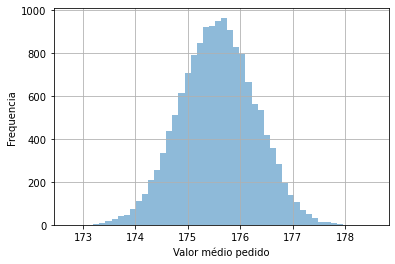

In [129]:
fig, ax = plt.subplots()
ax.hist(df_normal2['vlr_medio_pedido'], bins=50, alpha=0.5)
ax.set_xlabel('Valor médio pedido')
ax.set_ylabel('Frequencia')
ax.grid()

In [103]:
#𝐻_0: 𝑥 ̅_vlr_medio_pedido = 𝜇_vlr_medio_pedido (175.59);
#𝐻_1: 𝑥 ̅_vlr_medio_pedido ≠ 𝜇_vlr_medio_pedido (175.59)

tscore, pvalue = stats.ttest_1samp(df_normal2['vlr_medio_pedido'], popmean=175.59)
print("t Statistic: {:.4f}".format(tscore))  
print("P Value: {:.4f}".format(pvalue))
print()
print('************ Decision rule***********')
print()
if pvalue<0.05:
    print('The p-value is less than aplha = 0.05, reject the null hypothesis')
else:
    print('Since p-value is greater than 0.05, there is no sufficient evidence to reject the null hypothesis')

t Statistic: -1.5989
P Value: 0.1100

************ Decision rule***********

Since p-value is greater than 0.05, there is no sufficient evidence to reject the null hypothesis


In [ ]:
#Assim, a média populacional = média hipotética.

In [106]:
df_normal3=pd.DataFrame(df_abt['vlr_medio_pedido'])

In [108]:
df_normal3['vlr_medio_pedido']=np.log(df_abt['vlr_medio_pedido'])

In [111]:
df_normal3['vlr_medio_pedido'].describe()

count    1658.000000
mean        4.851369
std         0.768456
min         2.453588
25%         4.321115
50%         4.811656
75%         5.324167
max         7.106122
Name: vlr_medio_pedido, dtype: float64

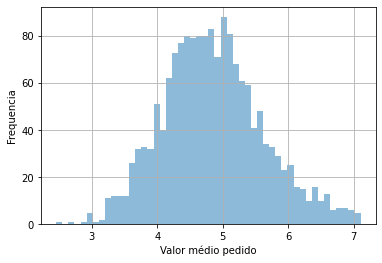

In [112]:
fig, ax = plt.subplots()
ax.hist(df_normal3['vlr_medio_pedido'], bins=50, alpha=0.5)
ax.set_xlabel('Valor médio pedido')
ax.set_ylabel('Frequencia')
ax.grid()

In [113]:
df_normal3['vlr_medio_pedido'].skew()

0.30998829739724976

In [114]:
df_normal3['vlr_medio_pedido'].kurt()

0.04873158936990096

In [117]:
print(normaltest_teste)
print(normaltest_valor_p)

25.774830395545766
2.5296864447852818e-06


In [118]:
tscore, pvalue = stats.ttest_1samp(df_normal3['vlr_medio_pedido'], popmean=175.59)
print("t Statistic: {:.4f}".format(tscore))  
print("P Value: {:.4f}".format(pvalue))
print()
print('************ Decision rule***********')
print()
if pvalue<0.05:
    print('The p-value is less than aplha = 0.05, reject the null hypothesis')
else:
    print('Since p-value is greater than 0.05, there is no sufficient evidence to reject the null hypothesis')

t Statistic: -9047.0094
P Value: 0.0000

************ Decision rule***********

The p-value is less than aplha = 0.05, reject the null hypothesis


In [ ]:
"""
Teorema do Limite Central (TLC):
Conforme vimos nos histogramas plotados anteriormente, a distribuição da população em função do número de anos de estudo 
não se comporta como uma distribuição normal. Contudo, os testes estatísticos mais robustos têm como premissa que a 
distribuição seja uma distribuição normal.

O Teorema do Limite Central surge para ajudar nesse sentido. Segundo este teorema, dada uma população, se tomarmos um 
número suficientemente grande de amostras (n_sample) de tamanho suficientemente grande (sample_size), a distribuição das
médias de cada amostra se comportará como uma distribuição normal, cuja média se aproxima da média da população e cujo 
desvio padrão se aproxima do desvio padrão da população dividido pelo tamanho da amostra.

No nosso caso, usaremos o Teorema do Limite Central para criar uma distribuição normal que represente a distribuição de
anos de estudo da população brasileira e também para criar distribuições normais que representam os anos de estudo das 
populações de cada uma das quatro regiões analisadas.
"""

In [ ]:
"""
Agora sim as distribuições se aproximam mais de distribuições normais, como evidenciado pelos plots e pela verificação 
da curtose (lembrando que a curtose da distribuição normal é 3,0) e podemos seguir com a aplicação de testes estatísticos.
"""

In [148]:
normaltest_teste,normaltest_valor_p = normaltest(df_normal2['vlr_medio_pedido'])
print(normaltest_teste)
print(normaltest_valor_p)

0.2436237431672248
0.8853149057281626


In [152]:
normal_shapiro_teste, normal_shapiro_valor_p = stats.shapiro(df_normal2['vlr_medio_pedido'])
print(normal_shapiro_teste)
print(normal_shapiro_valor_p)

0.9999361038208008
0.9847416877746582


In [150]:
normaltest_teste,normaltest_valor_p = normaltest(df_normal3['vlr_medio_pedido'])
print(normaltest_teste)
print(normaltest_valor_p)

25.774830395545766
2.5296864447852818e-06


In [153]:
normal_shapiro_teste, normal_shapiro_valor_p = stats.shapiro(df_normal3['vlr_medio_pedido'])
print(normal_shapiro_teste)
print(normal_shapiro_valor_p)

0.9924290180206299
1.5829837707315164e-07


In [160]:
# Performs t-test comparing two independent samples from the same population.
def perform_t_test_2_sample(self, dist1, dist2, title1, title2):
    # alpha=0.95   sample_size=500
    alpha = self.alpha
    sample_size = self.sample_size

    t_test = st.ttest_ind(dist1, dist2)

    if t_test[1] < 1-alpha:
        result = ' As amostra são estatisticamente diferentes entre si! (rejeitamos a hipótese nula).'
    else:
        result = 'As amostras não são estatisticamente diferentes entre si! (não rejeitamos a hipótese nula).'

    interval1 = st.t.interval(alpha=alpha, df=st.kurtosis(dist1, fisher=False), 
        loc=np.array(dist1).mean(), scale=np.array(dist1).std()/np.sqrt(sample_size))
    interval2 = st.t.interval(alpha=alpha, df=st.kurtosis(dist2, fisher=False), 
        loc=np.array(dist2).mean(), scale=np.array(dist2).std()/np.sqrt(sample_size))

    print('Analisando ' + title1 + ' contra '+title2+':')
    print('>>> ' + title1+':')
    print('Média: {0:.3f}'.format(np.array(dist1).mean()))
    print('Intervalo de confiança: {0:.3f} <------------> {1:.3f}'.format(interval1[0], interval1[1]))
    print('>>> ' + title2+':')
    print('Média: {0:.3f}'.format(np.array(dist2).mean()))
    print( 'Intervalo de confiança: {0:.3f} <------------> {1:.3f}'.format(interval2[0], interval2[1]))
    print('>>> Resultado:')
    print('p-valor = {0:.3f}'.format(t_test[1]))
    print('Conclusão: '+result)


In [159]:
def perform_t_test_1_sample(self, dist, pop_dist, title):
    #alpha=0.95  sample_size=500
    alpha = self.alpha
    sample_size = self.sample_size

    t_test = st.ttest_1samp(dist, np.array(pop_dist).mean())

    if t_test[1] < 1-alpha:
        result = ' A amostra é estatisticamente diferente da população! (rejeitamos a hipótese nula).'
    else:
        result = 'As amostras não é estatisticamente diferente da população! (não rejeitamos a hipótese nula).'

    interval = st.t.interval(alpha=alpha, df=st.kurtosis(pop_dist, fisher=False), 
        loc=np.array( pop_dist).mean(), scale=np.array(pop_dist).std()/np.sqrt(sample_size))

    print('>>> ' + title+':')
    print('Média: {0:.3f}'.format(np.array(dist).mean()))
    print( 'Intervalo de confiança: {0:.3f} <------------> {1:.3f}'.format(interval[0], interval[1]))
    print('p-valor = {0:.3f}'.format(t_test[1]))
    print('Resultado: '+result)


In [ ]:
# Transformando as distribuições em distribuições normais via TLC
dist_brasil = anl.sample_means(df['anos_estudo'])
dist_norte = anl.sample_means(df.loc[df['regiao'] == 'norte', 'anos_estudo'])
dist_co = anl.sample_means( df.loc[df['regiao'] == 'centro-oeste', 'anos_estudo'])
dist_sul = anl.sample_means(df.loc[df['regiao'] == 'sul', 'anos_estudo'])
dist_sudeste = anl.sample_means(df.loc[df['regiao'] == 'sudeste', 'anos_estudo'])

In [ ]:
distribuitions = [dist_brasil, dist_norte, dist_co, dist_sul, dist_sudeste]
regions = ['Brasil', 'Região Norte','Região Centro-Oeste', 'Região Sul', 'Região Sudeste']


In [ ]:
#http://localhost:8888/notebooks/Ci%C3%AAncia%20de%20Dados-Jupyter/Clusteriza%C3%A7%C3%A3o/Statistical-Analysis-IBGE-Data-master/Analysis_pt.ipynb
# Realizando teste t para comparação das regiões com a populaçõo nacional:
#Testando regiões contra a população brasileira:
for i in range(1, 5):
    anl.perform_t_test_1_sample(distribuitions[i], dist_brasil, regions[i])
    
    if i < 4:
        print('\n')

In [ ]:
"""
RESPOSTA:
>>> Região Norte:
Média: 8.314
Intervalo de confiança: 8.665 <------------> 8.708
p-valor = 0.000
Resultado:  A amostra é estatisticamente diferente da população! (rejeitamos a hipótese nula).

Conforme evidenciado pelo teste acima, podemos afirmar, com 95% de certeza, que a média de anos de estudo das populações 
de cada região é estatisticamente diferente da média nacional. Mais do que isso, a partir dos resultados obtidos,
podemos afimar que a média de anos de estudo das regiões sul e sudeste é superior à média nacional, uma vez que a média 
das distribuições é mais alta que o limite superior do intervalo de confiança delimitado a partir da distribuição nacional.
Além disso, podemos inferir também que a média de anos de estudo das regiões norte e centro-oeste é mais baixa que a média
nacional, dado que as médias das distribuições dessas regiões é menor que o limite inferior do referido 
intervalo de confiança.
"""

In [ ]:
#Testando as regiões entre si:
## Aplicando o teste t para as regiões tomadas aos pares:
from itertools import combinations

for i, j in combinations(range(1, len(distribuitions)), 2):
    anl.perform_t_test_2_sample( dist1=distribuitions[i], dist2=distribuitions[j], title1=regions[i], title2=regions[j])
    
    if i < 4:
        print('\n')
        
        


In [ ]:
"""
RESPOSTA:
Analisando Região Norte contra Região Centro-Oeste:
>>> Região Norte:
Média: 8.314
Intervalo de confiança: 8.293 <------------> 8.334
>>> Região Centro-Oeste:
Média: 8.644
Intervalo de confiança: 8.622 <------------> 8.665
>>> Resultado:
p-valor = 0.000
Conclusão:  As amostra são estatisticamente diferentes entre si! (rejeitamos a hipótese nula).

"""

In [ ]:
for cat in categ:
    display(cat)
    df_olist_ecommerce[cat].value_counts(normalize=True).plot(kind='bar', figsize=(10,8))
    plt.title(f"Distribution des données qualitatives dans la colonne '{cat}'", fontsize = 20)
    plt.show()

In [ ]:
var_discretes = ['payment_sequential', 'payment_installments', 'customer_seller_distance_51km-100km',
                'customer_seller_distance_inferior50km', 'customer_seller_distance_101km-1000km', 'customer_seller_distance_1001km_plus',
                'delivered', 'in_progress', 'unavailable', 'canceled']

In [ ]:
for cat in var_discretes:
    display(cat)
    df_olist_ecommerce[cat].value_counts(normalize=False).plot(kind='bar', figsize=(12,6))
    plt.title(f"Distribution des données quantitatives dans la colonne '{cat}'", fontsize = 20)
    plt.show()

In [ ]:
vars_quantif = ['price', 'freight_value', 'payment_value', 'delta_date_order', 'customer_seller_distance',
               'delivery_period', 'intime_delivery', 'product_volume_cm3']


In [ ]:
for feature in cat_cols:
    
    data.groupby(feature)['Customer Lifetime Value'].median().plot.bar()
    plt.xlabel(feature)
    plt.ylabel('Customer Lifetime Value')
    plt.title(feature)
    plt.show()

In [ ]:
#Univariate Analysis(Numerical-6)
for j in num_cols:
    sns.distplot(data[j])
    plt.show()

In [ ]:
#Univariate Analysis(Categorical-16)
for i in cat_cols:
    sns.countplot(data[i])
    plt.show()

In [ ]:
#Bivariate Analysis(6)
data[num_cols].corr()  

sns.pairplot(data[num_cols], diag_kind='kde', markers='+')
plt.show()

In [ ]:
#Bivariate analysis of all numerical cols with the Target cols
for feature in num_cols:
    
    plt.scatter(data[feature],data['Customer Lifetime Value'])
    plt.xlabel(feature)
    plt.ylabel('Customer Lifetime Value')
    plt.show()

In [ ]:
#Bivariate analysis of all category cols with the Target cols
for feature in cat_cols:
    
    data.groupby(feature)['Customer Lifetime Value'].median().plot.bar()
    plt.xlabel(feature)
    plt.ylabel('Customer Lifetime Value')
    plt.title(feature)
    plt.show()

In [ ]:
#Histograma Númericas e categóricas
#Projetos/Completos/Data-Science-Full-Project-main/notebook/3%20-%20EDA_feat_engineering.ipynb
col_cat.remove('Localização')

for colunas in col_num + col_cat + Target:
    
    plt.figure(figsize=(6, 4))
    plt.hist(df_train[colunas])
    
    plt.title(f'Histograma de {colunas}', fontsize=12, fontweight='bold')
    plt.xlabel(f'Valores de {colunas}')
    plt.ylabel(f'Frequência')
    
    #plt.savefig(f'../img/hist_{colunas}.png')
    
    plt.show()

In [ ]:
correlation_features = []
for col in colunas:
    cor, p = stats.spearmanr(df_train[col],df_train[Target])
    if p <= 0.5:
        correlation_features.append(col)
        print(f'p-value: {p},  correlation: {cor}')
        print(f'Existe correlação entre {col} e {Target}.')
        print('--'*30)
    else:
        print(f'p-value: {p},  correlation: {cor}')
        print(f'Não há correlação entre {col} e {Target}.')
        print('--'*30)

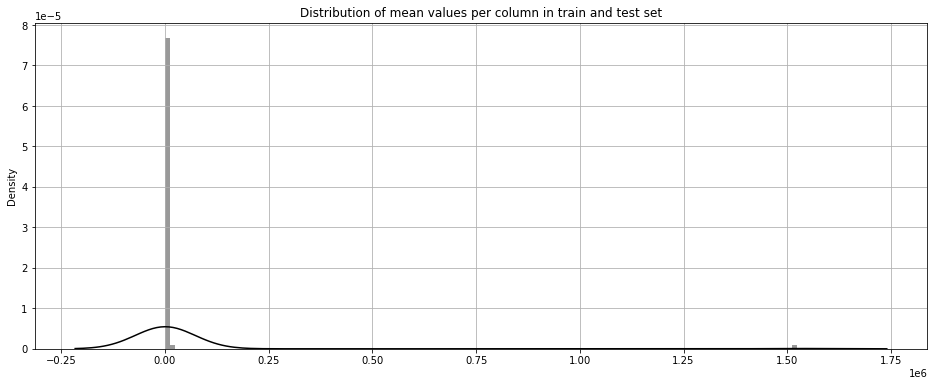

In [46]:
plt.figure(figsize=(16,6))
plt.title("Distribution of mean values per column in train and test set")
sns.distplot(df_abt[features_numericas_relevantes].mean(axis=0), color="black",kde=True,bins=120, label='train')
#sns.distplot(test[features].mean(axis=0), color="olive",kde=True,bins=120, label='test')
#plt.legend()
plt.grid()

In [ ]:
# boxcox/yeojohnson transformation to remove skewness
for col in skwdlist:
    if df[col].min() > 0:
        df[col], lam = stats.boxcox(df[col])
        print(col, ' skew after boxcox:', df[col].skew())
    else:
        df[col], lam = stats.yeojohnson(df[col])
        print(col, ' skew after yeojohnson:', df[col].skew())


In [ ]:
(stat, p_value) = stats.spearmanr(df_normal['Mileage'],df_normal['Price'])

print("The correlation coefficient is: ", '{:.2f}'.format(stat))
print("The p-value is:",'{:.5f}'.format(p_value))

if p_value > 0.05:
    print('The two variables are likely independent')
else:
    print('The two variables are likely dependent')
    
    
 The correlation coefficient is:  -0.55
The p-value is: 0.00000
The two variables are likely dependent   

In [45]:
def multivariate_analysis(cat_var_1, target_variable=df_abt.plano_valor):
    plt.style.use('seaborn')
    fig,ax = plt.subplots(1,1,figsize = (18,5))
    font_size = 15
    cat_grouped_by_cat_target = pd.crosstab(index = [cat_var_1],
                                        columns = target_variable, normalize = "index")*100                            
    #cat_grouped_by_cat_target.rename({"Yes":"% Churn", "No":"% Not Churn"}, axis = 1, inplace = True)
    cat_grouped_by_cat_target.plot.bar(color = ["green", "red","blue"],ax=ax)
    #ax.set_xlabel(f"{cat_var_1.name}, {cat_var_2.name}, {cat_var_3.name}", fontsize = font_size)
    ax.set_xlabel(f"{cat_var_1.name}", fontsize = font_size)
    ax.set_ylabel("Frequencia Relativa(%)", fontsize = font_size)
    ax.tick_params(axis="x", labelsize=font_size)
    ax.tick_params(axis="y", labelsize=font_size)
    plt.legend(loc = "best")
    return plt.show()

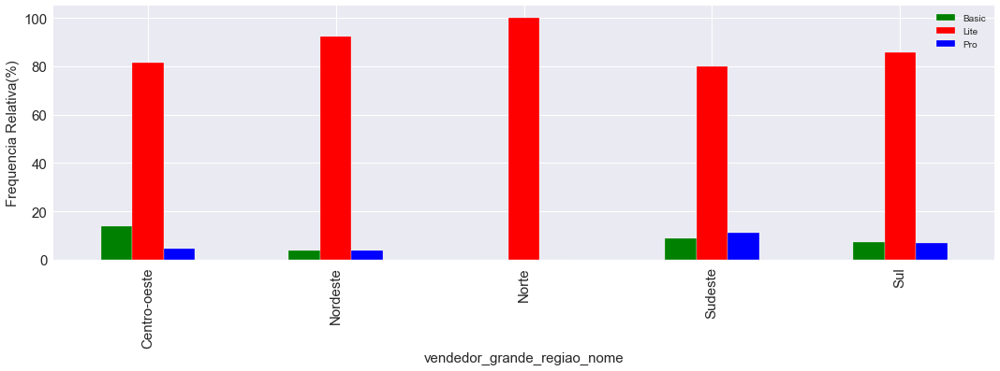

In [46]:
multivariate_analysis(df_abt.vendedor_grande_regiao_nome,df_abt.plano)


In [41]:
def mostra_grafico_barras(p_df_feature):
    sns.set_theme(style="whitegrid")
    fig = plt.figure(figsize=(18,4))
    plt.title('Gráfico de barras de {}'.format(p_df_feature.name))
    df_series = p_df_feature.value_counts().head(10)
    print(p_df_feature.value_counts(normalize=True).head(10))
    if(p_df_feature.dtype != object):
      sns.barplot(x=df_series.index,y=df_series.values)
    else:
      sns.barplot(x=df_series.values,y=df_series.index)
    plt.xticks(rotation=90)
    plt.show()

In [38]:
df_abt['PIB_percapita_(11000,19000]'].value_counts()

0      918
1      306
2      122
3       64
4       44
5       27
7       27
6       25
8       23
9       14
11      12
16      10
10       8
15       8
12       6
18       5
22       4
19       3
23       3
21       2
26       2
29       2
40       2
17       1
38       1
114      1
81       1
69       1
64       1
62       1
54       1
48       1
42       1
34       1
37       1
36       1
14       1
33       1
32       1
31       1
27       1
13       1
20       1
124      1
Name: PIB_percapita_(11000,19000], dtype: int64

In [44]:
df_abt[df_abt['PIB_percapita_(11000,19000]']==0]

,vendedor_id,vendedor_cidade,vendedor_estado,vendedor_cidade_id,vendedor_estado_id,vendedor_grande_regiao_id,vendedor_grande_regiao_nome,review_score_moda,plano,plano_valor,plano_comissao,valor_taxa,valor_comissao,custo_frete,distancia_cliente_vendedor_mediana,qtd_clientes,qtd_clientes_repete,qtd_itens_pedido_mediana,preco,frete_valor,preco_frete,qtd_pedidos,qtd_produtos,produto_peso_g_mediana,produto_volume_cm3_mediana,densidade_produto_mediana,produto_categoria_nome_moda,produto_categoria_id_moda,Area(km2)_mediana,populacao_mediana,habit_km2_mediana,tempo_entrega_compra_mediana,tempo_aprovado_compra_mediana,tempo_estimado_compra_mediana,tempo_postagem_compra_mediana,tempo_entrega_aprovado_LeadTime_mediana,tempo_postagem_aprovado_mediana,tempo_entrega_postagem_mediana,postagem_limiteparceiro_variacao_mediana,postagem_limiteparceiro_dias_atraso_mediana,postagem_limiteparceiro_atrasado_moda,entrega_estimado_variacao_mediana,entrega_estimado_dias_atraso_mediana,entrega_estimado_atrasado_moda,qtd_pedidos_Nacional_Estadual_Comemorativa,qtd_clientes_capital,qtd_clientes_fora_estado,"PIB_percapita_(11000,19000]","PIB_percapita_(19000,27000]","PIB_percapita_(27000,35000]","PIB_percapita_(3285,11000]","PIB_percapita_(35000,43000]","PIB_percapita_(43000,51000]","PIB_percapita_(51000,344847]",pagamento_tipo_boleto,pagamento_tipo_cartao_credito,pagamento_tipo_cartao_debito,pagamento_tipo_voucher,pagamento_parcelas_boleto,pagamento_parcelas_cartao_credito,pagamento_parcelas_cartao_debito,pagamento_parcelas_voucher,pagamento_sequencia_boleto,pagamento_sequencia_cartao_credito,pagamento_sequencia_cartao_debito,pagamento_sequencia_voucher,pagamento_valor_boleto,pagamento_valor_cartao_credito,pagamento_valor_cartao_debito,pagamento_valor_voucher,custo_reviews,meses_olist,dias_olist,qtd_pedidos_pontos,preco_pontos,review_score_pontos,tempo_postagem_compra_pontos,vendedor_pontuacao,vendedor_score,receitas,adm_custos,lucro,velocidade_km_dias,pedidos_por_dia_media,dias_entre_pedidos,vlr_medio_pedido,razao_frete_preco,razao_frete_pedidos
3,003554e2dce176b5555353e4f3555ac8,goiania,GO,5208707,52,5,Centro-oeste,5,Lite,18.99,0.21,0,25.20,9.69,936.3580,1,1,1,120.00,19.38,139.38,1,1,1200.0,21000.0,0.06,Outros,0,1200.1770,6.520266e+06,5432.750,4,0,30,0,4,0,4,-6,0,0,-27,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,3,0,0,0,1,0,0,0.00,139.38,0.0,0.0,0,1,1,1,1,2,4,1124,8,44.19,133.18,-98.68,234.09,1.000000,1,139.38,0.16,19.38
7,010543a62bd80aa422851e79a3bc7540,sao paulo,SP,3550308,35,3,Sudeste,4,Lite,18.99,0.21,0,297.36,15.98,220.4765,2,2,1,1416.00,31.95,1447.95,2,2,2900.0,5940.0,0.49,informatica_tablets,20,997.3740,3.851347e+06,3460.445,8,0,16,3,8,2,5,-3,0,0,-8,0,0,0,1,1,0,0,0,0,0,1,1,0,2,0,0,0,13,0,0,0,2,0,0,0.00,1447.95,0.0,0.0,5,1,28,1,3,1,2,1312,7,316.35,188.35,107.02,25.94,0.071429,14,723.98,0.02,15.98
10,014d9a685fd57276679edd00e07089e5,maringa,PR,4115200,41,4,Sul,1,Lite,18.99,0.21,5,14.70,0.00,555.2040,1,1,1,69.99,2.66,72.65,1,1,113.0,2992.0,0.04,cool_stuff,12,318.6750,1.349113e+06,4233.510,6,1,19,2,4,0,3,-6,0,0,-14,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,133.37,0.00,0.0,0.0,40,1,1,1,1,1,3,1113,6,38.69,133.18,-134.49,138.80,1.000000,1,72.65,0.04,2.66
11,0176f73cc1195f367f7b32db1e5b3aa8,ibitinga,SP,3519600,35,3,Sudeste,3,Lite,18.99,0.21,0,117.54,73.24,550.4920,3,3,1,559.70,146.46,706.16,3,3,8917.0,48600.0,0.18,cama_mesa_banho,7,331.4010,2.523794e+06,1778.950,14,0,20,3,14,3,13,-2,0,0,-7,0,0,0,2,1,0,0,0,0,1,1,1,0,3,0,0,0,17,0,0,0,3,0,0,0.00,706.16,0.0,0.0,20,1,14,2,2,1,2,2212,7,136.53,230.68,-187.39,39.32,0.214286,5,235.39,0.26,48.82
15,01ed254b9ff8407dfb9d99ba1e17d923,mogi das cruzes,SP,3530607,35,3,Sudeste,5,Lite,18.99,0.21,0,307.86,33.85,268.0620,5,5,1,1465.99,67.72,1533.71,5,5,363.0,3042.0,0.12,moda_beleza_perfumaria,25,791.1440,2.982350e+05,376.970,5,0,20,0,5,0,3,-11,0,0,-16,0,0,0,1,3,0,1,1,0,1,0,2,0,5,0,0,0,24,0,0,0,5,0,0,0.00,1533.71,0.0,0.0,0,3,96,2,3,2,4,2324,11,364.83,297.81,33.17,53.61,0.052083,20,306.74,0.05,13.54
...,...,...,...,...,...,...,..

In [42]:
mostra_grafico_barras(df_abt[df_abt['PIB_percapita_(11000,19000]']>0])

AttributeError: 'DataFrame' object has no attribute 'name'

<Figure size 1296x288 with 0 Axes>

5    0.742461
4    0.118215
1    0.083233
3    0.041616
2    0.014475
Name: review_score, dtype: float64


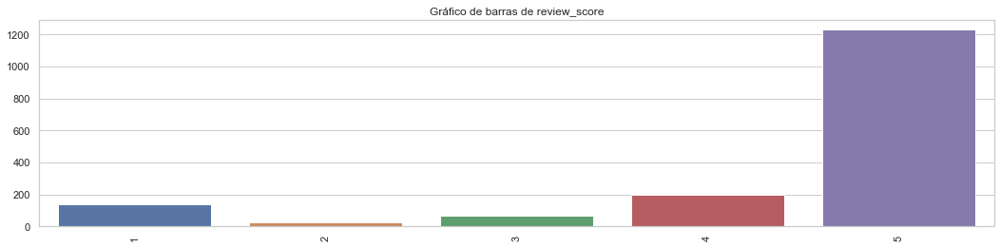

In [38]:
mostra_grafico_barras(df_abt['review_score'])

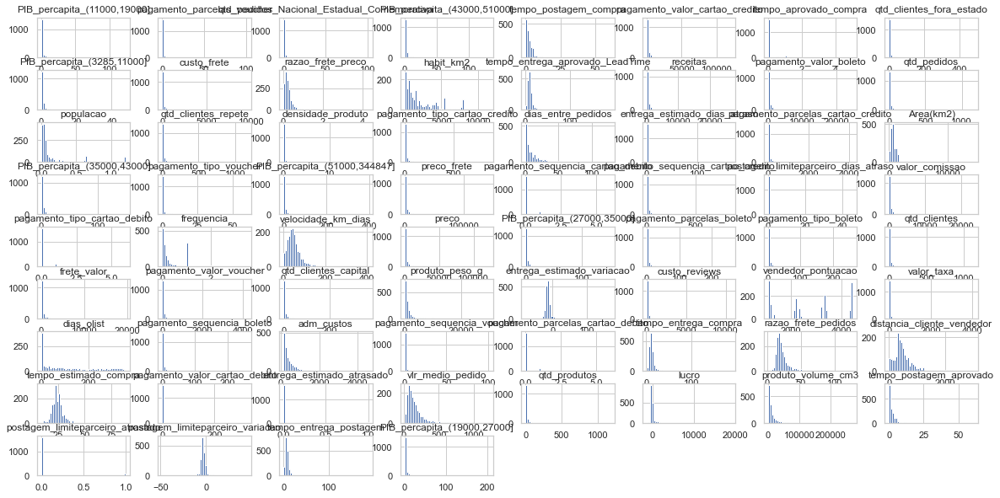

In [55]:
df_abt[features_].hist(figsize=(20,10),bins=50);

In [ ]:
var = country_df.select_dtypes(exclude='object').columns
col = 3
row = len(var)/col+1

plt.figure(figsize=(12,12))
for i in enumerate(var):
    plt.subplot(row,col,i[0]+1)
    sns.distplot(country_df[i[1]])
    plt.tight_layout(pad = 2)
plt.show()

15


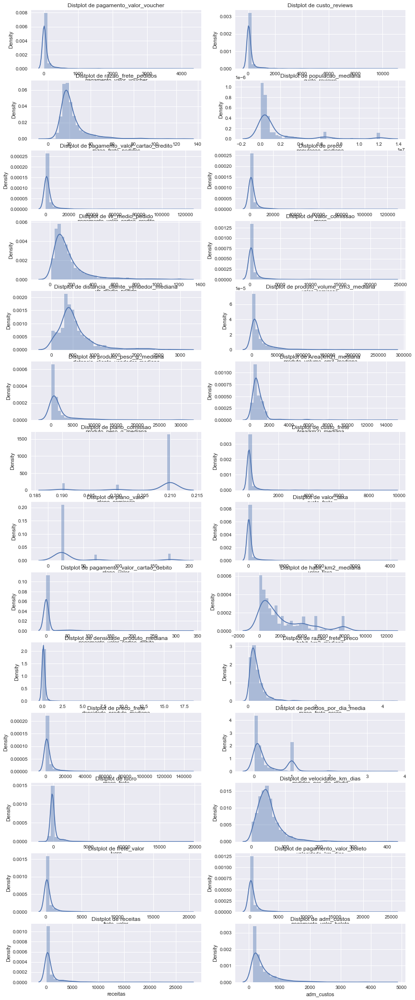

In [33]:
plt.style.use('seaborn')
plt.figure(1, figsize=(14,40))
elementos=len(df_abt[features_con].columns)
n=1
col=2
row=np.int(elementos/col+1)
print(row)
for x in features_con:
  plt.subplot(row, col, n)
  n += 1
  plt.subplots_adjust(hspace=0.2, wspace=0.2)
  sns.distplot(df_abt[x], bins = 40,kde=True,hist_kws={"density": True})
  #sns.distplot(df_abt[x], bins = 40,kde=True,hist_kws=dict(edgecolor='k', linewidth=0.5))  
  #sns.distplot(pop_normal, bins=20, hist_kws={"density": True}, ax=ax[0])  
  plt.title('Distplot de {}'.format(x))
plt.show()


In [32]:
features_1=features_

In [34]:
features_1=['receitas',
 'PIB_percapita_(43000,51000]',
 'pagamento_valor_boleto',
 'pagamento_tipo_cartao_credito',
 'tempo_estimado_compra',
 'pagamento_sequencia_boleto',
 'densidade_produto',
 'frete_valor',
 'qtd_clientes_capital',
 'dias_olist']

6


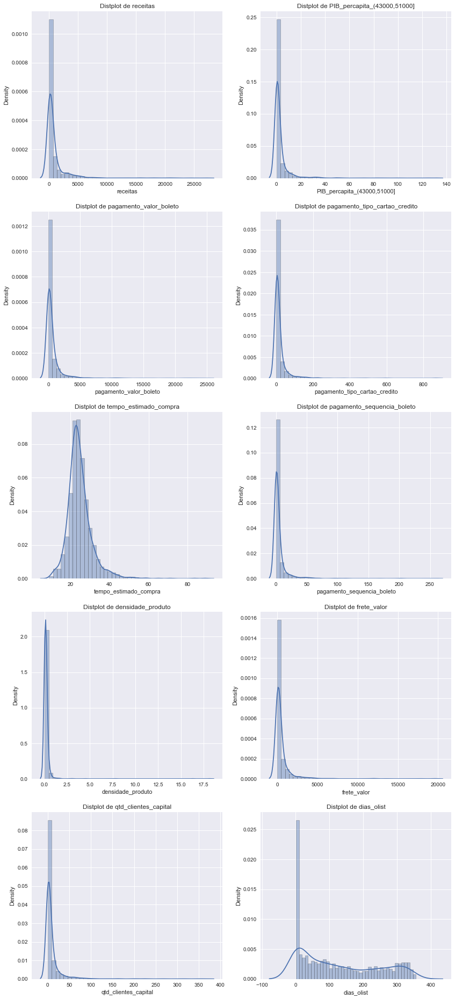

In [46]:
plt.style.use('seaborn')
plt.figure(1, figsize=(14,40))
elementos=len(df_abt[features_1].columns)
n=1
col=2
row=np.int(elementos/col+1)
print(row)
for x in features_1:
  plt.subplot(row, col, n)
  n += 1
  plt.subplots_adjust(hspace=0.2, wspace=0.2)
  sns.distplot(df_abt[x], bins = 40,kde=True,hist_kws=dict(edgecolor='k', linewidth=0.5))
  plt.title('Distplot de {}'.format(x))
plt.show()


In [106]:
plt.style.use('ggplot')
fig, ax= plt.subplots(34,2, figsize=(70,370))
i=j=0
for feature in features_:
    if i > 1:
        i=0
        j+=1
    #for i in range(0,3):
    #sns.distplot(df_abt[feature],ax=ax[j][i])
    plt.subplots_adjust(hspace=0.5, wspace=0.5)
    sns.distplot(df_abt[feature],fit=norm,kde=False, ax=ax[j][i])
    plt.title("Distribution of credit limit", fontsize=20)
    plt.xlabel("Limit on credit card", fontsize=15)
    plt.ylabel("")

    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)

    #plot00=sns.distplot(df_abt[feature],ax=ax[0],color='m')
    #ax[0].set_title('Distribution of BloodPressure',fontdict={'fontsize':8})
    #ax[0].set_xlabel('BloodPressure Class',fontdict={'fontsize':7})
    #ax[0].set_ylabel('Frequency/Distrubtion',fontdict={'fontsize':7})

    i +=1  
    
 

<AxesSubplot:xlabel='qtd_pedidos', ylabel='Density'>

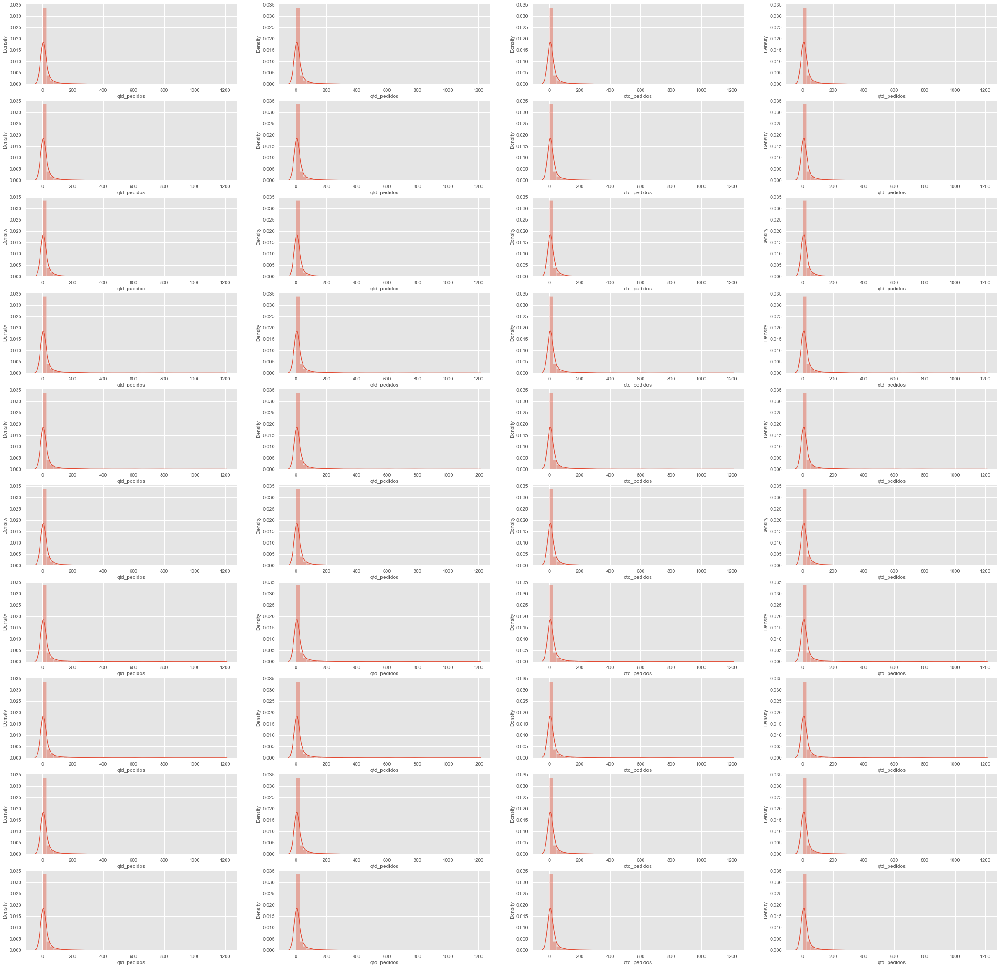

In [78]:
plt.style.use('ggplot')
fig, ax= plt.subplots(10,4, figsize=(40,40))

sns.distplot(df_abt['qtd_pedidos'],ax=ax[0][0])
sns.distplot(df_abt['qtd_pedidos'], ax=ax[0][1])
sns.distplot(df_abt['qtd_pedidos'], ax=ax[0][2])
sns.distplot(df_abt['qtd_pedidos'], ax=ax[0][3])
sns.distplot(df_abt['qtd_pedidos'],ax=ax[1][0])
sns.distplot(df_abt['qtd_pedidos'], ax=ax[1][1])
sns.distplot(df_abt['qtd_pedidos'], ax=ax[1][2])
sns.distplot(df_abt['qtd_pedidos'], ax=ax[1][3])
sns.distplot(df_abt['qtd_pedidos'],ax=ax[2][0])
sns.distplot(df_abt['qtd_pedidos'], ax=ax[2][1])
sns.distplot(df_abt['qtd_pedidos'], ax=ax[2][2])
sns.distplot(df_abt['qtd_pedidos'], ax=ax[2][3])
sns.distplot(df_abt['qtd_pedidos'],ax=ax[3][0])
sns.distplot(df_abt['qtd_pedidos'], ax=ax[3][1])
sns.distplot(df_abt['qtd_pedidos'], ax=ax[3][2])
sns.distplot(df_abt['qtd_pedidos'], ax=ax[3][3])
sns.distplot(df_abt['qtd_pedidos'],ax=ax[4][0])
sns.distplot(df_abt['qtd_pedidos'], ax=ax[4][1])
sns.distplot(df_abt['qtd_pedidos'], ax=ax[4][2])
sns.distplot(df_abt['qtd_pedidos'], ax=ax[4][3])

sns.distplot(df_abt['qtd_pedidos'],ax=ax[5][0])
sns.distplot(df_abt['qtd_pedidos'], ax=ax[5][1])
sns.distplot(df_abt['qtd_pedidos'], ax=ax[5][2])
sns.distplot(df_abt['qtd_pedidos'], ax=ax[5][3])
sns.distplot(df_abt['qtd_pedidos'],ax=ax[6][0])
sns.distplot(df_abt['qtd_pedidos'], ax=ax[6][1])
sns.distplot(df_abt['qtd_pedidos'], ax=ax[6][2])
sns.distplot(df_abt['qtd_pedidos'], ax=ax[6][3])
sns.distplot(df_abt['qtd_pedidos'],ax=ax[7][0])                                          
sns.distplot(df_abt['qtd_pedidos'],ax=ax[7][1])
sns.distplot(df_abt['qtd_pedidos'], ax=ax[7][2])
sns.distplot(df_abt['qtd_pedidos'], ax=ax[7][3])
sns.distplot(df_abt['qtd_pedidos'],ax=ax[8][0])
sns.distplot(df_abt['qtd_pedidos'], ax=ax[8][1])
sns.distplot(df_abt['qtd_pedidos'], ax=ax[8][2])
sns.distplot(df_abt['qtd_pedidos'], ax=ax[8][3])
sns.distplot(df_abt['qtd_pedidos'],ax=ax[9][0])
sns.distplot(df_abt['qtd_pedidos'], ax=ax[9][1])
sns.distplot(df_abt['qtd_pedidos'], ax=ax[9][2])
sns.distplot(df_abt['qtd_pedidos'], ax=ax[9][3])


In [ ]:
fig, ax= plt.subplots(5,4, figsize=20,20))

sns.distplot(fundamentus['Cotação'],ax=ax[0][0])
sns.distplot(fundamentus['P/L'], ax=ax[0][1])
sns.distplot(fundamentus['P/VP'], ax=ax[0][2])
sns.distplot(fundamentus['PSR'], ax=ax[0][3])

sns.distplot(fundamentus['Div.Yield'],ax=ax[1][0])
sns.distplot(fundamentus['P/Ativo'], ax=ax[1][1])
sns.distplot(fundamentus['P/Cap.Giro'], ax=ax[1][2])
sns.distplot(fundamentus['P/EBIT'], ax=ax[1][3])

sns.distplot(fundamentus['P/Ativ Circ.Liq'],ax=ax[2][0])
sns.distplot(fundamentus['EV/EBIT'], ax=ax[2][1])
sns.distplot(fundamentus['EV/EBITDA'], ax=ax[2][2])
sns.distplot(fundamentus['Mrg Ebit'], ax=ax[2][3])

sns.distplot(fundamentus['Mrg. Líq.'],ax=ax[3][0])
sns.distplot(fundamentus['Liq. Corr.'], ax=ax[3][1])
sns.distplot(fundamentus['ROIC'], ax=ax[3][2])
sns.distplot(fundamentus['ROE'], ax=ax[3][3])

sns.distplot(fundamentus['Liq.2meses'],ax=ax[4][0])
sns.distplot(fundamentus['Patrim. Líq'], ax=ax[4][1])
sns.distplot(fundamentus['Dív.Brut/ Patrim.'], ax=ax[4][2])
sns.distplot(fundamentus['Cresc. Rec.5a'], ax=ax[4][3]);

In [ ]:
"""
olit 47
Para examinar quais combinações de recursos podem gerar mais agrupamento de qualidade, um método é realizar agrupamento 
com diferentes subconjuntos de recursos. O objetivo disso é maximizar o Silhoette Score e gerar clusters de alta qualidade 
e interpretáveis. Estarei usando o mesmo Elbow Method e Silhoette Score para avaliar a qualidade dos clusters formados.
"""

In [ ]:
# Box plot
var = country_df.select_dtypes(exclude='object').columns
col = 3
row = len(var)/col+1

plt.figure(figsize=(12,12))
for i in enumerate(var):
    plt.subplot(row,col,i[0]+1)
    sns.boxplot(country_df[i[1]],color="orange")
    plt.tight_layout(pad = 2)
plt.show()

In [31]:
var=10
col = 3
row = np.int(10/col+1)
print(row)

4


In [ ]:
#bivariado
# pairplot for continuous data type
sns.pairplot(country_df.select_dtypes(['int64','float64']), diag_kind='kde', corner=True)
plt.show()
.corr()

In [ ]:
"""
Estatistica Hopkins
Antes de aplicarmos qualquer algoritmo de agrupamento aos dados fornecidos, é importante verificar se os dados fornecidos 
possuem alguns agrupamentos significativos ou não. o que em geral significa que os dados fornecidos não são aleatórios. 
O processo de avaliar os dados para verificar se os dados são viáveis para agrupamento ou não é conhecido como tendência
de agrupamento. Para verificar a tendência do cluster, usamos o teste de Hopkins. O teste de Hopkins examina se os pontos
de dados diferem significativamente dos dados distribuídos uniformemente no espaço multidimensional.

If the value is between {0.01, ...,0.3}, the data is regularly spaced.
If the value is around 0.5, it is random.
If the value is between {0.7, ..., 0.99}, it has a high tendency to cluster.
"""

In [ ]:
def hopkins(X):
    d = X.shape[1]
    #d = len(vars) # columns
    n = len(X) # rows
    m = int(0.1 * n) 
    nbrs = NearestNeighbors(n_neighbors=1).fit(X.values)
 
    rand_X = sample(range(0, n, 1), m)
 
    ujd = []
    wjd = []
    for j in range(0, m):
        u_dist, _ = nbrs.kneighbors(uniform(np.amin(X,axis=0),np.amax(X,axis=0),d).reshape(1, -1), 2, return_distance=True)
        ujd.append(u_dist[0][1])
        w_dist, _ = nbrs.kneighbors(X.iloc[rand_X[j]].values.reshape(1, -1), 2, return_distance=True)
        wjd.append(w_dist[0][1])
 
    H = sum(ujd) / (sum(ujd) + sum(wjd))
    if isnan(H):
        print(ujd, wjd)
        H = 0
 
    return H
print('Hopkins statistics is: ', round(hopkins(df_scaled),2))

In [ ]:
# upper caping to 0.99 percentile
cap = 0.99
for col in cols:
    HL = round(df[col].quantile(cap),2)
    df[col] = df[col].apply(lambda x: HL if x>HL else x)

In [ ]:
"""
Feature Scaling
Sua gama de todos os recursos são diferentes o que indica a necessidade de padronizar os dados antes de construir o modelo.
Como precisamos calcular a distância euclidiana entre os pontos de dados, é importante garantir que os atributos com um 
intervalo maior de valores não superem os atributos com intervalo menor. Assim, a redução de todos os atributos para a
mesma escala normal é importante aqui.
# Creating scaler object
scaler = MinMaxScaler()

# fit transform
df_scaled = scaler.fit_transform(df)
df_scaled
"""

In [ ]:
#from sklearn.preprocessing import normalize
#from sklearn import preprocessing
#import pandas as pd
#housing = pd.read_csv("/content/sample_data/california_housing_train.csv")
#d = preprocessing.normalize(housing, axis=0)
#scaled_df = pd.DataFrame(d, columns=names)
#scaled_df.head()

In [ ]:
"""
A normalização é uma técnica de escalonamento em que os valores são deslocados e redimensionados para que fiquem entre 0 e 1.
Também é conhecido como escalonamento Min-Max.
Aqui está a fórmula para normalização:

Equação de normalização

"""

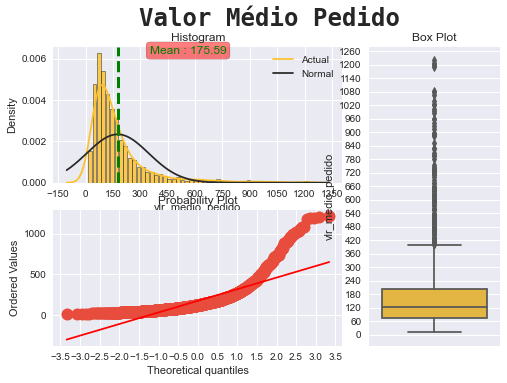

In [52]:
import matplotlib.gridspec as gridspec
from matplotlib.ticker import MaxNLocator
plot_dist3(df_abt, 'vlr_medio_pedido', 'Valor Médio Pedido')

In [50]:
#https://www.kaggle.com/seholeee/eda-practice
def plot_dist3(df, feature, title):
    cust_color = ['#fdc029',
             '#f7c14c',
             '#f0c268',
             '#dfc498',
             '#d4c5af',
             '#c6c6c6',
             '#a6a6a8',
             '#86868a',
             '#68686d',
             '#4b4c52',
             '#303138',
             '#171820',
             ]
    
    fig = plt.figure(constrained_layout = True)
    grid = gridspec.GridSpec(ncols = 3, nrows = 2, figure = fig)
    
    ax1 = fig.add_subplot(grid[0, :2])
    
    ax1.set_title('Histogram')
    
    sns.distplot(df.loc[:, feature],
                hist = True,
                kde = True,
                fit = norm,
                hist_kws = {
                    'rwidth' : 0.85,
                    'edgecolor' : 'black',
                    'linewidth' : .5,
                    'alpha' : 0.8},
                 ax = ax1,
                 color = cust_color[0]
                )
    
    ax1.axvline(df.loc[:, feature].mean(), color = 'Green', linestyle = 'dashed', linewidth = 3)
    
    min_ylim, max_ylim = plt.ylim()
    ax1.text(df.loc[:, feature].mean() * 2, max_ylim * 0.95, 'Mean : {:.2f}'.format(df.loc[:, feature].mean()), color = 'Green', fontsize = '12',
            bbox = dict(boxstyle = 'round', facecolor = 'red', alpha = 0.5))
    ax1.legend(labels = ['Actual', 'Normal'])
    ax1.xaxis.set_major_locator(MaxNLocator(nbins = 12))
    
    ax2 = fig.add_subplot(grid[1, :2])
    
    ax2.set_title('Probability Plot')
    
    stats.probplot(df.loc[:, feature],
                  plot = ax2)
    ax2.get_lines()[0].set_markerfacecolor('#e74c3c')
    ax2.get_lines()[0].set_markersize(12.0)
    ax2.xaxis.set_major_locator(MaxNLocator(nbins = 16))
    
    ax3 = fig.add_subplot(grid[:, 2])
    
    ax3.set_title('Box Plot')
    
    sns.boxplot(y = feature, data = df, ax = ax3, color = cust_color[0])
    ax3.yaxis.set_major_locator(MaxNLocator(nbins = 24))
    
    plt.suptitle(f'{title}', fontsize = 24, fontname = 'monospace', weight = 'bold')

In [71]:
a = ("John", "Charles", "Mike")
b = ("Jenny", "Christy", "Monica")

x = zip(a, b)
print(list(x))

[('John', 'Jenny'), ('Charles', 'Christy'), ('Mike', 'Monica')]


In [ ]:
plt.style.use('seaborn')
plt.figure(1, figsize=(14,40))
elementos=len(df_abt[features_1].columns)
n=1
col=2
row=np.int(elementos/col+1)
print(row)
for x in features_1:
  plt.subplot(row, col, n)
  n += 1
  plt.subplots_adjust(hspace=0.2, wspace=0.2)
  sns.distplot(df_abt[x], bins = 40,kde=True,hist_kws=dict(edgecolor='k', linewidth=0.5))
  plt.title('Distplot de {}'.format(x))
plt.show()


In [107]:
def feat_dist(df, cols, rows = 3, columns = 3, title = None):
    #plt.style.use('seaborn')
    cust_color = ['#fdc029',
            '#f7c14c',
            '#f0c268',
            '#dfc498',
            '#d4c5af',
            '#c6c6c6',
            '#a6a6a8',
            '#86868a',
            '#68686d',
            '#4b4c52',
            '#303138',
            '#171820',
            ]
    #fig, axes = plt.subplots(rows, columns, figsize = (30, 45), constrained_layout = True)
    fig, axes = plt.subplots(rows, columns, figsize = (30, 45))
    axes = axes.flatten()
    
    for i, j in zip(cols, axes):
        plt.subplots_adjust(hspace=0.5, wspace=0.2)
        sns.distplot(df[i],
                    ax = j,
                    fit = norm,
                    hist = False,
                    color = cust_color[3],
                    kde_kws = {'linewidth' : 3}
                    )
        #axes[0].set_xlabel(i,fontdict={'fontsize':17})
        #axes[0].set_ylabel('Frequency/Distrubtion',fontdict={'fontsize':17})
        
        (mu, sigma) = norm.fit(df[i])
        j.set_title('Dist. Normal {0} : $\mu=${1:.2g}, $\sigma=${2:.2f}'.format(i, mu, sigma),fontsize = 18, weight = 'bold')
        j.legend(labels = [f'{i}', 'Distribuição Normal'],fontsize=20)
        #fig.suptitle(f'{title}', fontsize = 15, weight = 'bold')

In [ ]:
fig,axes = plt.subplots(nrows=1,ncols=2,dpi=120,figsize = (8,4))

plot00=sns.distplot(df['BloodPressure'],ax=axes[0],color='m')
axes[0].set_title('Distribution of BloodPressure',fontdict={'fontsize':8})
axes[0].set_xlabel('BloodPressure Class',fontdict={'fontsize':7})
axes[0].set_ylabel('Frequency/Distrubtion',fontdict={'fontsize':7})
plt.tight_layout()


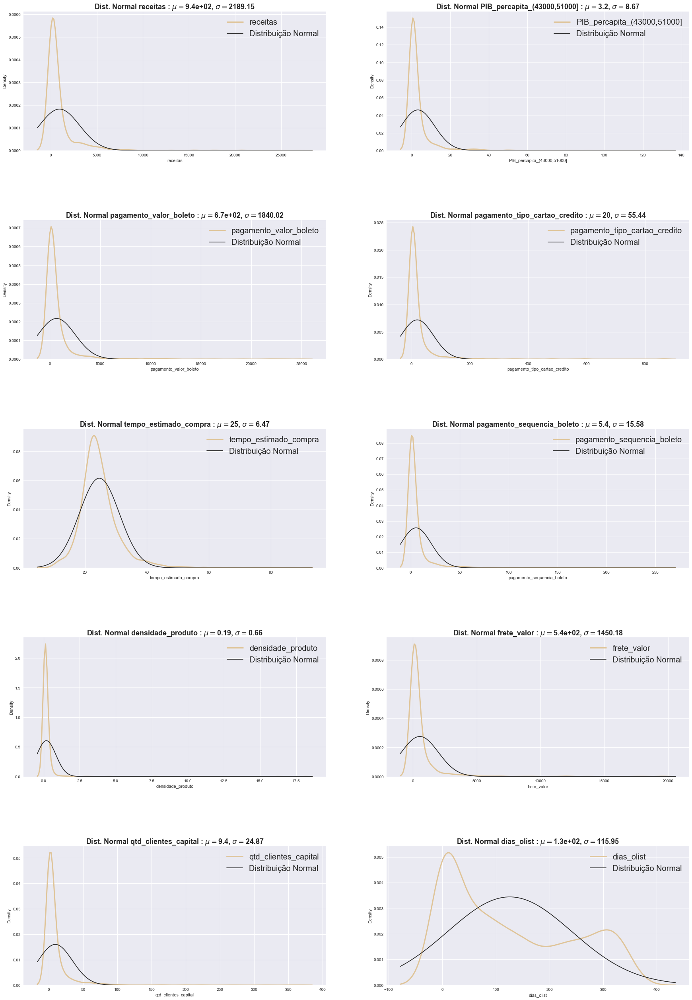

In [108]:
feat_dist(df_abt, df_abt[features_1].columns.tolist(), rows = 5, columns = 2, title = 'Distribution Of High Std Features')

In [58]:
df_abt[features_1].shape

(1658, 10)

In [173]:
def dist_box_violin(data):
    """ function plots a combined graph for univariate analysis of continous variable 
    to check spread, central tendency , dispersion and outliers  

    Args:
    data (data.series): the float/int columns you would like to check
    """
    plt.style.use('seaborn')
    Name = data.name.upper()
    fig, axes =plt.subplots(1,3,figsize=(16,6))
    fig.suptitle(f"SPREAD OF DATA FOR {Name}"  , fontsize=14, fontweight='bold')

    sns.distplot(data,kde=True,color='Blue',ax=axes[0])
    axes[0].axvline(data.mean(), color='y', linestyle='--',linewidth=2)
    axes[0].axvline(data.median(), color='r', linestyle='dashed', linewidth=2)
    axes[0].axvline(data.mode()[0],color='g',linestyle='solid',linewidth=2)
    axes[0].legend({'Mean':data.mean(),'Median':data.median(),'Mode':data.mode()})

    sns.boxplot(x=data,showmeans=True, orient='h',color="purple",ax=axes[1])

    sns.violinplot(data,ax=axes[2],showmeans=True)



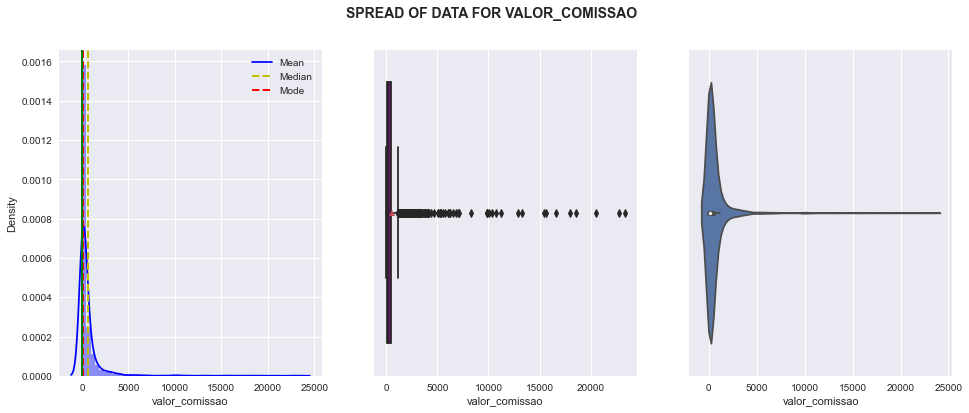

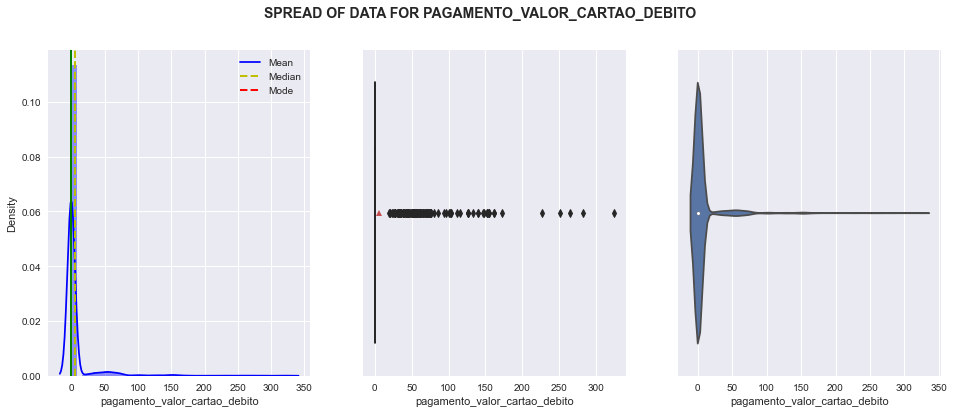

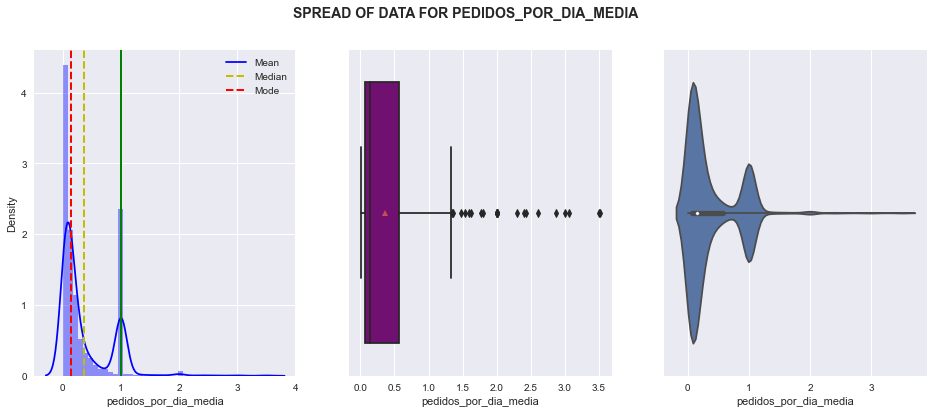

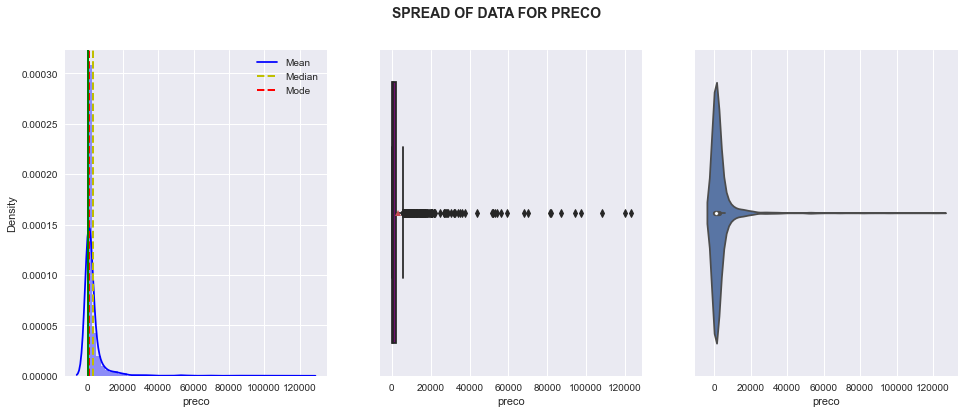

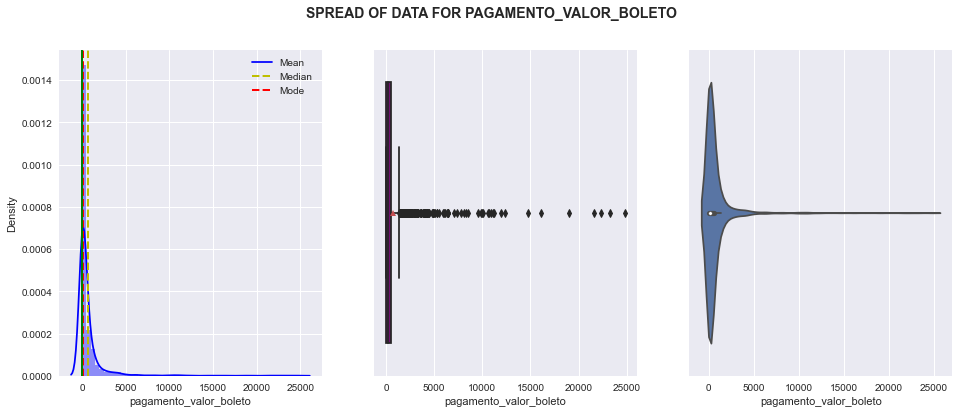

...

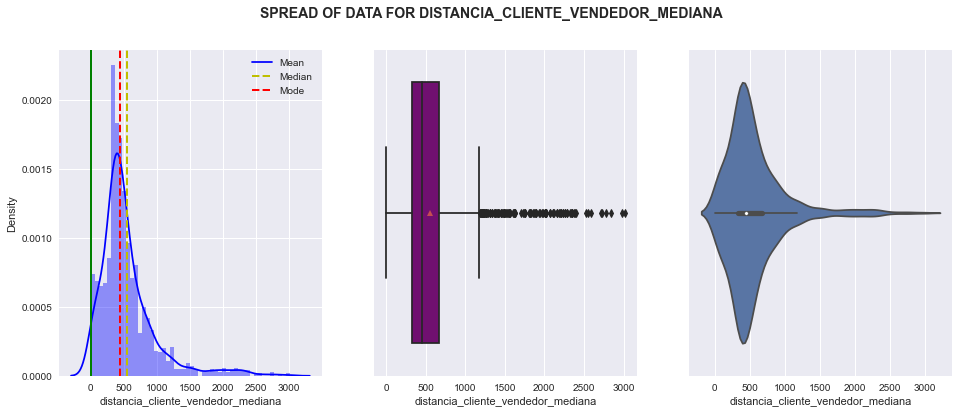

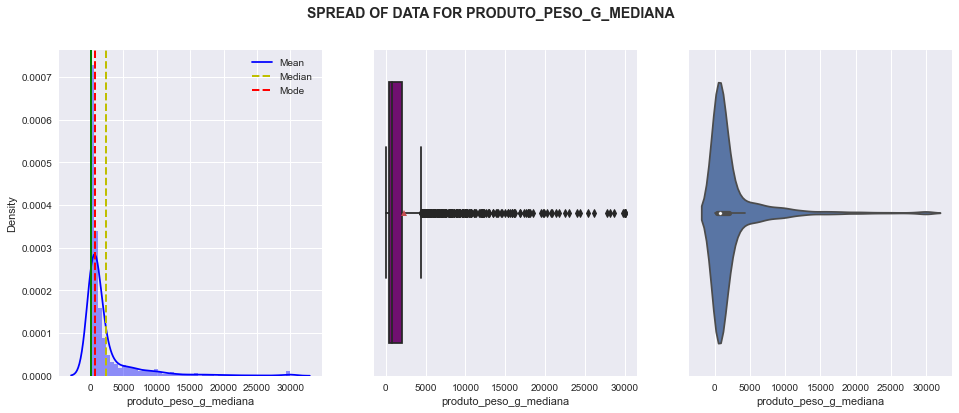

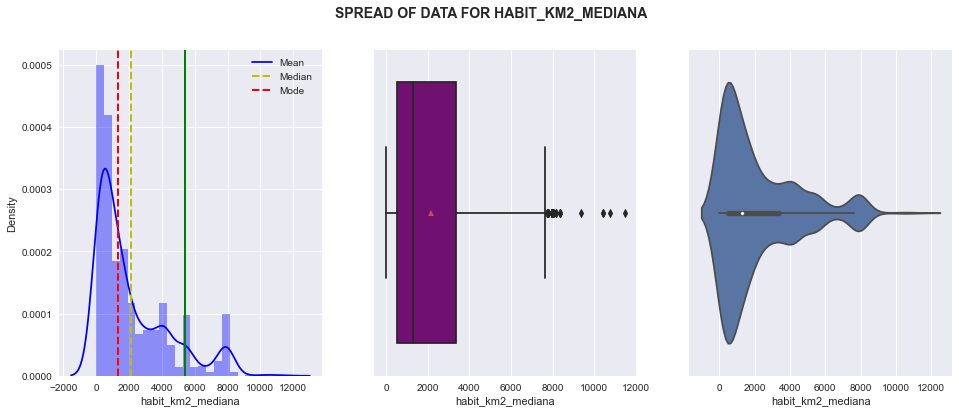

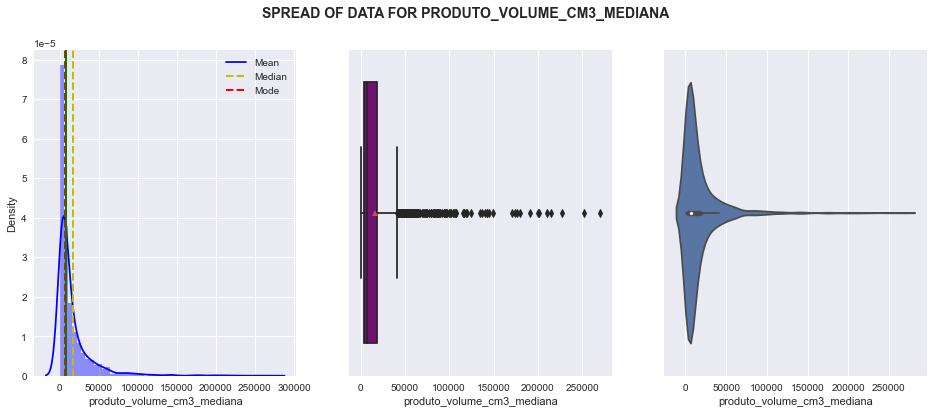

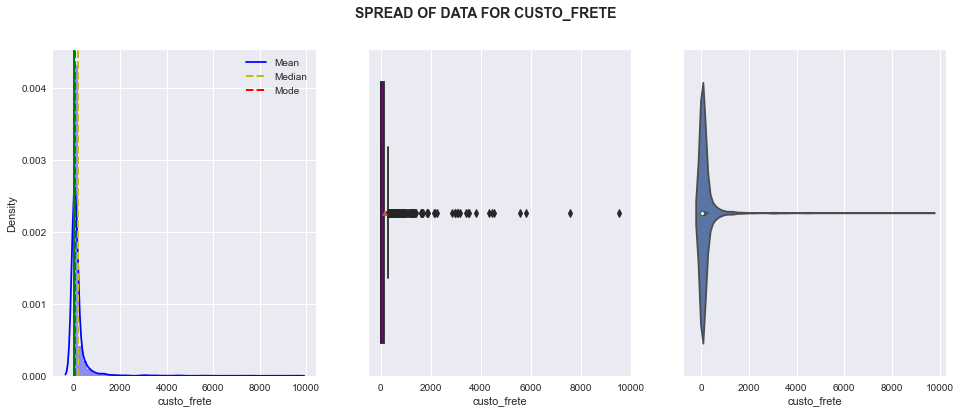

In [174]:
for i in features_con:
    
    dist_box_violin(df_abt[i])

In [18]:
df_abt[features_con].shape[1]

24

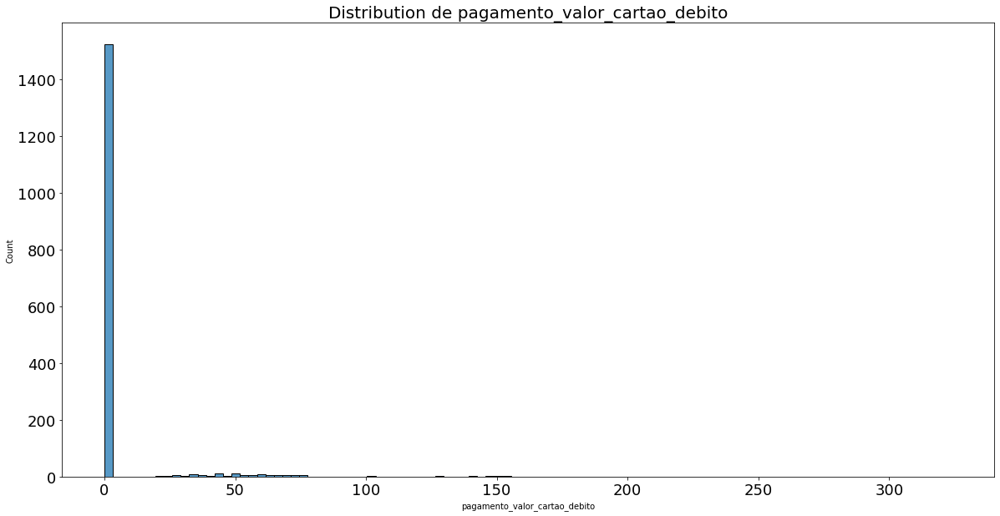

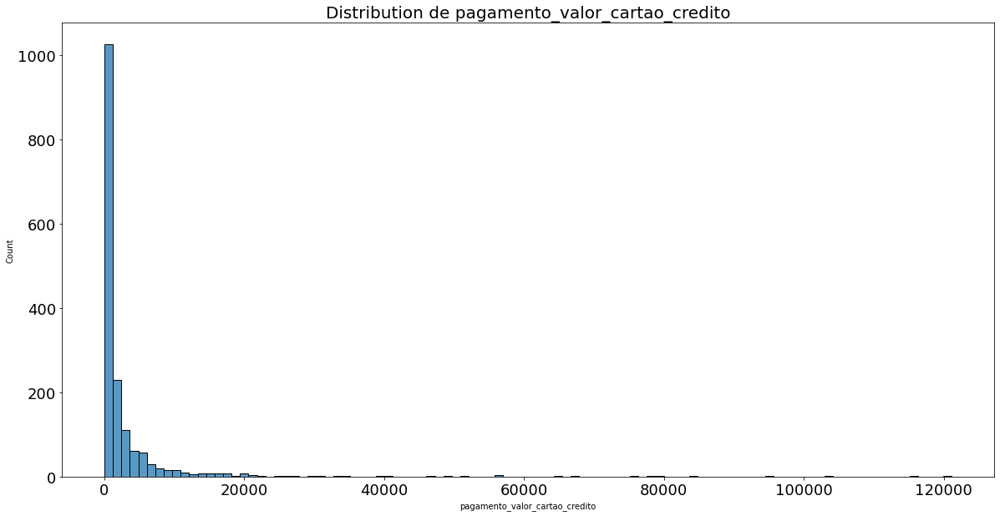

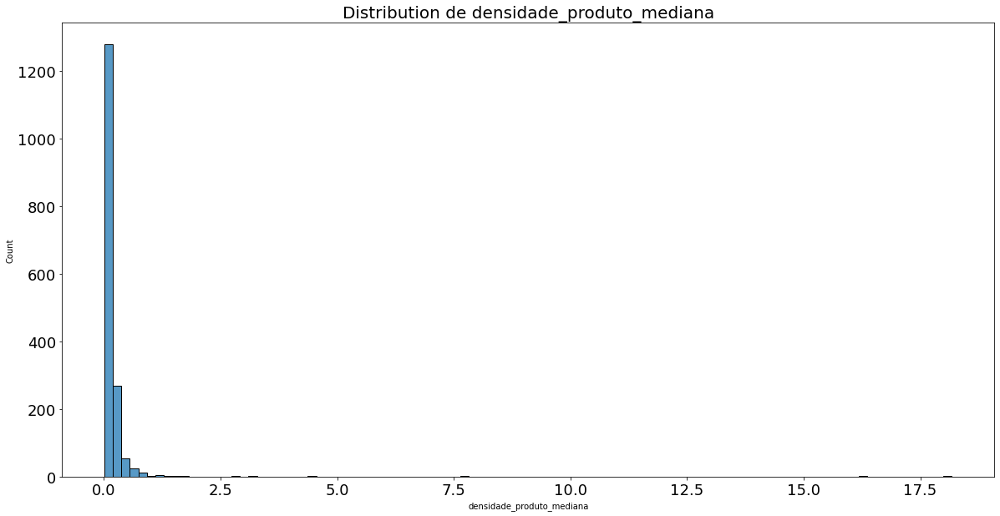

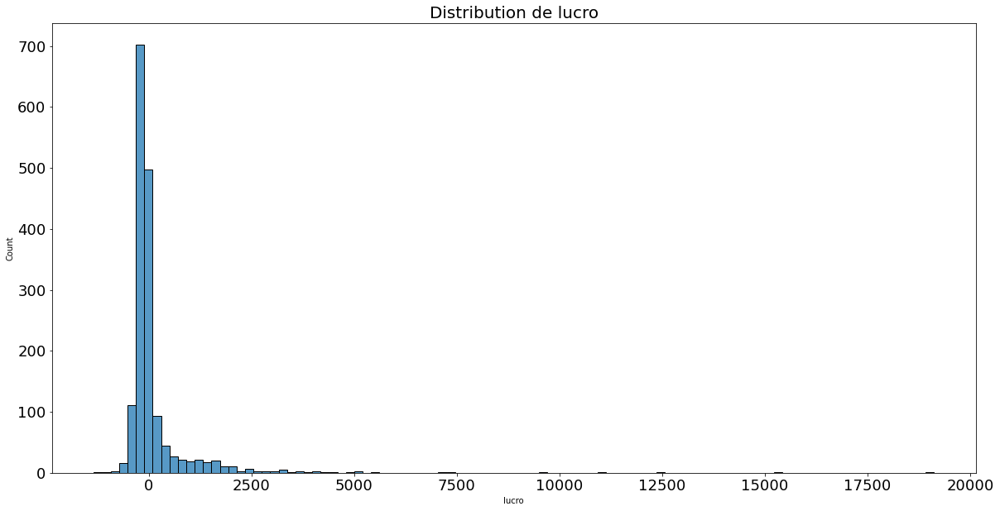

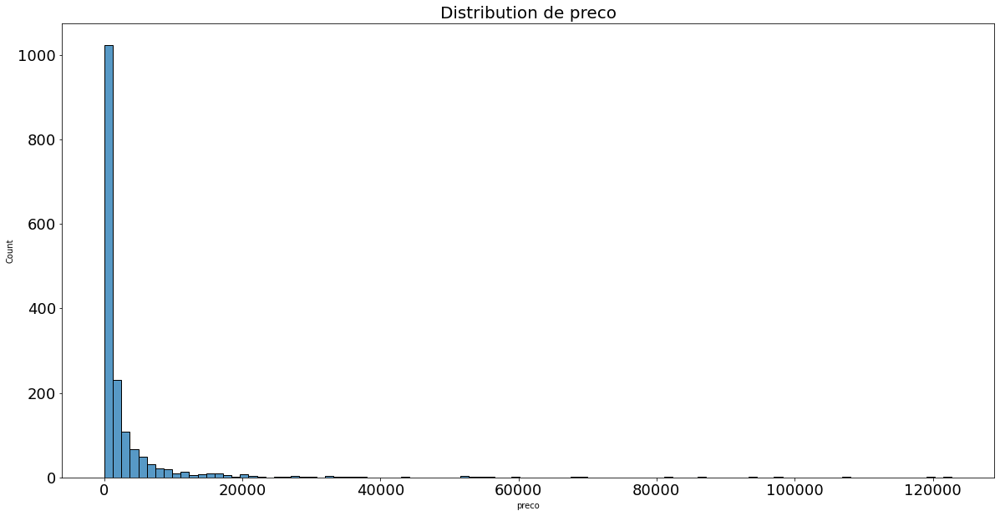

...

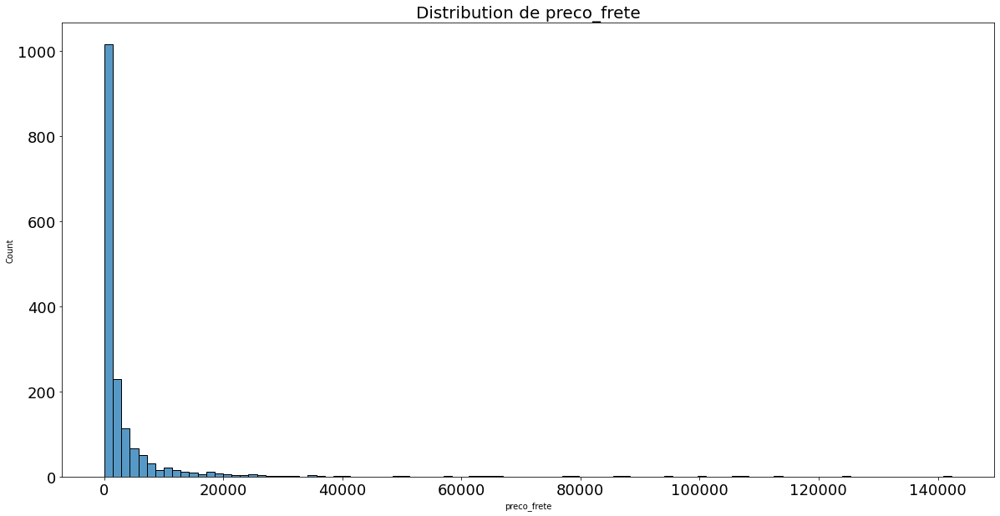

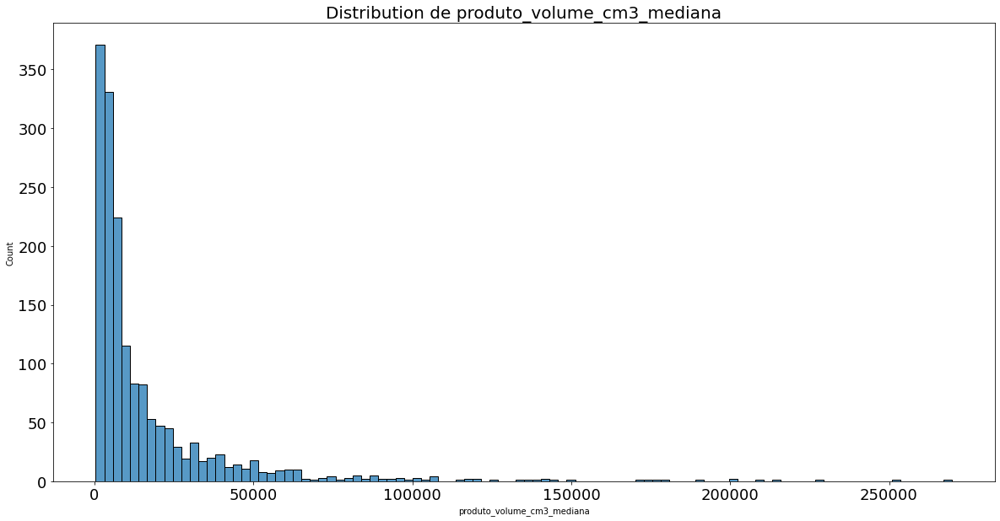

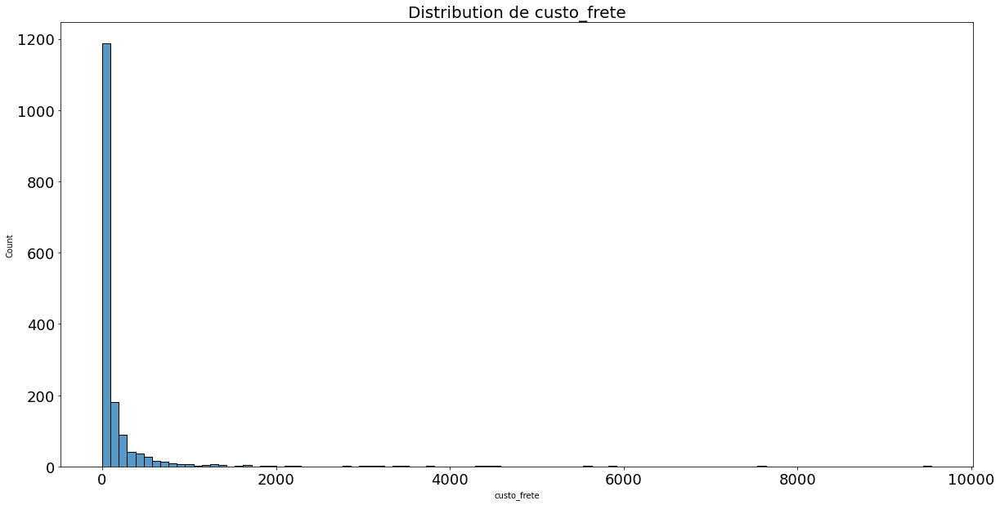

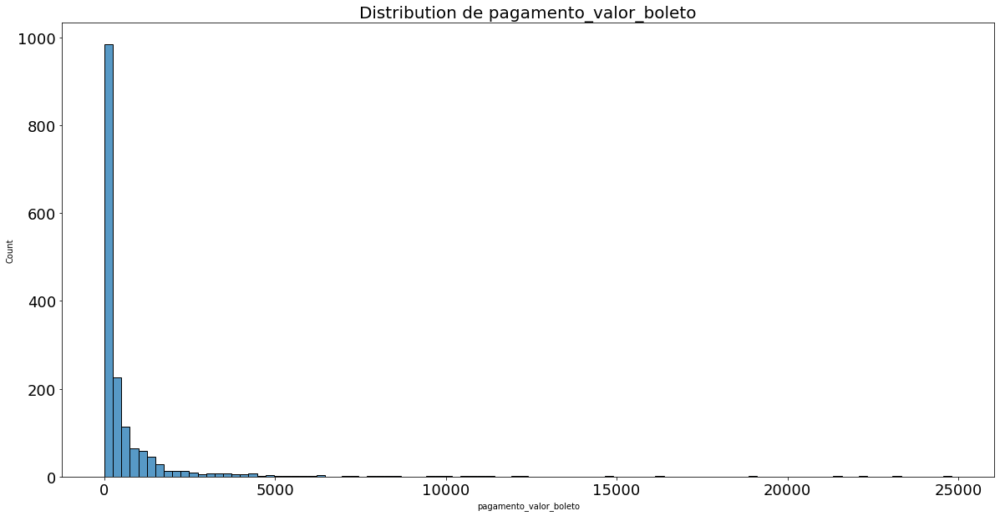

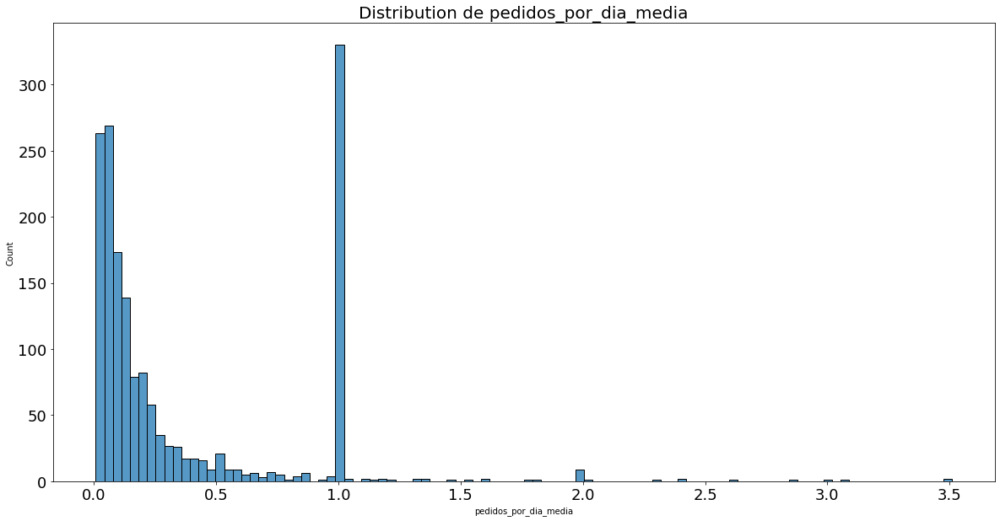

In [19]:
# Distribution des variables quantitatives

for n in range(df_abt[features_con].shape[1]):
    plt.figure(figsize=(20, 10))
    plot = sns.histplot(x=df_abt[features_con].iloc[:, n], bins=100)
    plt.title(f"Distribuição de {df_abt[features_con].iloc[:, n].name}",
              fontsize=20)
    plt.xticks(fontsize=18)
    plt.yticks(fontsize=18)
    #plt.savefig(f"{df_abt[features_con].iloc[:, n].name}_dist.png",
    #            bbox_inches='tight')
    plt.show()

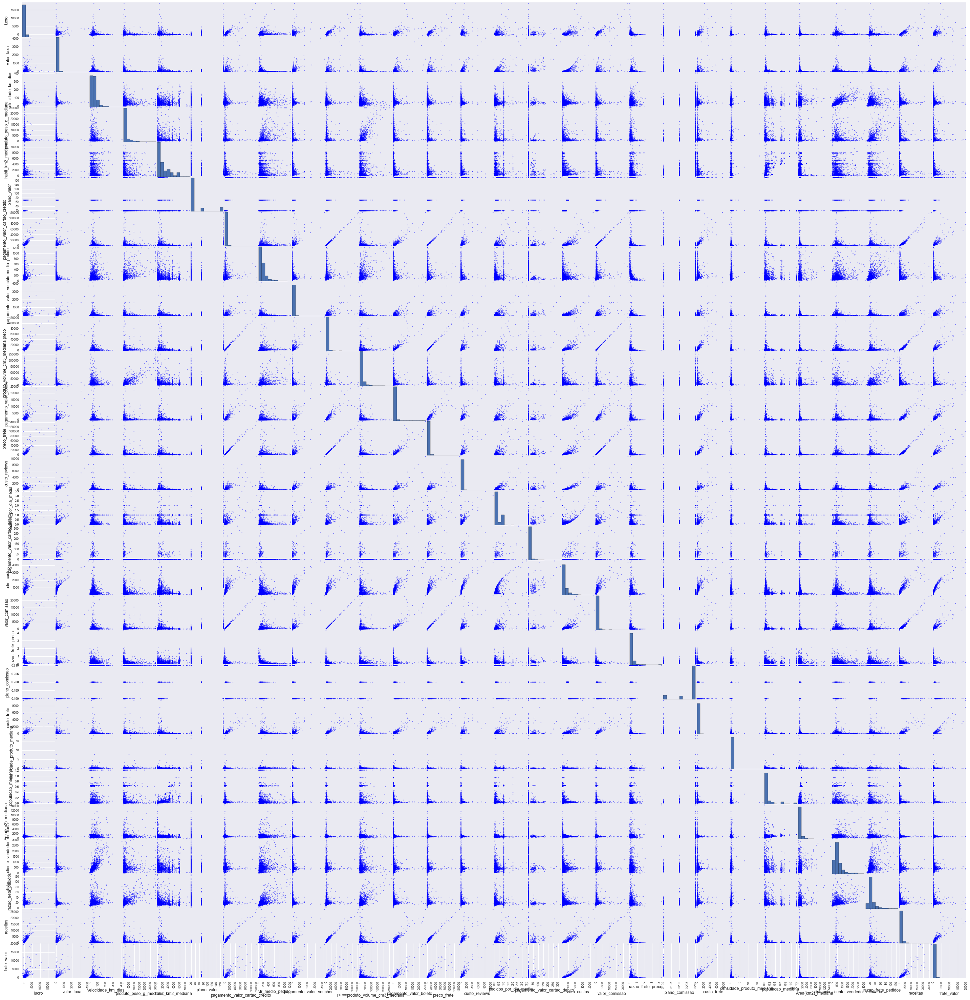

In [314]:
pd.plotting.scatter_matrix(df_abt[features_con],figsize=(45,45))
plt.show()

In [ ]:
Teorema Limite Central
https://www.youtube.com/watch?v=FoBRxYQmIZg
https://ichi.pro/pt/teorema-do-limite-central-clt-ciencia-de-dados-28330714933810
https://medium.com/data-hackers/o-que-realmente-um-teste-de-hip%C3%B3teses-quer-nos-dizer-b82801b03529
    requisitos para utilização do teorema central do limite em python

In [ ]:
#Variables catégorielles
for n in range(data_merge_3_cat.shape[1]):
    plt.figure(figsize=(10, 30))
    plot = sns.countplot(y=data_merge_3_cat.iloc[:, n], palette='Blues_r')
    plt.title(f"Distribution de {data_merge_3_cat.iloc[:,n].name}",
              fontsize=25)
    plt.xticks(fontsize=25)
    plt.yticks(fontsize=25)
    plt.savefig(f"{data_merge_3_cat.iloc[:, n].name}_dist.png",
                bbox_inches='tight')
    plt.show()

In [28]:
sns.distplot(df_abt[features_con], kde=False, color='Blue', ax=axes[0])
axes[0].axvline(df_abt[features_con].mean(), color='y', linestyle='--',linewidth=2)
axes[0].axvline(df_abt[features_con].median(), color='r', linestyle='dashed', linewidth=2)
axes[0].axvline(df_abt[features_con].mode()[0],color='g',linestyle='solid',linewidth=2)
axes[0].legend({'Mean':df_abt[features_con].mean(),'Median':df_abt[features_con].median(),'Mode':df_abt[features_con].mode()})


NameError: name 'axes' is not defined

In [27]:
sns.distplot(df_abt[features_con], bins=20, hist_kws={"density": True}, ax=ax[0])
#ax[0].set_title('Distribuição Normal', fontsize=14)
#ax[0].set_xlabel('Valor médio da distribuição = {}'.format(pop_normal.mean().round(2)), fontsize = 12)
#ax[0].set_yticks([])


TypeError: 'AxesSubplot' object is not subscriptable

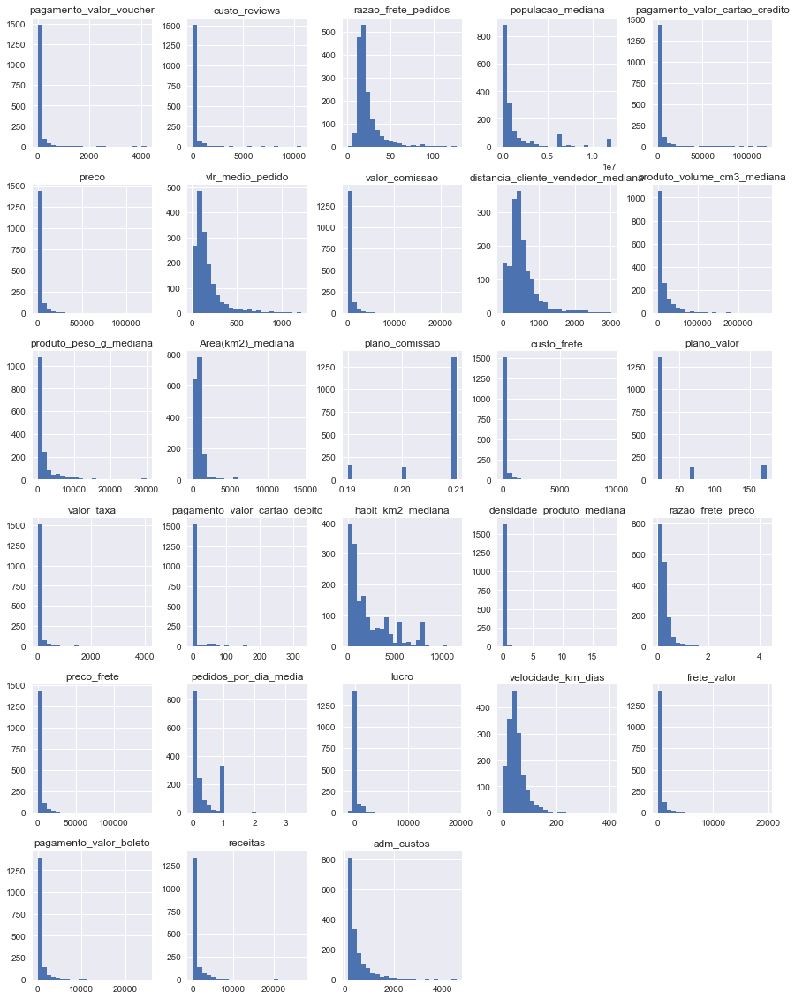

In [26]:
fig = plt.figure(figsize = (15,20))
ax = fig.gca()
df_abt[features_con].hist(ax=ax, bins=24);

In [ ]:
# find and remove correlated features
def correlation(dataset, threshold):
    col_corr=set() # Set of all the names of correlated Columns
    corr_matrix=dataset.corr(method = 'spearman')
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if corr_matrix.iloc[i,j]> threshold: # We are interested in absolute coefficient Value
                colname=corr_matrix.columns[i] # getting the name of column
                col_corr.add(colname)
    return col_corr



In [ ]:
def correlation_2(dataset, threshold_value):
    # Set of all the columns names which you want to deleted (remove string columns)
    columns_corr = set(('location', 'size')) 
    corr_matrix = dataset.corr()
    #print(corr_matrix)
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if (corr_matrix.iloc[i, j] >= threshold_value) and (corr_matrix.columns[j] not in columns_corr):
                # getting the name of column
                col_name = corr_matrix.columns[i] 
                columns_corr.add(col_name)
                if col_name in dataset.columns:
                    del dataset[col_name] # deleting the column from the dataset

    print(dataset)


In [ ]:
correlation(df_abt, 0.70)

In [ ]:
df_abt.drop(features_dropar, axis=1, inplace=True)